# Understanding the Data

Y -> There are 2 targets
 1. ADHD diagnosis (0- None, 1- ADHD)
 2. Sex (0- Male, 1 - Female)

X ->
1. Metadata A + B = Socio Demographics Information (Quantitative + Categorical)
2. Functional MRI Matrices  (Dont Touch)

Combine these 2 for EDA and Model Training.

---

### Data Files

- LABELS: ADHD diagnosis and sex.
- fMRI Connectome Matrices: High-dimensional numerical data representing brain connectivity.
- Socio-Demographic Data: A mix of categorical and numerical features (e.g., handedness, education level, parenting info, emotions).

---

Others

- Instrument_Description - Description about the types of Tests taken.
- EHQ – Edinburgh Handedness Questionnaire
- APQ –Alabama Parenting Questionnaire
- SDQ – Strength and Difficulties Questionnaire.

I believe these things are for knowledge and may be useful for features development and understanding.

---

# Exploratory Data Analysis (EDA)

✅ Missing data should be handled before checking relationships/correlations.

✅ Normalization/standardization should be done after checking relationships/correlations to avoid distorting the data.

In [18]:
import warnings
warnings.filterwarnings('ignore')

In [19]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## 1️⃣ Deeper Understanding of Data


✅ Steps:

- Load the dataset (CSV and Excel).
- Check the data structure: Number of rows & columns (df.shape).
- Inspect column names & data types (df.info()).
- Check the first few rows (df.head()).
Look at variable descriptions (refer to data dictionary).

In [20]:
# For Metadata A (Quantitative)
metadata_a = pd.read_excel("METADATA_A.xlsx")
metadata_a.head()

,participant_id,EHQ_EHQ_Total,ColorVision_CV_Score,APQ_P_APQ_P_CP,APQ_P_APQ_P_ID,APQ_P_APQ_P_INV,APQ_P_APQ_P_OPD,APQ_P_APQ_P_PM,APQ_P_APQ_P_PP,SDQ_SDQ_Conduct_Problems,SDQ_SDQ_Difficulties_Total,SDQ_SDQ_Emotional_Problems,SDQ_SDQ_Externalizing,SDQ_SDQ_Generating_Impact,SDQ_SDQ_Hyperactivity,SDQ_SDQ_Internalizing,SDQ_SDQ_Peer_Problems,SDQ_SDQ_Prosocial,MRI_Track_Age_at_Scan
0,UmrK0vMLopoR,40.00,13,3,10,47,13,11,28,0,6,1,5,0,5,1,0,10,NaN
1,CPaeQkhcjg7d,-94.47,14,3,13,34,18,23,30,0,18,6,8,7,8,10,4,5,NaN
2,Nb4EetVPm3gs,-46.67,14,4,10,35,16,10,29,1,14,2,8,5,7,6,4,9,8.239904
3,p4vPhVu91o4b,-26.68,10,5,12,39,19,16,28,6,24,4,16,9,10,8,4,6,NaN
4,M09PXs7arQ5E,0.00,14,5,15,40,20,24,28,1,18,4,11,4,10,7,3,9,8.940679


In [21]:
print(metadata_a.shape)  # Rows & Columns (1213, 19)
print(metadata_a.isnull().sum()) # missing Values

(1213, 19)
participant_id                  0
EHQ_EHQ_Total                   0
ColorVision_CV_Score            0
APQ_P_APQ_P_CP                  0
APQ_P_APQ_P_ID                  0
APQ_P_APQ_P_INV                 0
APQ_P_APQ_P_OPD                 0
APQ_P_APQ_P_PM                  0
APQ_P_APQ_P_PP                  0
SDQ_SDQ_Conduct_Problems        0
SDQ_SDQ_Difficulties_Total      0
SDQ_SDQ_Emotional_Problems      0
SDQ_SDQ_Externalizing           0
SDQ_SDQ_Generating_Impact       0
SDQ_SDQ_Hyperactivity           0
SDQ_SDQ_Internalizing           0
SDQ_SDQ_Peer_Problems           0
SDQ_SDQ_Prosocial               0
MRI_Track_Age_at_Scan         360
dtype: int64


In [22]:
print(metadata_a.info())  # Data types
print(metadata_a.describe()) # Summary

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1213 entries, 0 to 1212
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   participant_id              1213 non-null   object 
 1   EHQ_EHQ_Total               1213 non-null   float64
 2   ColorVision_CV_Score        1213 non-null   int64  
 3   APQ_P_APQ_P_CP              1213 non-null   int64  
 4   APQ_P_APQ_P_ID              1213 non-null   int64  
 5   APQ_P_APQ_P_INV             1213 non-null   int64  
 6   APQ_P_APQ_P_OPD             1213 non-null   int64  
 7   APQ_P_APQ_P_PM              1213 non-null   int64  
 8   APQ_P_APQ_P_PP              1213 non-null   int64  
 9   SDQ_SDQ_Conduct_Problems    1213 non-null   int64  
 10  SDQ_SDQ_Difficulties_Total  1213 non-null   int64  
 11  SDQ_SDQ_Emotional_Problems  1213 non-null   int64  
 12  SDQ_SDQ_Externalizing       1213 non-null   int64  
 13  SDQ_SDQ_Generating_Impact   1213 

In [23]:
# For Metadata B  (Categorical)
metadata_b = pd.read_excel("METADATA_B.xlsx")
metadata_b.head()

,participant_id,Basic_Demos_Enroll_Year,Basic_Demos_Study_Site,PreInt_Demos_Fam_Child_Ethnicity,PreInt_Demos_Fam_Child_Race,MRI_Track_Scan_Location,Barratt_Barratt_P1_Edu,Barratt_Barratt_P1_Occ,Barratt_Barratt_P2_Edu,Barratt_Barratt_P2_Occ
0,UmrK0vMLopoR,2016,1,0.0,0,1,21,45,21,45
1,CPaeQkhcjg7d,2019,3,1.0,2,3,15,15,0,0
2,Nb4EetVPm3gs,2016,1,1.0,8,1,18,40,0,0
3,p4vPhVu91o4b,2018,3,0.0,8,3,15,30,18,0
4,M09PXs7arQ5E,2019,3,0.0,1,3,15,20,0,0


In [24]:
print(metadata_b.shape)  # Rows & Columns (1213, 10)
print(metadata_b.isnull().sum()) # missing Values

(1213, 10)
participant_id                       0
Basic_Demos_Enroll_Year              0
Basic_Demos_Study_Site               0
PreInt_Demos_Fam_Child_Ethnicity    11
PreInt_Demos_Fam_Child_Race          0
MRI_Track_Scan_Location              0
Barratt_Barratt_P1_Edu               0
Barratt_Barratt_P1_Occ               0
Barratt_Barratt_P2_Edu               0
Barratt_Barratt_P2_Occ               0
dtype: int64


In [25]:
print(metadata_b.info())  # Data types
print(metadata_b.describe()) # Summary

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1213 entries, 0 to 1212
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   participant_id                    1213 non-null   object 
 1   Basic_Demos_Enroll_Year           1213 non-null   int64  
 2   Basic_Demos_Study_Site            1213 non-null   int64  
 3   PreInt_Demos_Fam_Child_Ethnicity  1202 non-null   float64
 4   PreInt_Demos_Fam_Child_Race       1213 non-null   int64  
 5   MRI_Track_Scan_Location           1213 non-null   int64  
 6   Barratt_Barratt_P1_Edu            1213 non-null   int64  
 7   Barratt_Barratt_P1_Occ            1213 non-null   int64  
 8   Barratt_Barratt_P2_Edu            1213 non-null   int64  
 9   Barratt_Barratt_P2_Occ            1213 non-null   int64  
dtypes: float64(1), int64(8), object(1)
memory usage: 94.9+ KB
None
       Basic_Demos_Enroll_Year  Basic_Demos_Study_Site  \
count      

In [26]:
# For Functional MRI Matrices
fmri_matrices = pd.read_csv("FUNCTIONAL_CONNECTOME_MATRICES.csv")
fmri_matrices.head()

,participant_id,0throw_1thcolumn,0throw_2thcolumn,0throw_3thcolumn,0throw_4thcolumn,0throw_5thcolumn,0throw_6thcolumn,0throw_7thcolumn,0throw_8thcolumn,0throw_9thcolumn,...,195throw_196thcolumn,195throw_197thcolumn,195throw_198thcolumn,195throw_199thcolumn,196throw_197thcolumn,196throw_198thcolumn,196throw_199thcolumn,197throw_198thcolumn,197throw_199thcolumn,198throw_199thcolumn
0,70z8Q2xdTXM3,0.093473,0.146902,0.067893,0.015141,0.070221,0.063997,0.055382,-0.035335,0.068583,...,0.003404,-0.010359,-0.050968,-0.014365,0.128066,0.112646,-0.058980,0.028228,0.133582,0.143372
1,WHWymJu6zNZi,0.029580,0.179323,0.112933,0.038291,0.104899,0.064250,0.008488,0.077505,-0.004750,...,-0.008409,-0.008479,0.020891,0.017754,0.094040,0.035141,0.032537,0.075007,0.115350,0.138200
2,4PAQp1M6EyAo,-0.051580,0.139734,0.068295,0.046991,0.111085,0.026978,0.151377,0.021198,0.083721,...,0.053245,-0.028003,0.028773,0.024556,0.166343,0.058925,0.035485,0.063661,0.042862,0.162162
3,obEacy4Of68I,0.016273,0.204702,0.115980,0.043103,0.056431,0.057615,0.055773,0.075030,0.001033,...,-0.023918,-0.005356,0.018607,0.016193,0.072955,0.130135,0.056120,0.084784,0.114148,0.190584
4,s7WzzDcmDOhF,0.065771,0.098714,0.097604,0.112988,0.071139,0.085607,0.019392,-0.036403,-0.020375,...,0.066439,-0.076680,-0.047530,-0.031443,0.221213,0.007343,0.005763,0.083820,0.079582,0.067269


In [27]:
print(fmri_matrices.shape)  # Rows & Columns (1213, 19901)
print(fmri_matrices.isnull().sum()) # missing Values

(1213, 19901)
participant_id          0
0throw_1thcolumn        0
0throw_2thcolumn        0
0throw_3thcolumn        0
0throw_4thcolumn        0
                       ..
196throw_198thcolumn    0
196throw_199thcolumn    0
197throw_198thcolumn    0
197throw_199thcolumn    0
198throw_199thcolumn    0
Length: 19901, dtype: int64


In [28]:
print(fmri_matrices.info())  # Data types
# print(fmri_matrices.describe()) # Summary

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1213 entries, 0 to 1212
Columns: 19901 entries, participant_id to 198throw_199thcolumn
dtypes: float64(19900), object(1)
memory usage: 184.2+ MB
None


In [42]:
targets = pd.read_excel("LABELS.xlsx")
targets.head()

,participant_id,ADHD_Outcome,Sex_F
0,UmrK0vMLopoR,1,1
1,CPaeQkhcjg7d,1,0
2,Nb4EetVPm3gs,1,0
3,p4vPhVu91o4b,1,1
4,M09PXs7arQ5E,1,1


In [43]:
print(targets.shape)  # Rows & Columns (1213, 3)
print(targets.isnull().sum()) # missing Values

(1213, 3)
participant_id    0
ADHD_Outcome      0
Sex_F             0
dtype: int64


In [44]:
print(targets.describe())

       ADHD_Outcome        Sex_F
count   1213.000000  1213.000000
mean       0.685078     0.342951
std        0.464676     0.474891
min        0.000000     0.000000
25%        0.000000     0.000000
50%        1.000000     0.000000
75%        1.000000     1.000000
max        1.000000     1.000000


In [45]:
print(targets.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1213 entries, 0 to 1212
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   participant_id  1213 non-null   object
 1   ADHD_Outcome    1213 non-null   int64 
 2   Sex_F           1213 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 28.6+ KB
None


💡Insights (Missing Values)
- METADATA A  (1213, 19)- MRI_Track_Age_at_Scan - 360
- METADATA B  (1213, 10)- PreInt_Demos_Fam_Child_Ethnicity - 11
- fmri_matrices (1213, 19901) - No missing Values (Thank god)
- targets (1213, 3) - No missing values. (as it should)

- Total Features = 18+9+19900 = 19927 (not including participant_id)
---

### 2️⃣ Data Cleaning & Handling Missing Values

✅ Steps:

- Decide how to handle NaNs:
-- Drop rows (df.dropna()).
-- Fill with mean/median (df.fillna(df.mean())).
-- Fill categorical NaNs with mode (df.fillna(df.mode()[0])).

- Remove duplicates (df.duplicated().sum() → df.drop_duplicates()).
- Fix inconsistencies (e.g., standardize categorical values: "Male"/"male" → "Male").

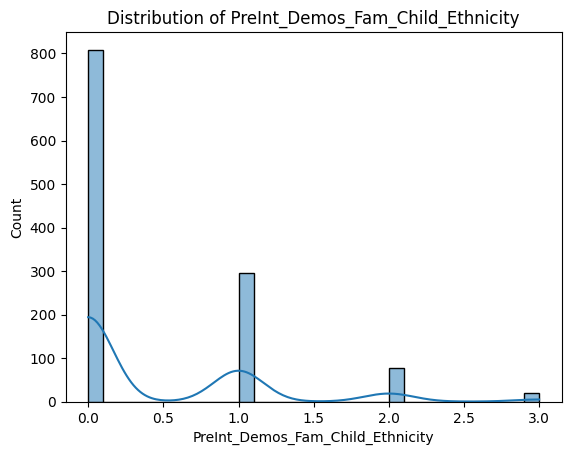

Mean: 0.4242928452579035
Median: 0.0
Skewness: 1.6369192640803953


In [29]:
sns.histplot(metadata_b['PreInt_Demos_Fam_Child_Ethnicity'], bins=30, kde=True)
plt.title("Distribution of PreInt_Demos_Fam_Child_Ethnicity")
plt.show()

print("Mean:", metadata_b['PreInt_Demos_Fam_Child_Ethnicity'].mean())
print("Median:", metadata_b['PreInt_Demos_Fam_Child_Ethnicity'].median())
print("Skewness:", metadata_b['PreInt_Demos_Fam_Child_Ethnicity'].skew())

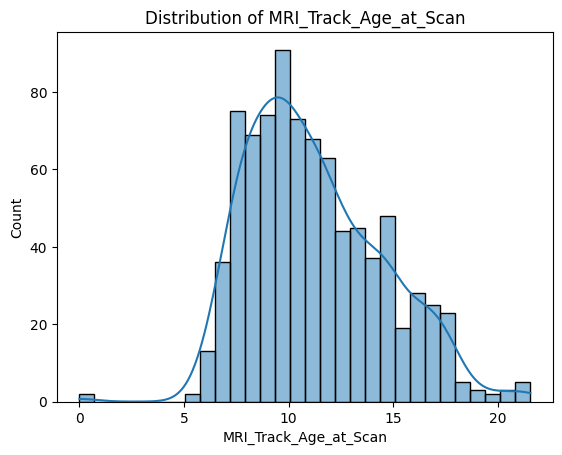

Mean: 11.245678424384526
Median: 10.739219
Skewness: 0.5439319399076084


In [30]:
# Distribution on MRI Track Age at Scan
sns.histplot(metadata_a['MRI_Track_Age_at_Scan'], bins=30, kde=True)
plt.title("Distribution of MRI_Track_Age_at_Scan")
plt.show()

print("Mean:", metadata_a['MRI_Track_Age_at_Scan'].mean())
print("Median:", metadata_a['MRI_Track_Age_at_Scan'].median())
print("Skewness:", metadata_a['MRI_Track_Age_at_Scan'].skew())

# If skew > 0.5 or < -0.5, it is skewed
# If data is l/R Skewed -> Medium (For better distribution)
# If data is bell shaped -> Mean

In [31]:
# Fill missing values in Metadata A (Quantitative)
metadata_a['MRI_Track_Age_at_Scan'] = metadata_a['MRI_Track_Age_at_Scan'].fillna(metadata_a['MRI_Track_Age_at_Scan'].median())

# Fill missing values in Metadata B (Categorical)
metadata_b['PreInt_Demos_Fam_Child_Ethnicity'] = metadata_b['PreInt_Demos_Fam_Child_Ethnicity'].fillna(3.0) # Filling with unkown float type

print("MRI_Track_Age_at_Scan missing count:", metadata_a['MRI_Track_Age_at_Scan'].isnull().sum())
print("PreInt_Demos_Fam_Child_Ethnicity missing count:", metadata_b['PreInt_Demos_Fam_Child_Ethnicity'].isnull().sum())


MRI_Track_Age_at_Scan missing count: 0
PreInt_Demos_Fam_Child_Ethnicity missing count: 0


In [32]:
metadata_a.duplicated().sum()

0

In [33]:
metadata_b.duplicated().sum()

0

### 3️⃣ Feature Understanding & Exploration

💡 Goal: Analyze the features, distributions, and relationships
- Choose what to use for and learn what each represent!!

✅ Steps:

### A. Univariate Analysis (Individual Feature Analysis)

📊 For numerical variables:

- Summary statistics (df.describe()).
- Histograms (sns.histplot(df['column'])).
- Box plots (to check for outliers).

📊 For categorical variables:

- Value counts (df['column'].value_counts()).
- Bar plots (sns.countplot(x=df['column'])).

### B. Bivariate Analysis (Feature-to-Feature Relationships)
📌 Numerical vs. Numerical:

- Correlation matrix (df.corr(), sns.heatmap(df.corr())).
- Scatter plots (sns.scatterplot(x='feature1', y='feature2', data=df)).

📌 Categorical vs. Numerical:

- Boxplots (sns.boxplot(x='category', y='numerical', data=df)).
- Groupby statistics (df.groupby('category')['numerical'].mean()).

📌 Categorical vs. Categorical:

- Cross-tabulation (pd.crosstab(df['cat1'], df['cat2'])).
- Stacked bar charts.

###  A: Histplot and Boxplot for all "Numerical" Features

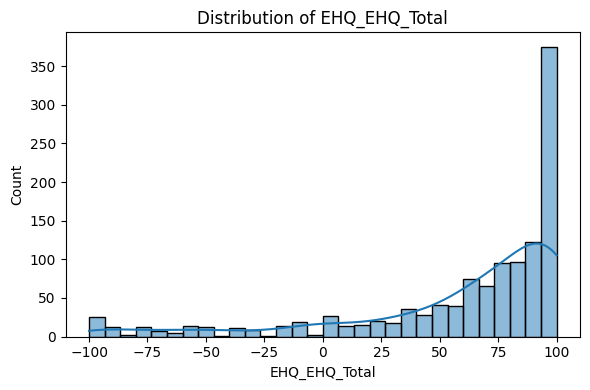

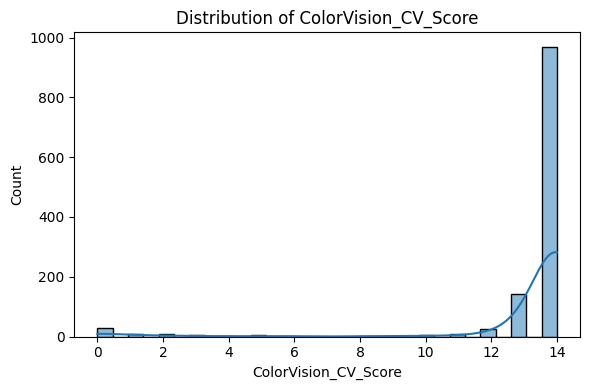

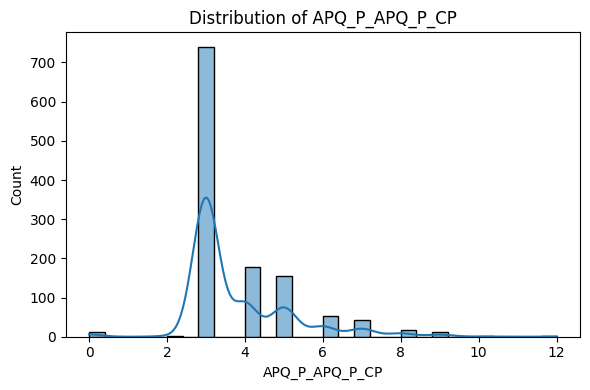

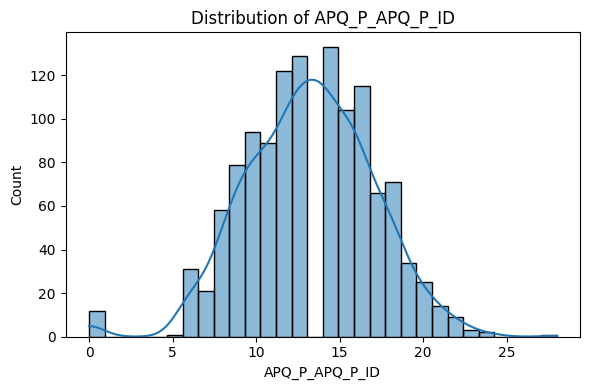

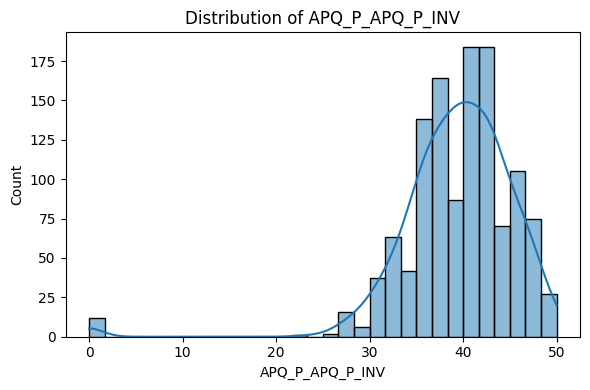

...

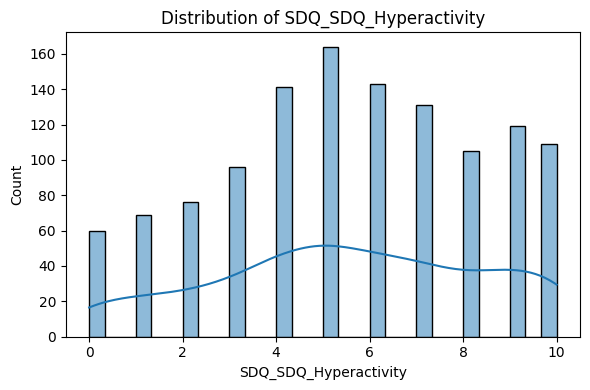

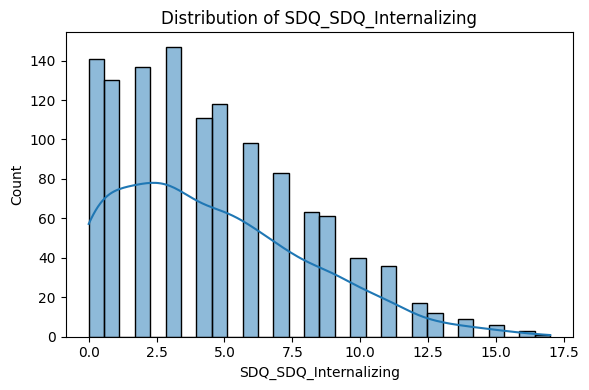

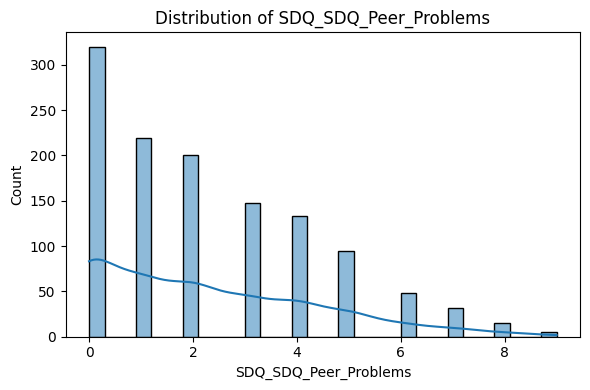

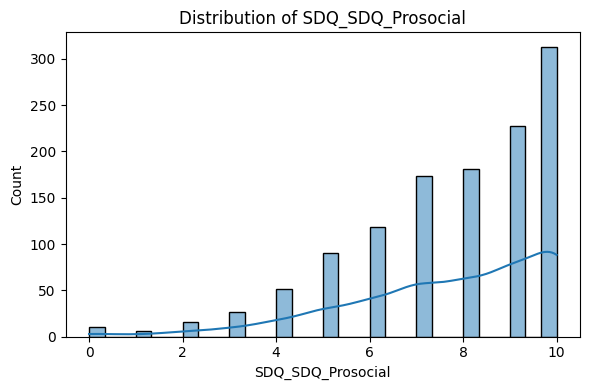

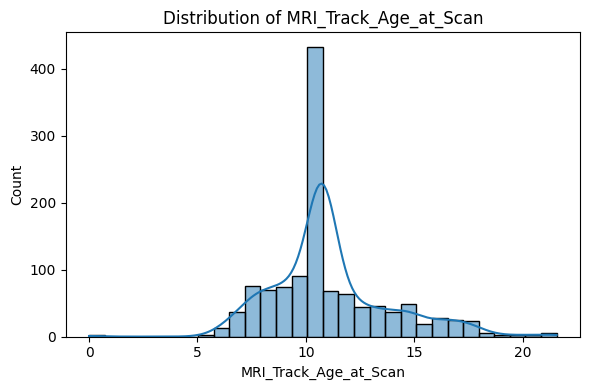

In [35]:


numerical_cols = metadata_a.select_dtypes(include=['number']).columns

for col in numerical_cols:
    plt.figure(figsize=(6,4))
    sns.histplot(metadata_a[col], bins=30, kde=True)
    plt.title(f"Distribution of {col}")
    plt.tight_layout()
    plt.show()




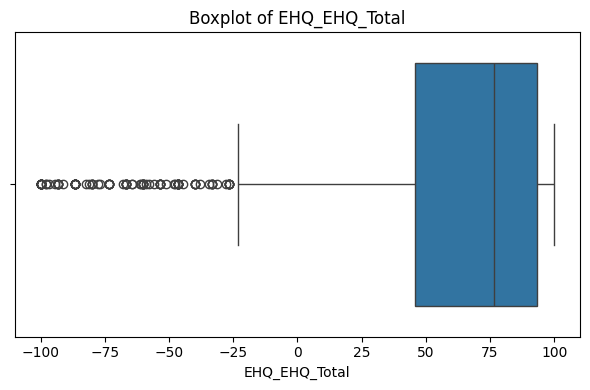

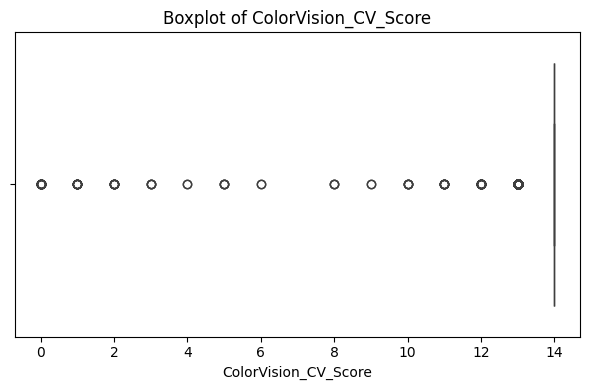

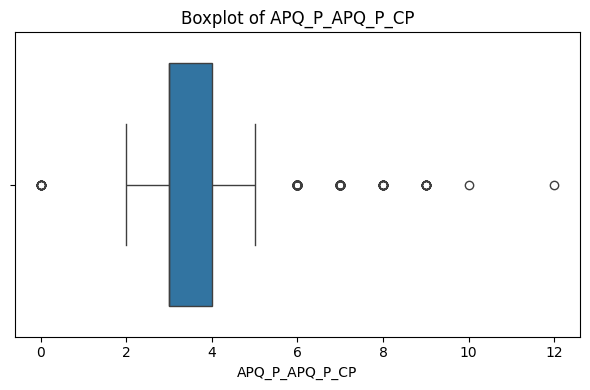

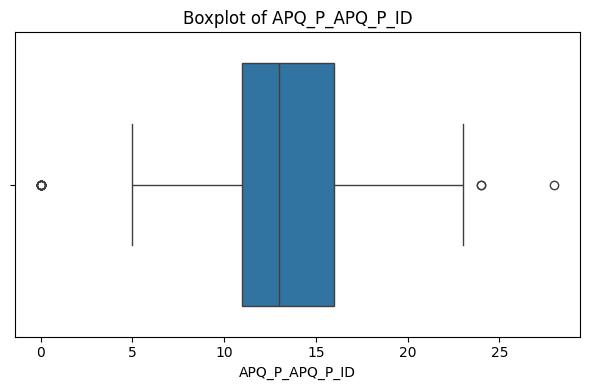

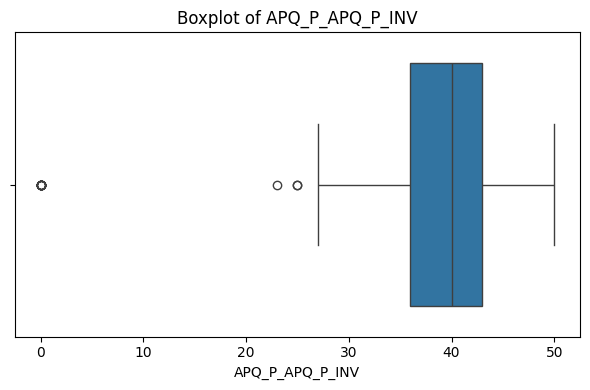

...

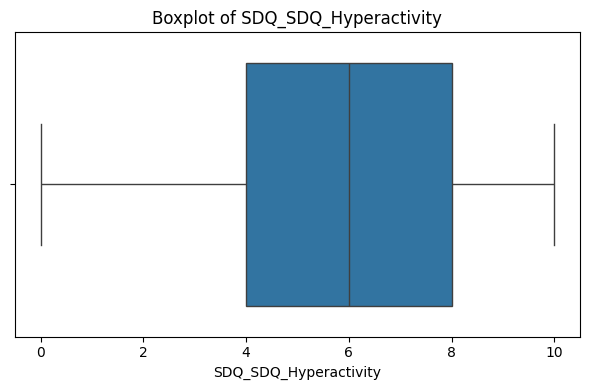

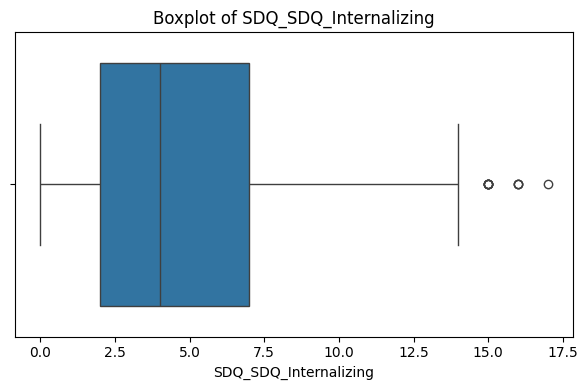

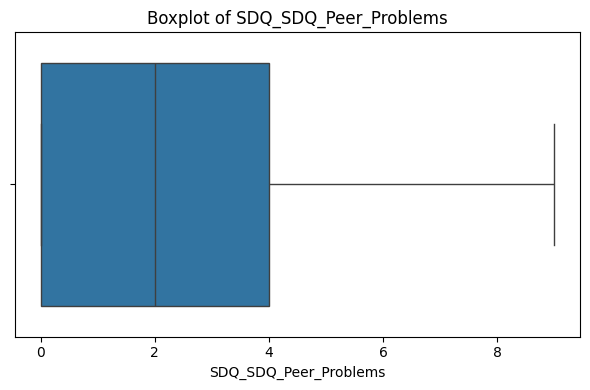

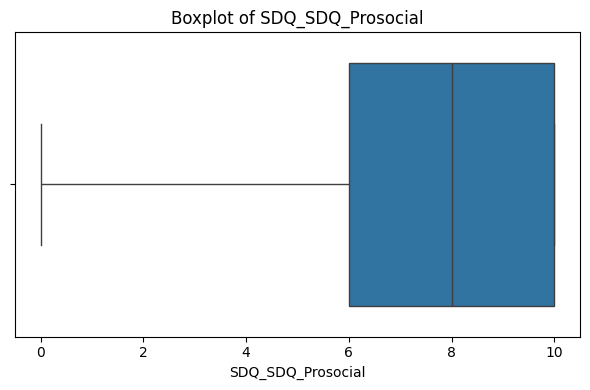

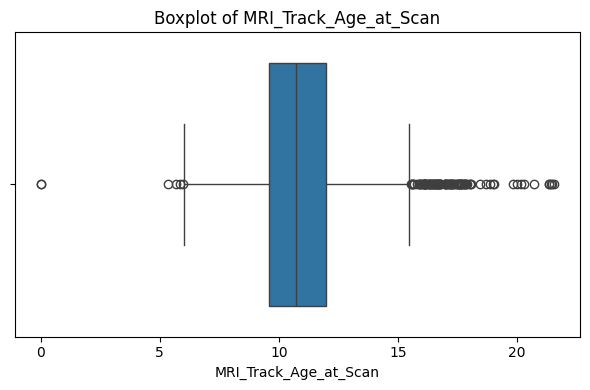

In [36]:
for col in numerical_cols:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=metadata_a[col])
    plt.title(f"Boxplot of {col}")
    plt.tight_layout()
    plt.show()

### A: Countplot for all "Categorical" Features

In [38]:
metadata_b.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1213 entries, 0 to 1212
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   participant_id                    1213 non-null   object 
 1   Basic_Demos_Enroll_Year           1213 non-null   int64  
 2   Basic_Demos_Study_Site            1213 non-null   int64  
 3   PreInt_Demos_Fam_Child_Ethnicity  1213 non-null   float64
 4   PreInt_Demos_Fam_Child_Race       1213 non-null   int64  
 5   MRI_Track_Scan_Location           1213 non-null   int64  
 6   Barratt_Barratt_P1_Edu            1213 non-null   int64  
 7   Barratt_Barratt_P1_Occ            1213 non-null   int64  
 8   Barratt_Barratt_P2_Edu            1213 non-null   int64  
 9   Barratt_Barratt_P2_Occ            1213 non-null   int64  
dtypes: float64(1), int64(8), object(1)
memory usage: 94.9+ KB


In [39]:
# # Plot value counts and count plots for all categorical variables
# categorical_cols = metadata_b.select_dtypes(include=['category', 'object']).columns

# for col in categorical_cols:
#     print(f"\n {col} Value Counts:")
#     print(metadata_b[col].value_counts())

#     plt.figure(figsize=(8,4))
#     sns.countplot(x=metadata_b[col])
#     plt.title(f"Count Plot of {col}")
#     plt.xticks(rotation=45)
#     plt.show()


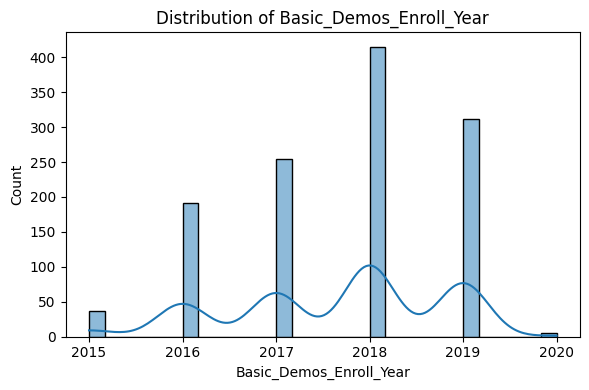

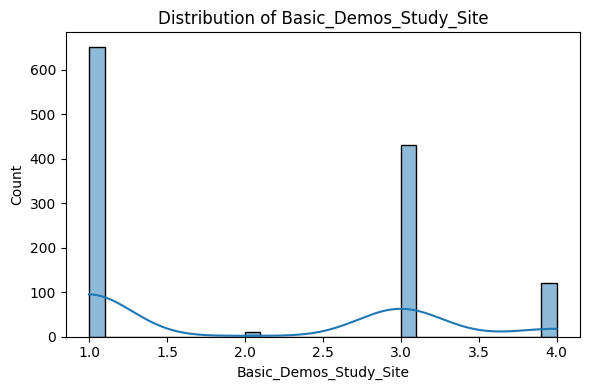

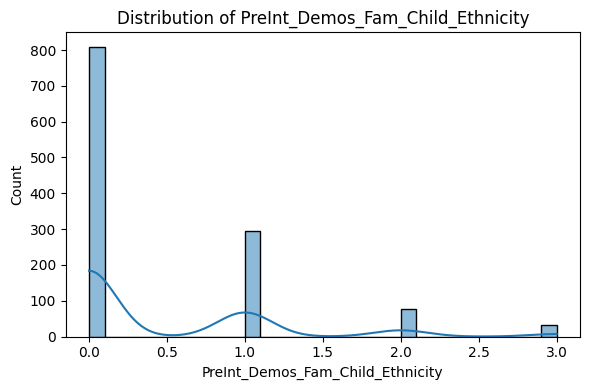

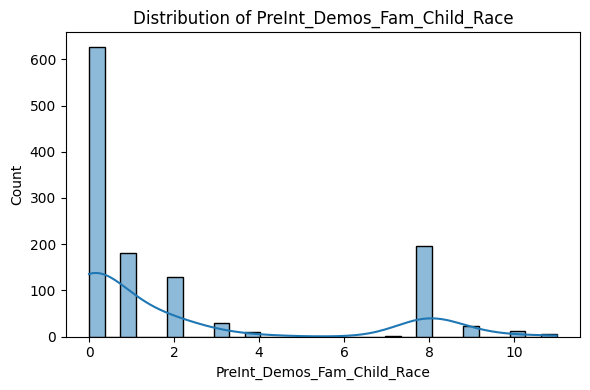

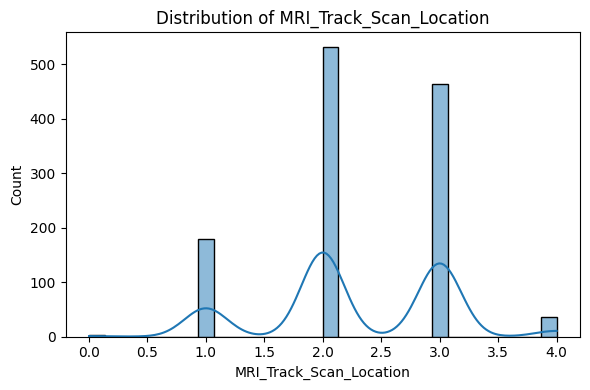

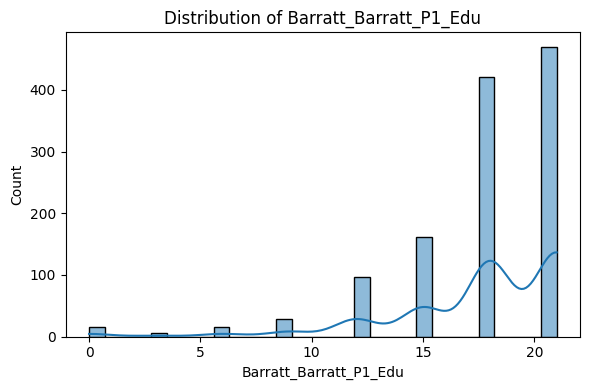

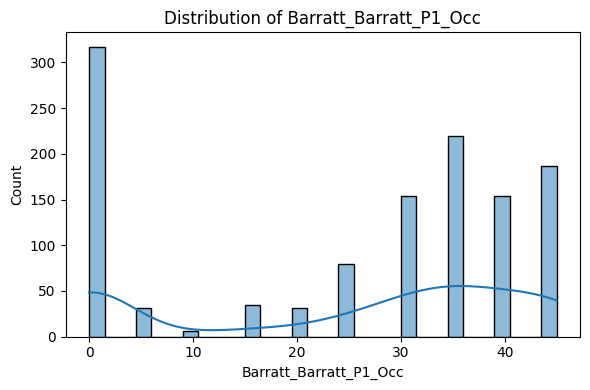

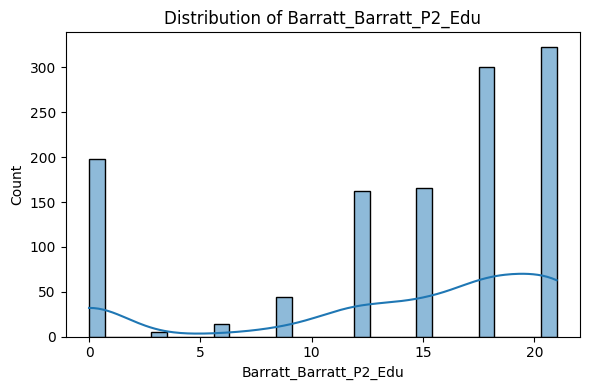

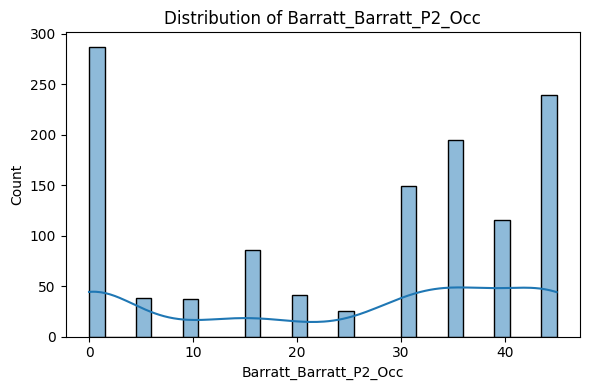

In [40]:
categorical_cols = metadata_b.select_dtypes(include=['number']).columns

for col in categorical_cols:
    plt.figure(figsize=(6,4))
    sns.histplot(metadata_b[col], bins=30, kde=True)
    plt.title(f"Distribution of {col}")
    plt.tight_layout()
    plt.show()

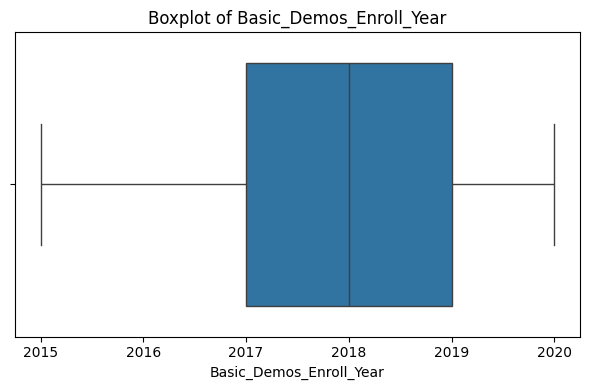

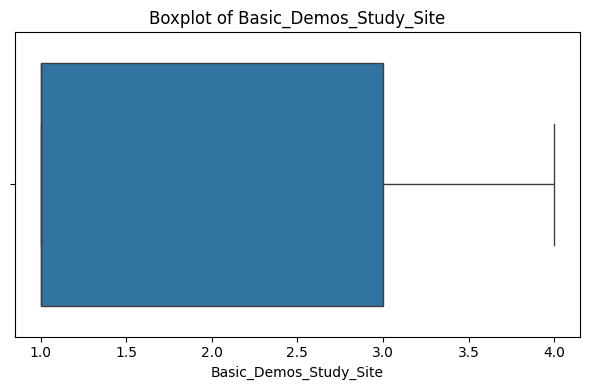

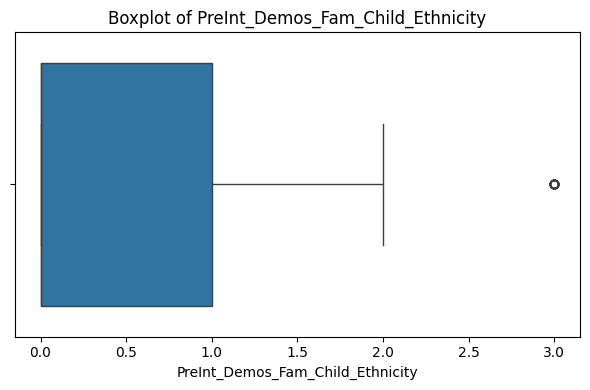

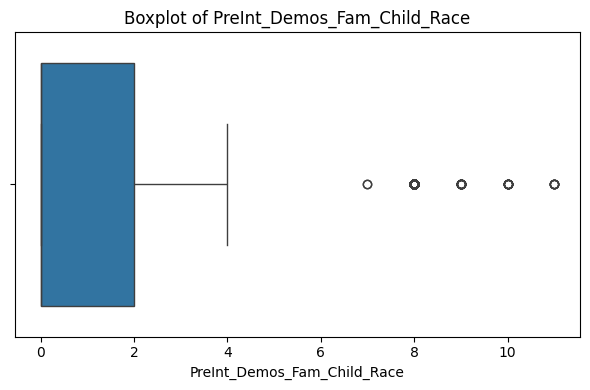

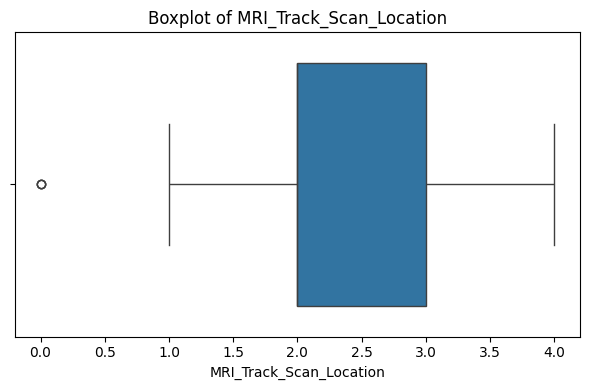

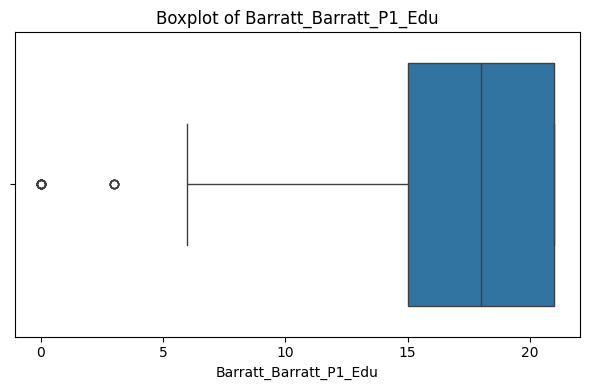

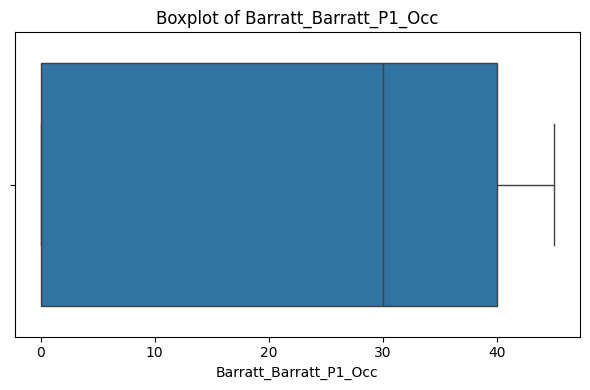

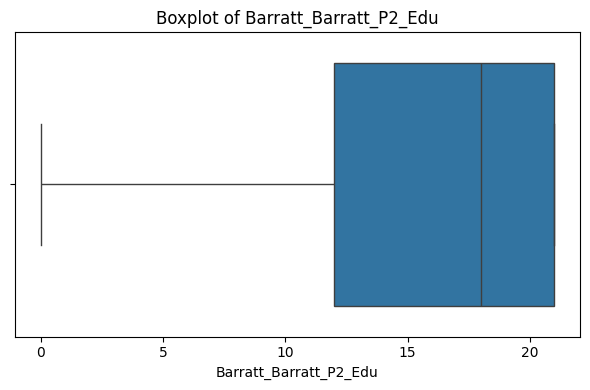

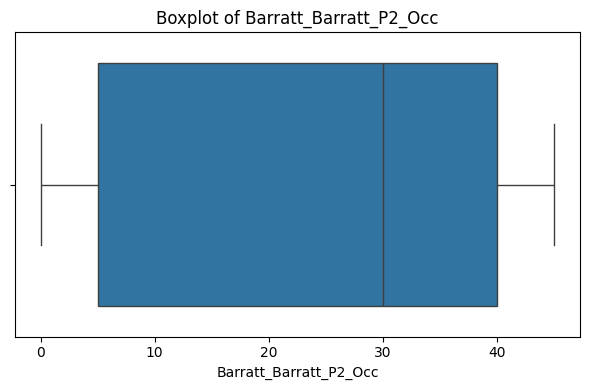

In [41]:
for col in categorical_cols:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=metadata_b[col])
    plt.title(f"Boxplot of {col}")
    plt.tight_layout()
    plt.show()

## The categorical data are not in object type, they are in numerical types like float and int. Only one type is in Object!



#### Label Encoder

- The categories have a logical order (e.g., Education Level: Primary < High School < University).
- To use with models that understand ordinal relationships, such as Decision Trees, Random Forests, or Gradient Boosting.
- Note: No need to use label encoder for the Target as they are in 0 or 1 format.

#### One-hot encoding when:

-  The categorical values have no ordinal relationship (e.g., Ethnicity, Gender, Marital Status).
-  To use with models like Linear Regression, Logistic Regression, or Neural Networks, where categorical relationships are not inherently understood.
- The number of unique categories is relatively small (e.g., < 20).

#### B. Bivariate Analysis (Feature-to-Feature Relationships)
1️⃣ Numerical vs. Numerical (Correlation Matrix & Scatter Plots)

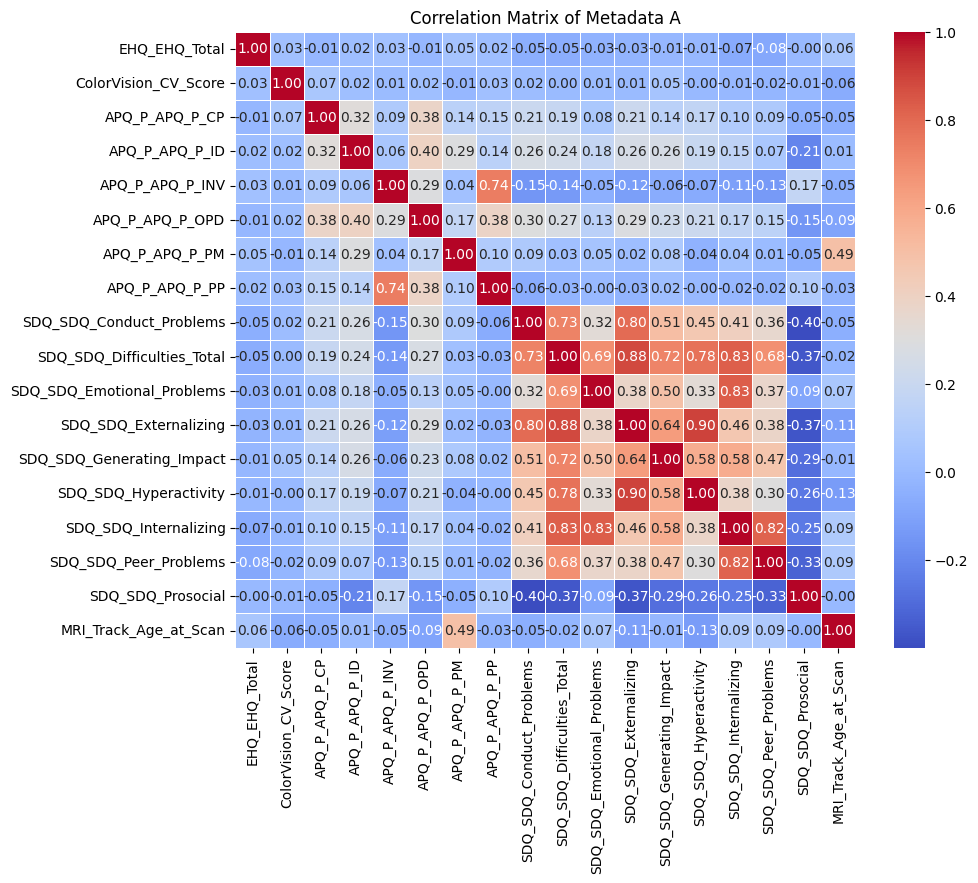

In [47]:
# Correlation matrix
# Select only numerical columns
numerical_metadata_a = metadata_a.select_dtypes(include=['number'])

# Correlation matrix
plt.figure(figsize=(10,8))
sns.heatmap(numerical_metadata_a.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Metadata A")
plt.show()


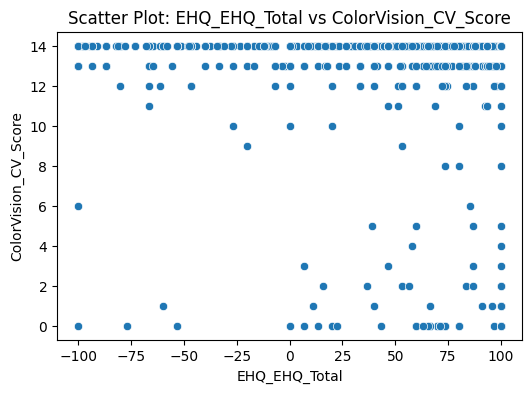

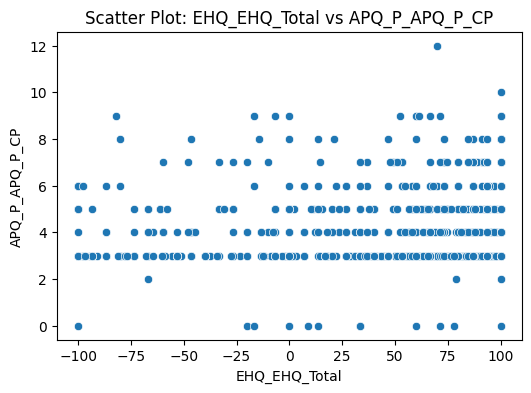

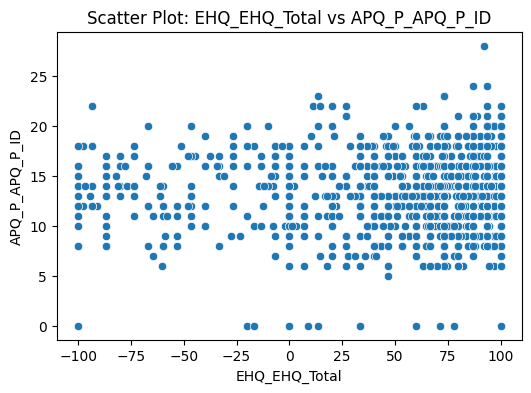

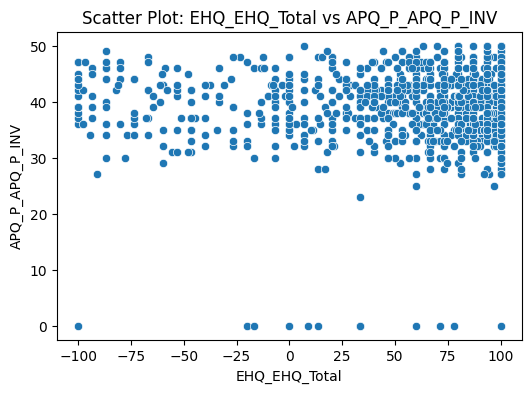

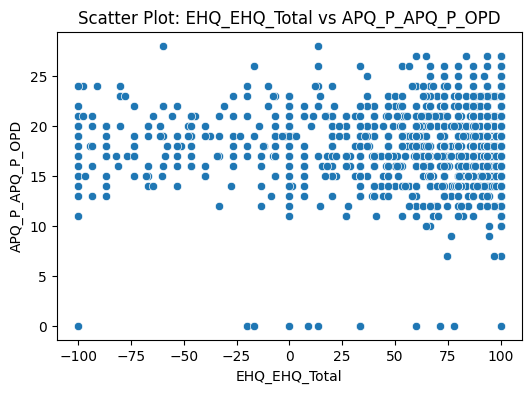

...

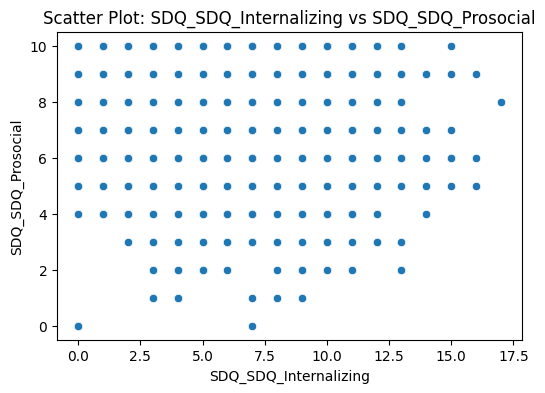

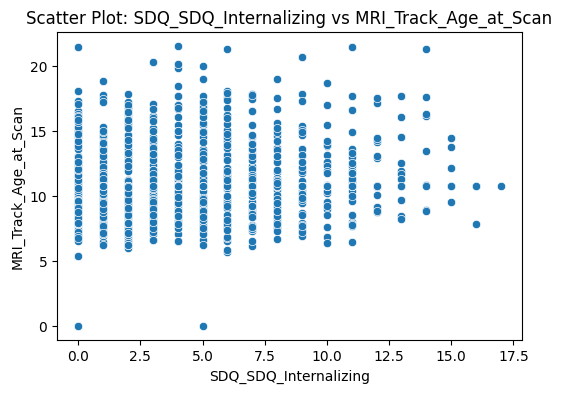

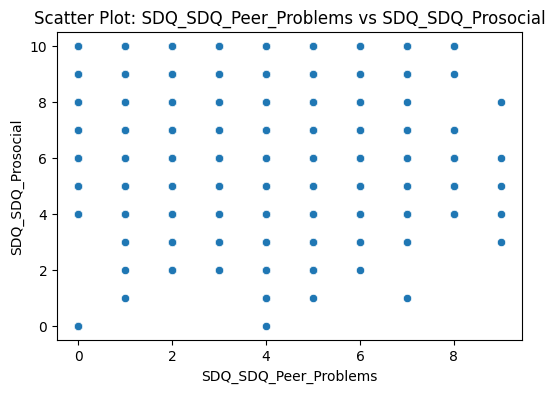

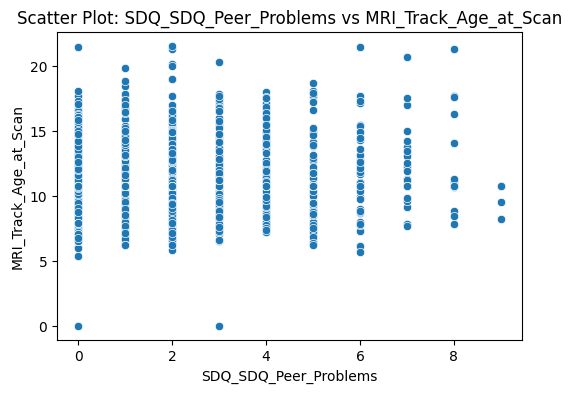

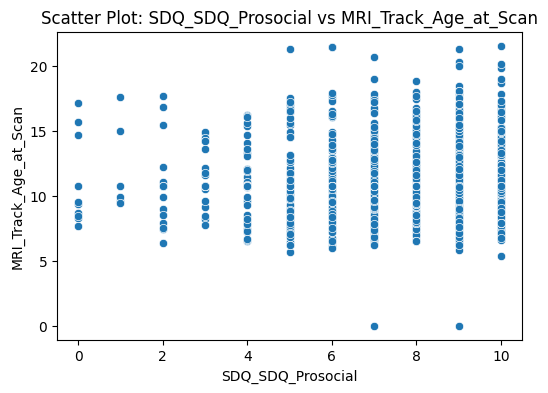

In [48]:

# Scatter plots for all numerical pairs
num_cols = numerical_metadata_a.columns

for i in range(len(num_cols)):
    for j in range(i+1, len(num_cols)):
        plt.figure(figsize=(6,4))
        sns.scatterplot(x=numerical_metadata_a[num_cols[i]], y=numerical_metadata_a[num_cols[j]])
        plt.title(f"Scatter Plot: {num_cols[i]} vs {num_cols[j]}")
        plt.show()

2️⃣ Categorical vs. Numerical (Boxplots & Groupby Analysis)

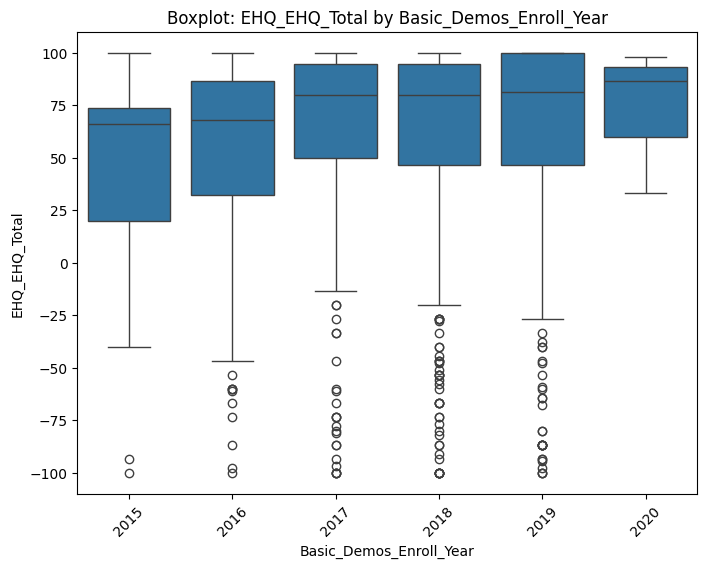


📊 Average EHQ_EHQ_Total per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    47.821944
2016    51.901885
2017    61.262008
2018    59.696289
2019    61.144808
2020    74.232000
Name: EHQ_EHQ_Total, dtype: float64


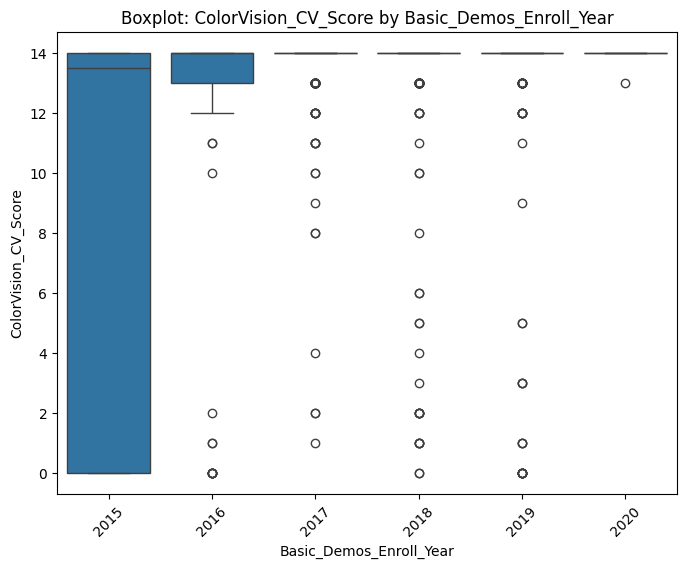


📊 Average ColorVision_CV_Score per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015     9.083333
2016    12.973822
2017    13.456693
2018    13.375904
2019    13.224359
2020    13.800000
Name: ColorVision_CV_Score, dtype: float64


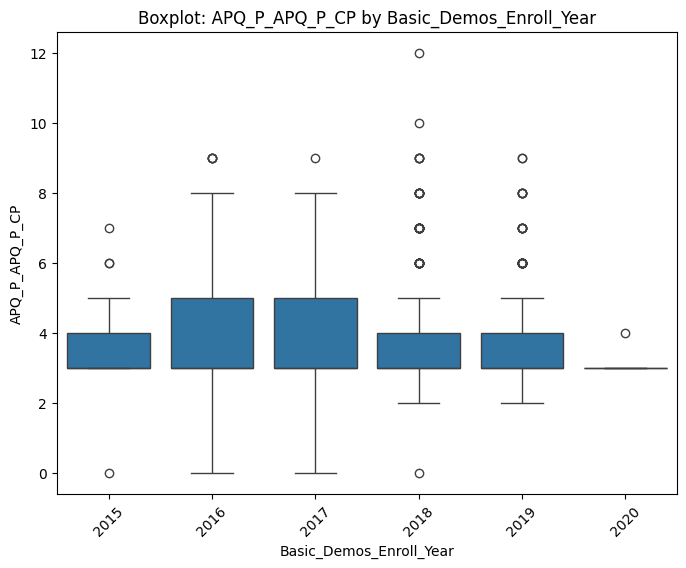


📊 Average APQ_P_APQ_P_CP per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    3.583333
2016    3.921466
2017    3.779528
2018    3.802410
2019    3.701923
2020    3.200000
Name: APQ_P_APQ_P_CP, dtype: float64


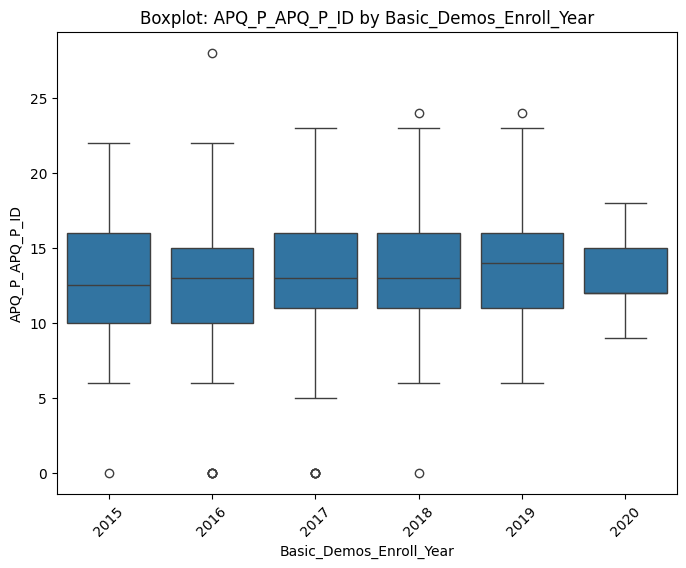


📊 Average APQ_P_APQ_P_ID per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    12.805556
2016    12.591623
2017    13.122047
2018    13.426506
2019    13.400641
2020    13.200000
Name: APQ_P_APQ_P_ID, dtype: float64


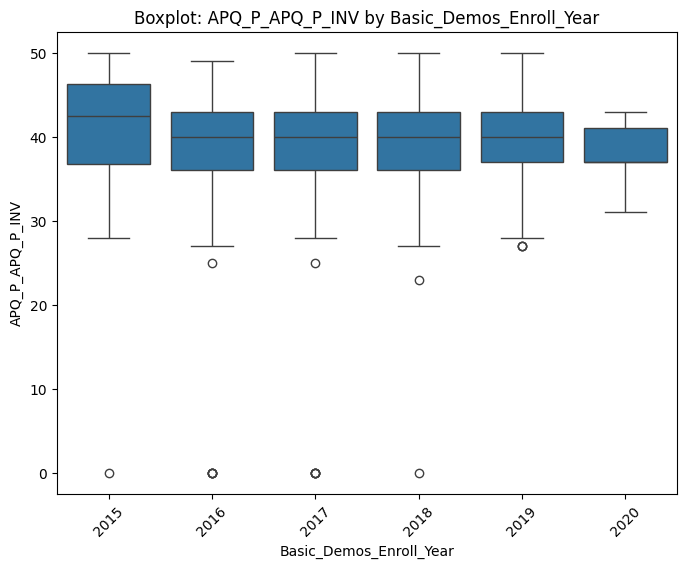


📊 Average APQ_P_APQ_P_INV per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    40.333333
2016    38.685864
2017    39.153543
2018    39.457831
2019    39.778846
2020    37.800000
Name: APQ_P_APQ_P_INV, dtype: float64


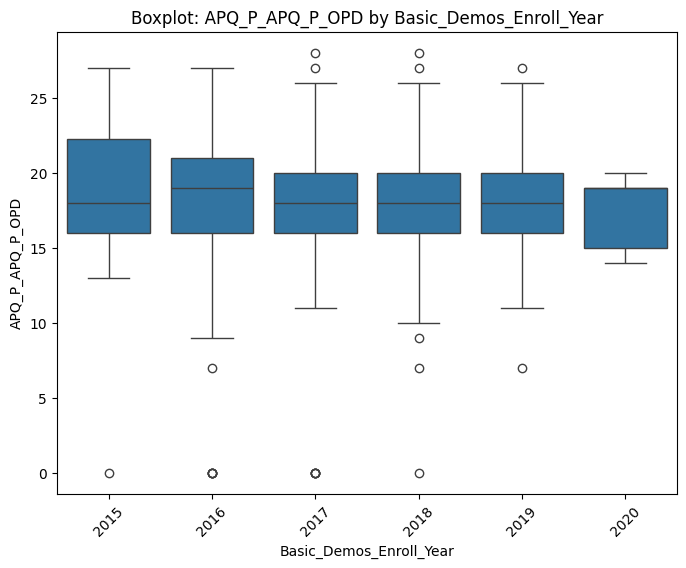


📊 Average APQ_P_APQ_P_OPD per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    18.611111
2016    17.984293
2017    17.618110
2018    17.725301
2019    17.791667
2020    17.400000
Name: APQ_P_APQ_P_OPD, dtype: float64


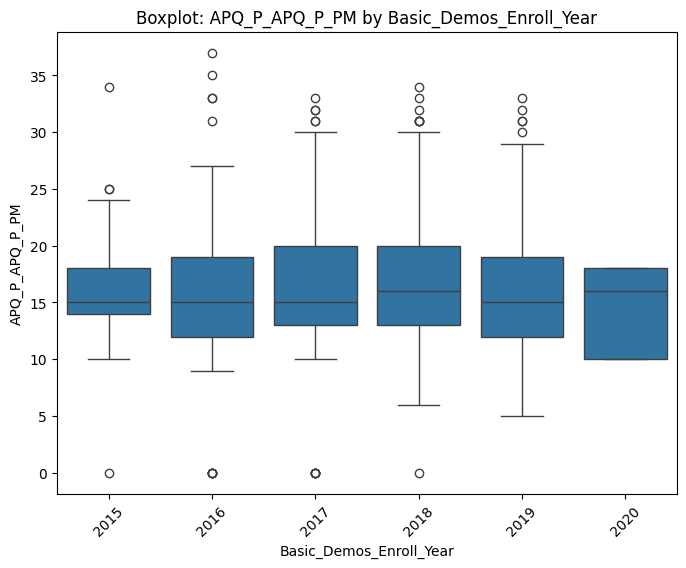


📊 Average APQ_P_APQ_P_PM per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    15.944444
2016    15.795812
2017    16.503937
2018    16.903614
2019    16.073718
2020    14.400000
Name: APQ_P_APQ_P_PM, dtype: float64


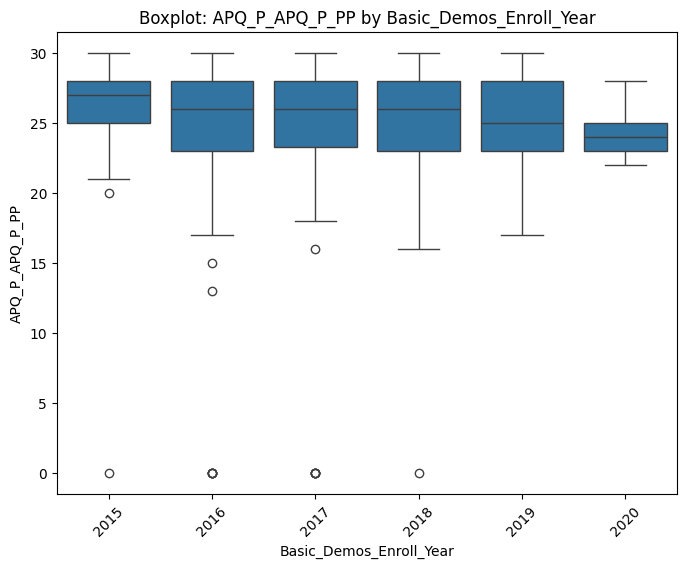


📊 Average APQ_P_APQ_P_PP per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    25.694444
2016    25.031414
2017    25.236220
2018    25.296386
2019    25.282051
2020    24.400000
Name: APQ_P_APQ_P_PP, dtype: float64


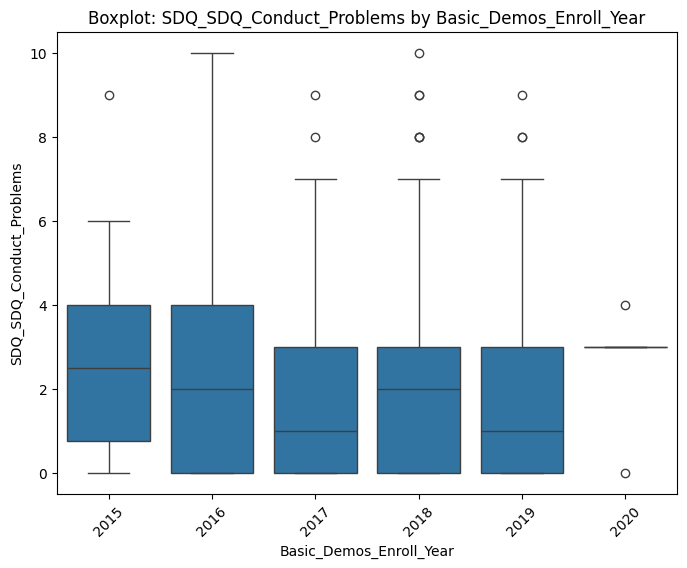


📊 Average SDQ_SDQ_Conduct_Problems per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    2.555556
2016    2.256545
2017    2.094488
2018    1.990361
2019    1.935897
2020    2.600000
Name: SDQ_SDQ_Conduct_Problems, dtype: float64


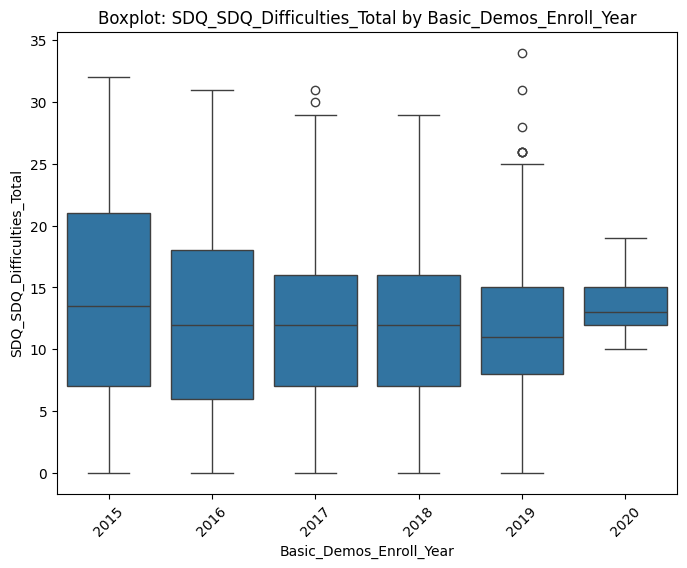


📊 Average SDQ_SDQ_Difficulties_Total per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    13.361111
2016    12.513089
2017    12.318898
2018    11.915663
2019    11.830128
2020    13.800000
Name: SDQ_SDQ_Difficulties_Total, dtype: float64


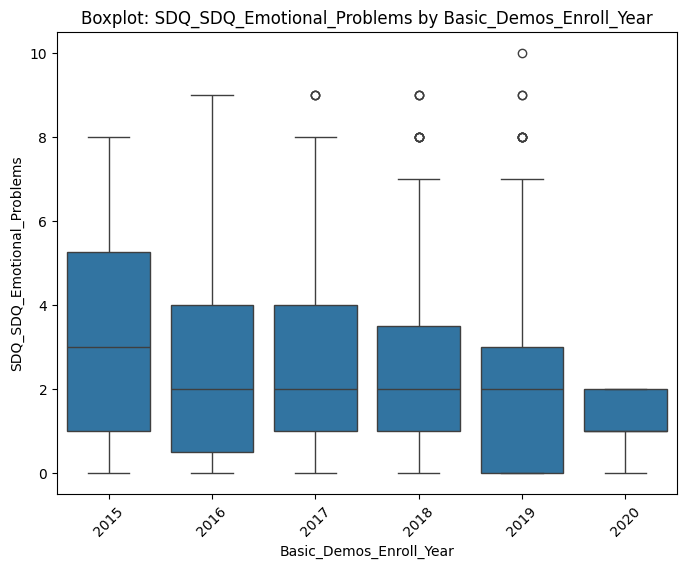


📊 Average SDQ_SDQ_Emotional_Problems per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    3.194444
2016    2.376963
2017    2.350394
2018    2.298795
2019    2.157051
2020    1.200000
Name: SDQ_SDQ_Emotional_Problems, dtype: float64


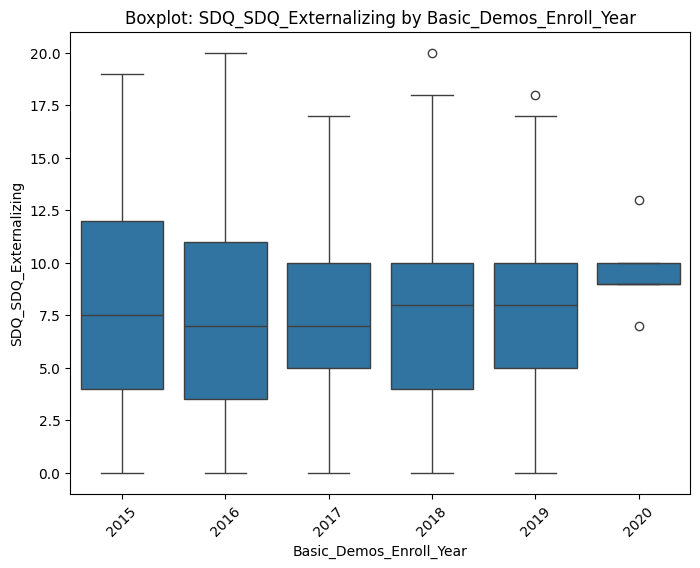


📊 Average SDQ_SDQ_Externalizing per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    7.861111
2016    7.329843
2017    7.622047
2018    7.503614
2019    7.647436
2020    9.600000
Name: SDQ_SDQ_Externalizing, dtype: float64


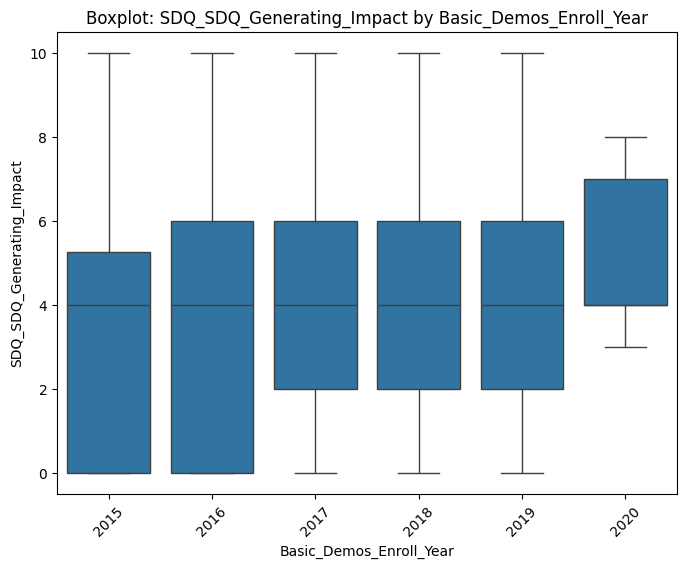


📊 Average SDQ_SDQ_Generating_Impact per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    3.555556
2016    3.706806
2017    4.185039
2018    4.240964
2019    4.025641
2020    5.200000
Name: SDQ_SDQ_Generating_Impact, dtype: float64


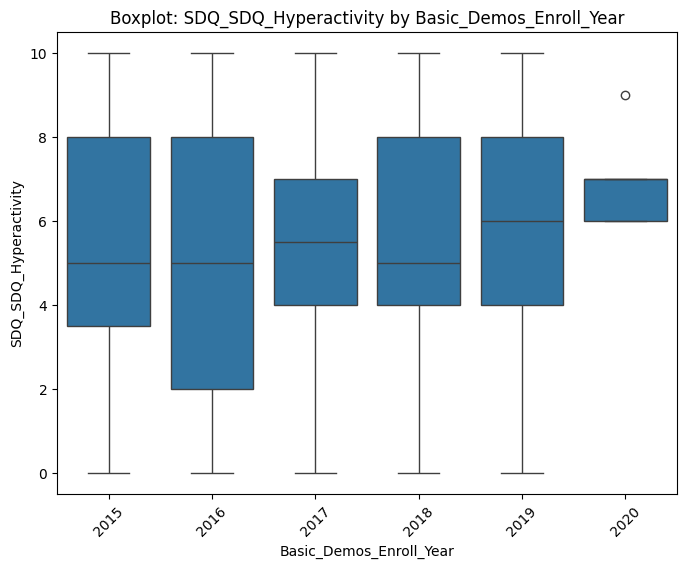


📊 Average SDQ_SDQ_Hyperactivity per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    5.305556
2016    5.073298
2017    5.527559
2018    5.513253
2019    5.711538
2020    7.000000
Name: SDQ_SDQ_Hyperactivity, dtype: float64


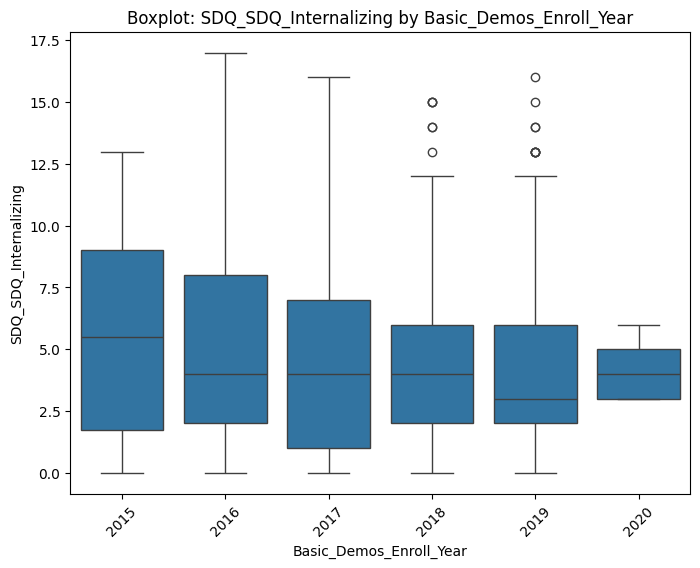


📊 Average SDQ_SDQ_Internalizing per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    5.500000
2016    5.183246
2017    4.696850
2018    4.412048
2019    4.182692
2020    4.200000
Name: SDQ_SDQ_Internalizing, dtype: float64


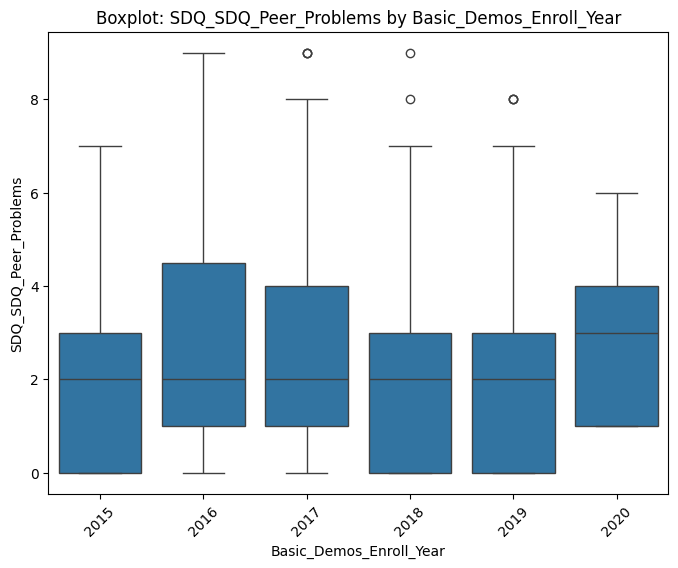


📊 Average SDQ_SDQ_Peer_Problems per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    2.305556
2016    2.806283
2017    2.346457
2018    2.113253
2019    2.025641
2020    3.000000
Name: SDQ_SDQ_Peer_Problems, dtype: float64


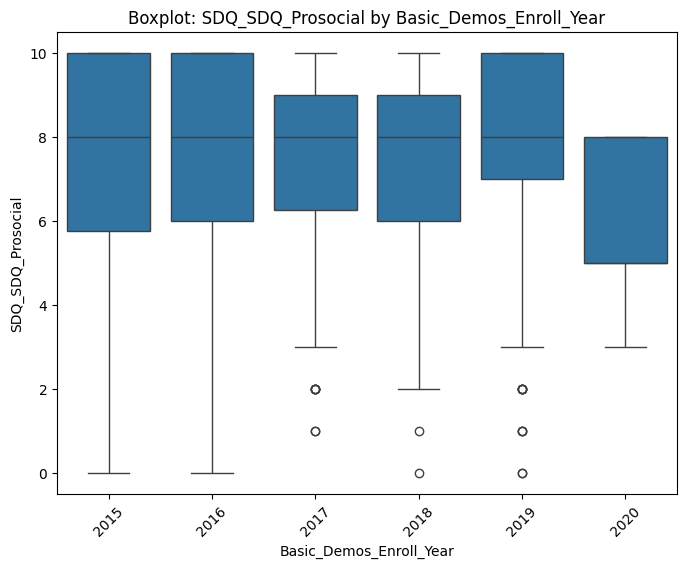


📊 Average SDQ_SDQ_Prosocial per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    7.055556
2016    7.602094
2017    7.744094
2018    7.715663
2019    7.743590
2020    5.800000
Name: SDQ_SDQ_Prosocial, dtype: float64


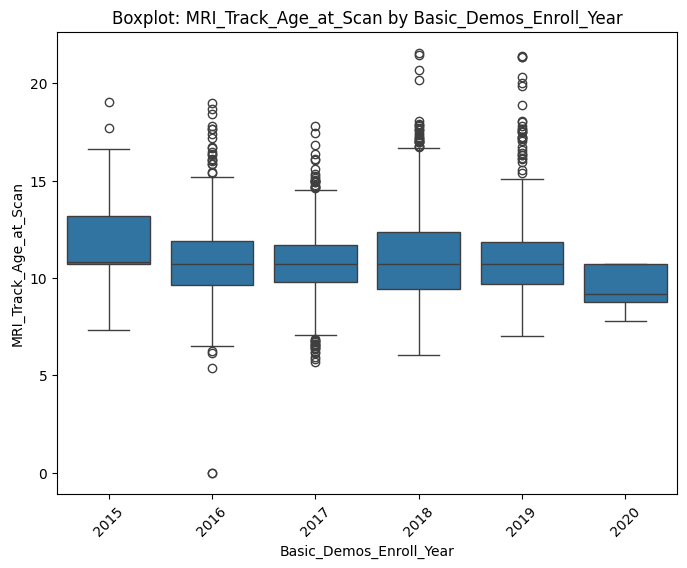


📊 Average MRI_Track_Age_at_Scan per Basic_Demos_Enroll_Year:
Basic_Demos_Enroll_Year
2015    11.888543
2016    11.006832
2017    10.784225
2018    11.191850
2019    11.209548
2020     9.440018
Name: MRI_Track_Age_at_Scan, dtype: float64


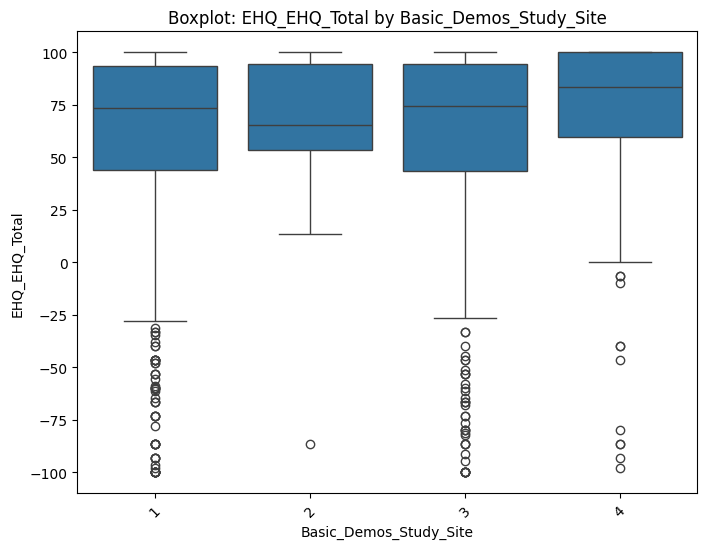


📊 Average EHQ_EHQ_Total per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    57.755230
2    57.179091
3    58.621186
4    66.043417
Name: EHQ_EHQ_Total, dtype: float64


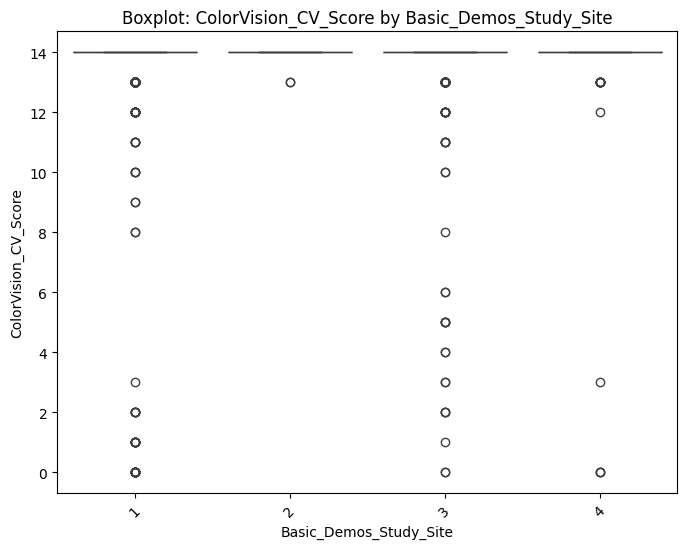


📊 Average ColorVision_CV_Score per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    12.940184
2    13.818182
3    13.404651
4    13.466667
Name: ColorVision_CV_Score, dtype: float64


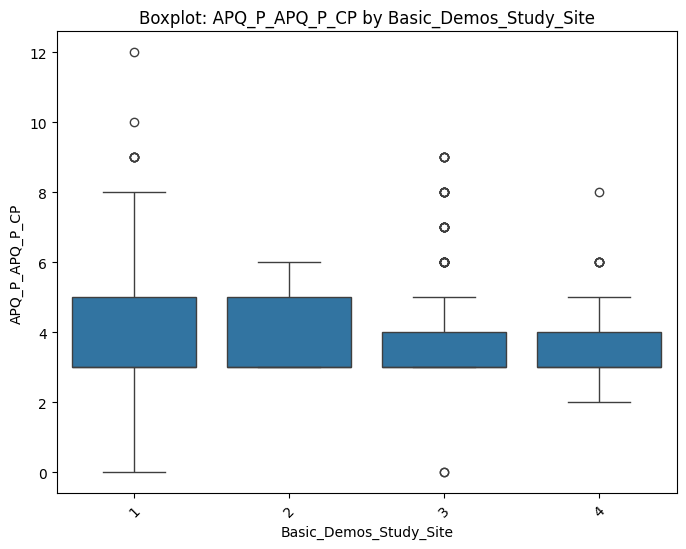


📊 Average APQ_P_APQ_P_CP per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    3.863497
2    3.909091
3    3.725581
4    3.525000
Name: APQ_P_APQ_P_CP, dtype: float64


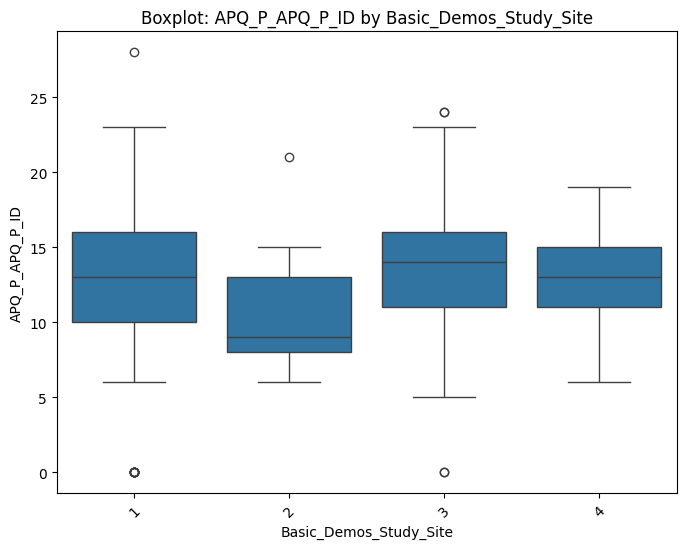


📊 Average APQ_P_APQ_P_ID per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    12.970859
2    10.636364
3    13.662791
4    13.075000
Name: APQ_P_APQ_P_ID, dtype: float64


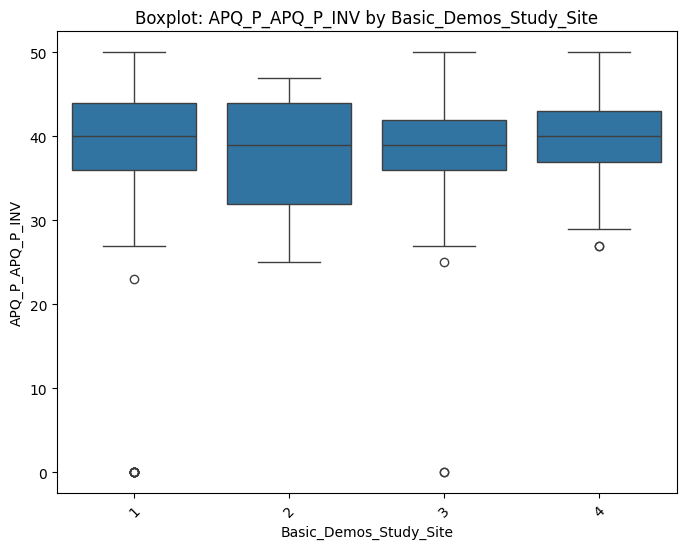


📊 Average APQ_P_APQ_P_INV per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    39.453988
2    37.818182
3    39.141860
4    39.916667
Name: APQ_P_APQ_P_INV, dtype: float64


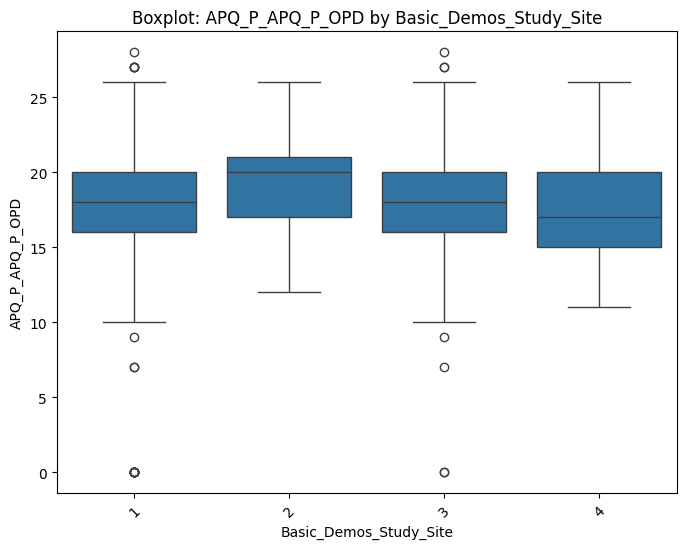


📊 Average APQ_P_APQ_P_OPD per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    17.846626
2    19.272727
3    17.779070
4    17.341667
Name: APQ_P_APQ_P_OPD, dtype: float64


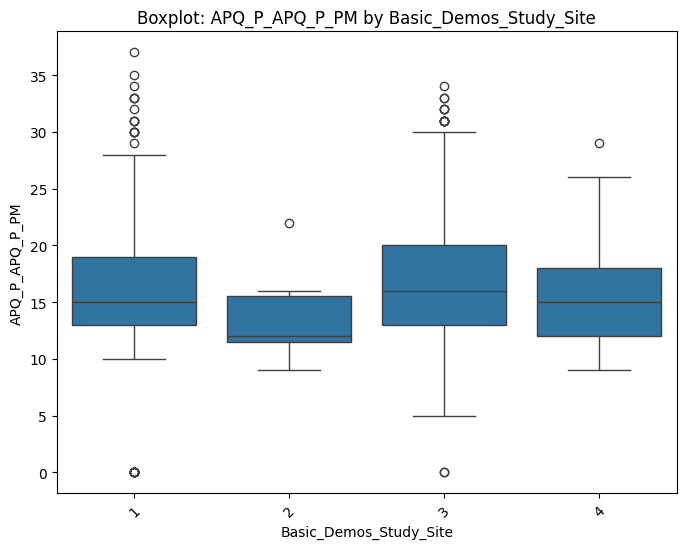


📊 Average APQ_P_APQ_P_PM per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    16.101227
2    13.636364
3    17.155814
4    15.500000
Name: APQ_P_APQ_P_PM, dtype: float64


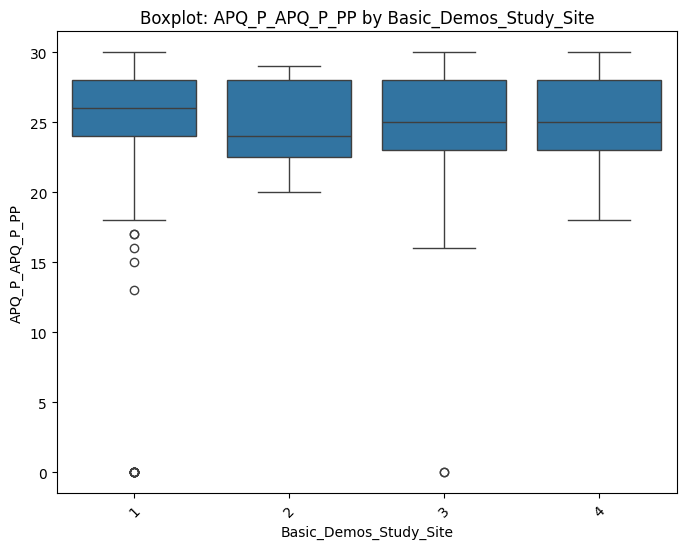


📊 Average APQ_P_APQ_P_PP per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    25.446319
2    24.727273
3    24.934884
4    25.325000
Name: APQ_P_APQ_P_PP, dtype: float64


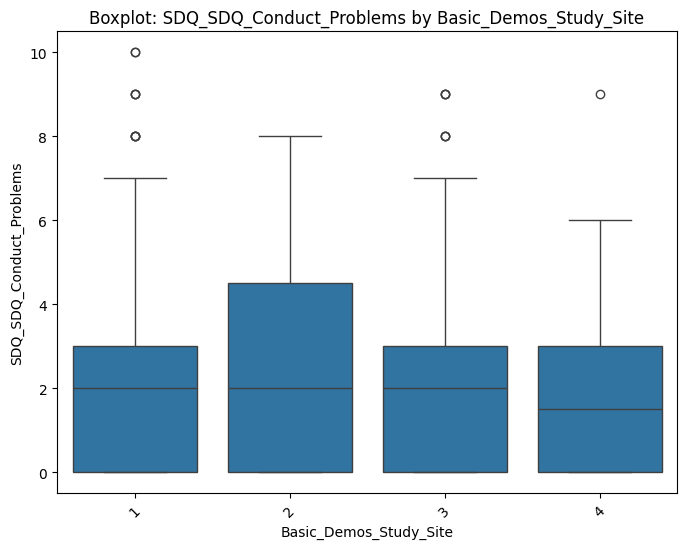


📊 Average SDQ_SDQ_Conduct_Problems per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    2.119632
2    2.636364
3    1.988372
4    1.933333
Name: SDQ_SDQ_Conduct_Problems, dtype: float64


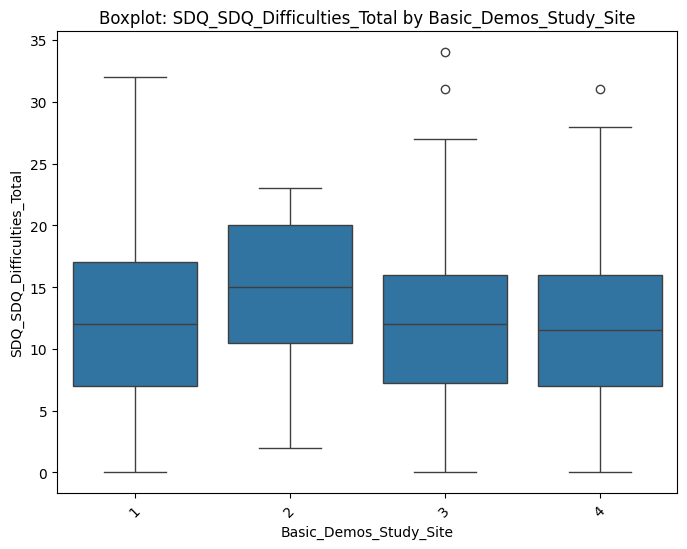


📊 Average SDQ_SDQ_Difficulties_Total per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    12.194785
2    14.454545
3    12.062791
4    11.733333
Name: SDQ_SDQ_Difficulties_Total, dtype: float64


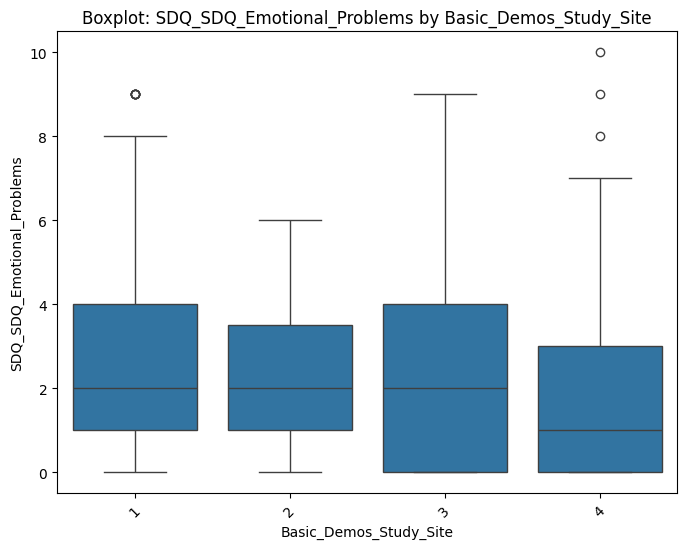


📊 Average SDQ_SDQ_Emotional_Problems per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    2.389571
2    2.454545
3    2.302326
4    1.866667
Name: SDQ_SDQ_Emotional_Problems, dtype: float64


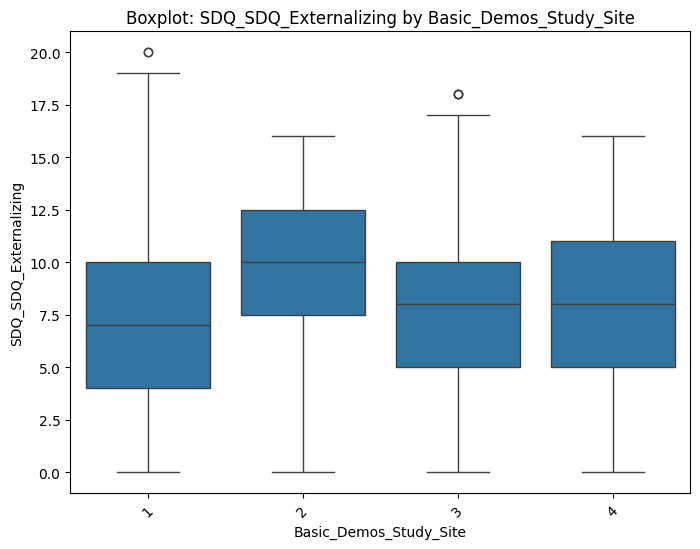


📊 Average SDQ_SDQ_Externalizing per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    7.424847
2    9.454545
3    7.634884
4    7.825000
Name: SDQ_SDQ_Externalizing, dtype: float64


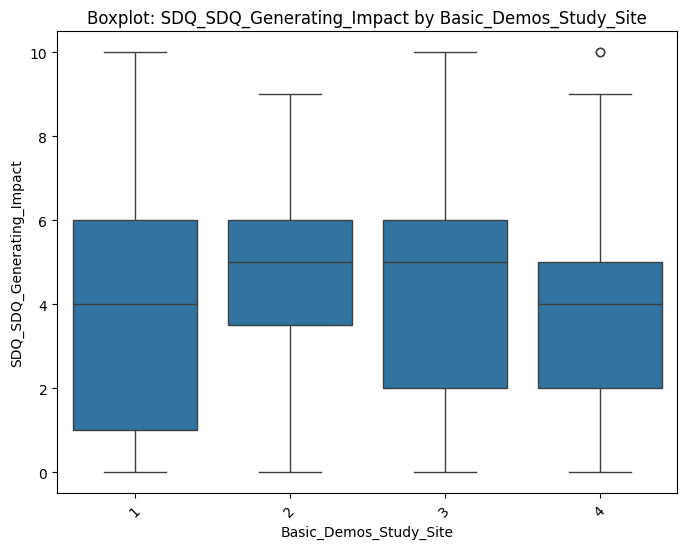


📊 Average SDQ_SDQ_Generating_Impact per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    3.930982
2    4.636364
3    4.290698
4    4.016667
Name: SDQ_SDQ_Generating_Impact, dtype: float64


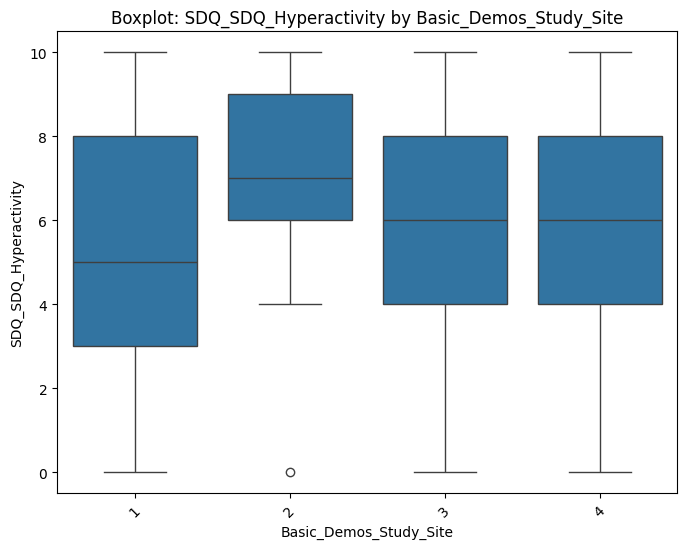


📊 Average SDQ_SDQ_Hyperactivity per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    5.305215
2    6.818182
3    5.646512
4    5.891667
Name: SDQ_SDQ_Hyperactivity, dtype: float64


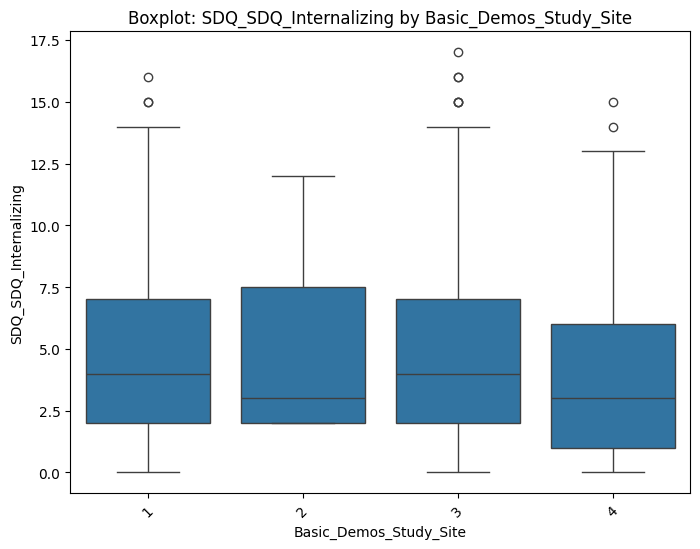


📊 Average SDQ_SDQ_Internalizing per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    4.769939
2    5.000000
3    4.427907
4    3.908333
Name: SDQ_SDQ_Internalizing, dtype: float64


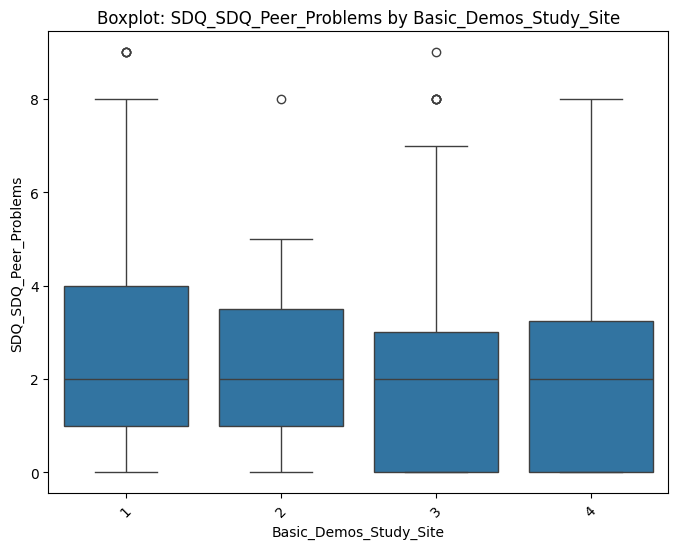


📊 Average SDQ_SDQ_Peer_Problems per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    2.380368
2    2.545455
3    2.125581
4    2.041667
Name: SDQ_SDQ_Peer_Problems, dtype: float64


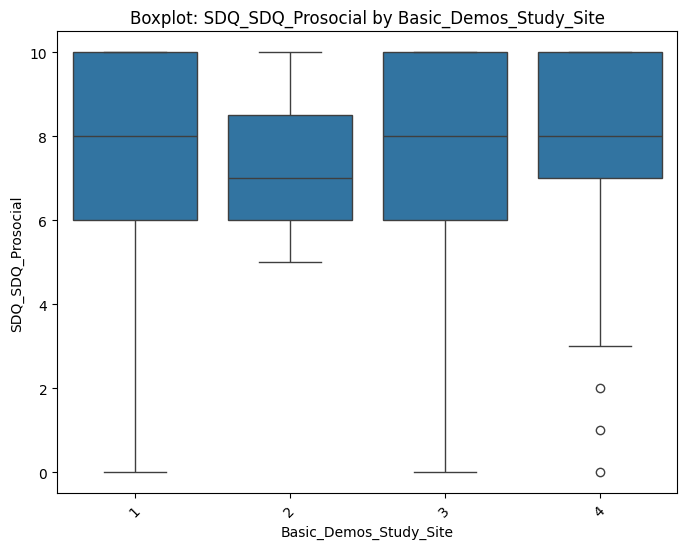


📊 Average SDQ_SDQ_Prosocial per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    7.671779
2    7.363636
3    7.683721
4    7.775000
Name: SDQ_SDQ_Prosocial, dtype: float64


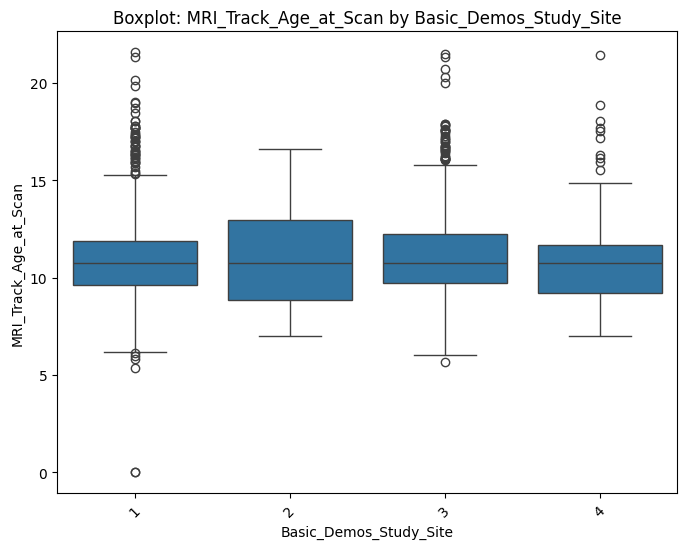


📊 Average MRI_Track_Age_at_Scan per Basic_Demos_Study_Site:
Basic_Demos_Study_Site
1    11.002978
2    11.027067
3    11.261337
4    11.008900
Name: MRI_Track_Age_at_Scan, dtype: float64


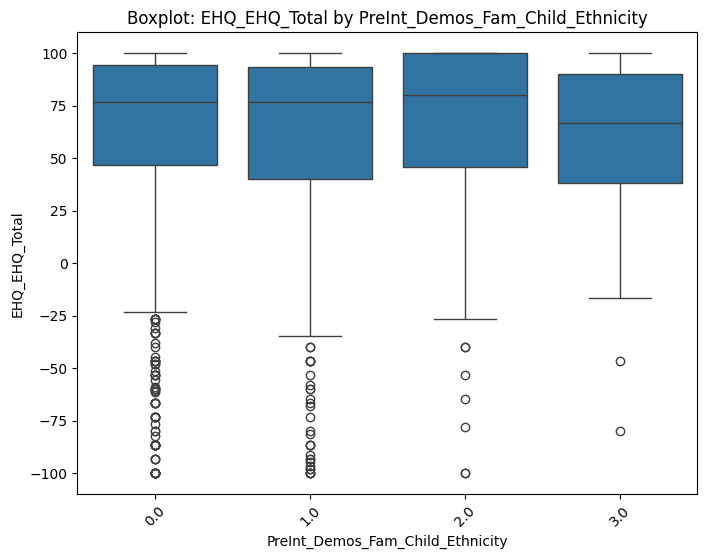


📊 Average EHQ_EHQ_Total per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    59.752423
1.0    56.987365
2.0    58.549870
3.0    54.883548
Name: EHQ_EHQ_Total, dtype: float64


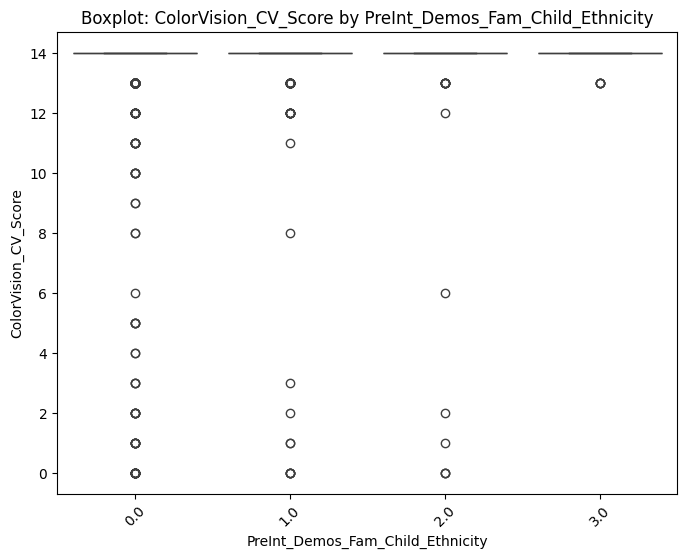


📊 Average ColorVision_CV_Score per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    13.076638
1.0    13.405405
2.0    12.896104
3.0    13.838710
Name: ColorVision_CV_Score, dtype: float64


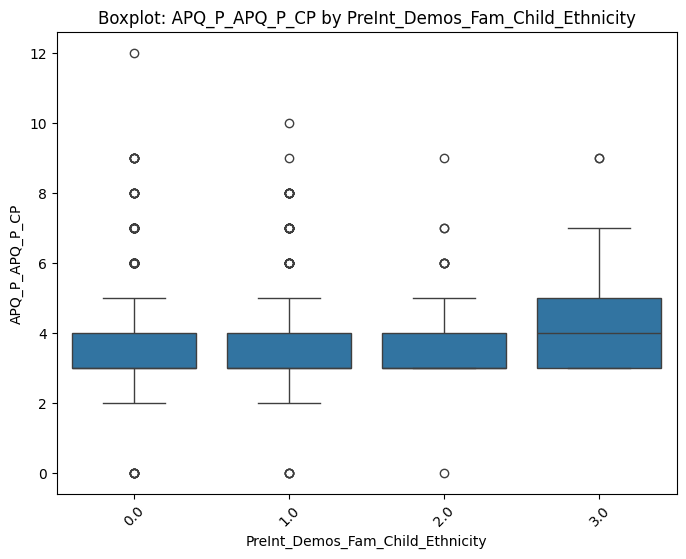


📊 Average APQ_P_APQ_P_CP per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    3.752781
1.0    3.844595
2.0    3.597403
3.0    4.387097
Name: APQ_P_APQ_P_CP, dtype: float64


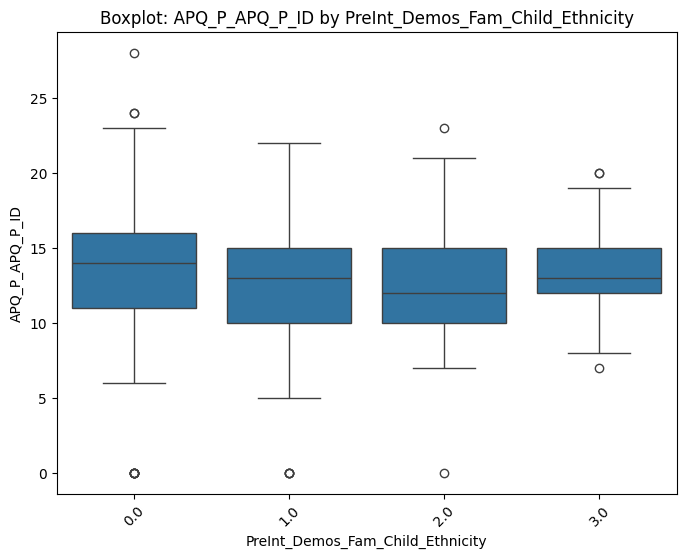


📊 Average APQ_P_APQ_P_ID per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    13.461063
1.0    12.618243
2.0    12.701299
3.0    13.387097
Name: APQ_P_APQ_P_ID, dtype: float64


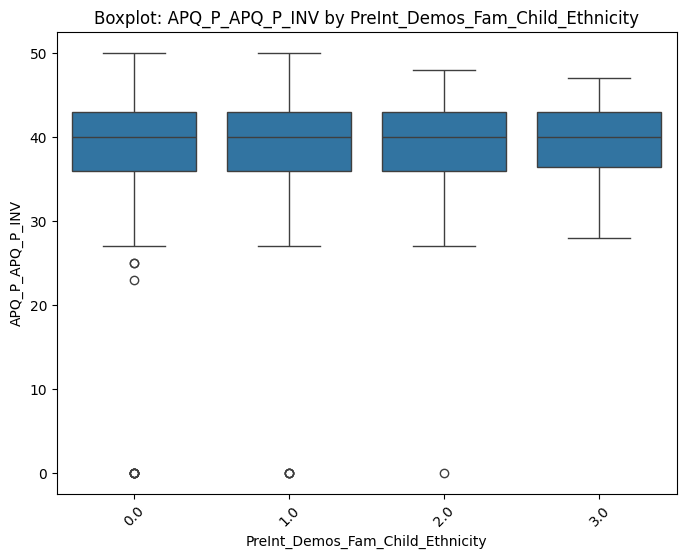


📊 Average APQ_P_APQ_P_INV per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    39.462299
1.0    39.260135
2.0    39.051948
3.0    38.967742
Name: APQ_P_APQ_P_INV, dtype: float64


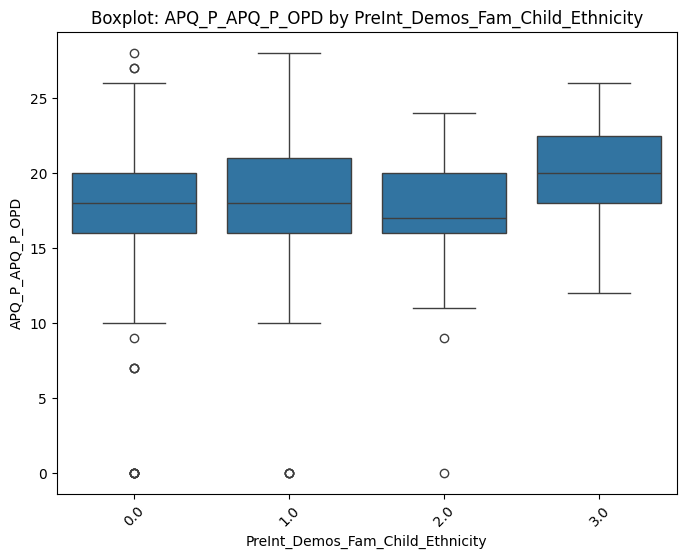


📊 Average APQ_P_APQ_P_OPD per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    17.703337
1.0    17.912162
2.0    17.272727
3.0    20.000000
Name: APQ_P_APQ_P_OPD, dtype: float64


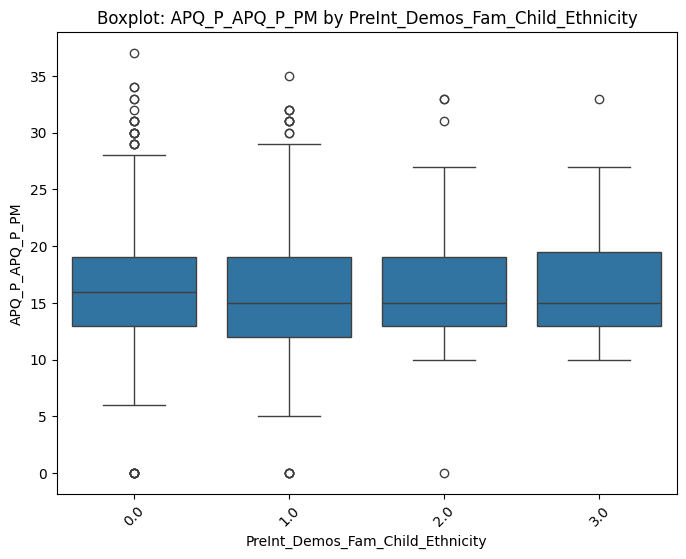


📊 Average APQ_P_APQ_P_PM per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    16.395550
1.0    16.266892
2.0    16.675325
3.0    16.838710
Name: APQ_P_APQ_P_PM, dtype: float64


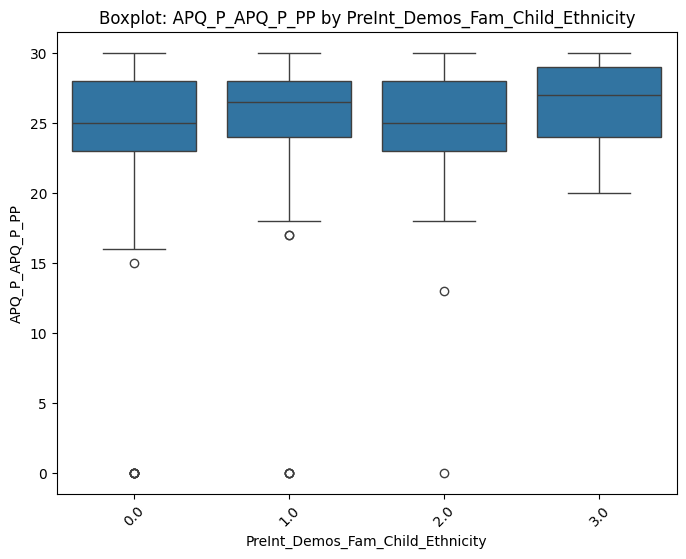


📊 Average APQ_P_APQ_P_PP per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    25.127318
1.0    25.618243
2.0    24.675325
3.0    26.225806
Name: APQ_P_APQ_P_PP, dtype: float64


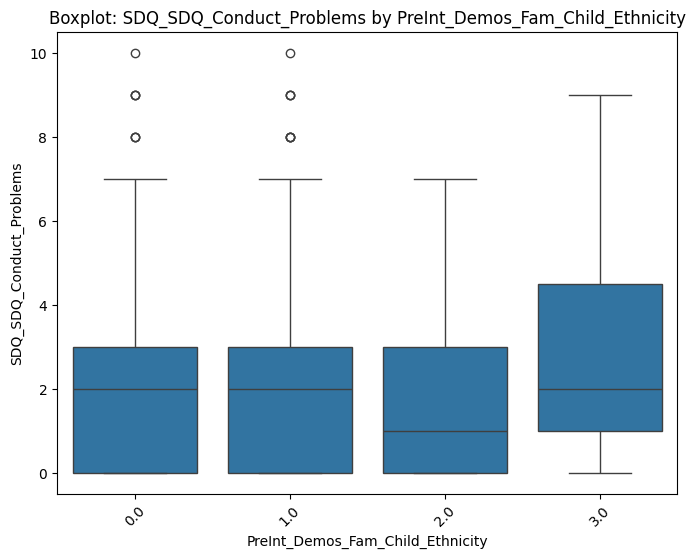


📊 Average SDQ_SDQ_Conduct_Problems per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    2.004944
1.0    2.212838
2.0    1.701299
3.0    2.903226
Name: SDQ_SDQ_Conduct_Problems, dtype: float64


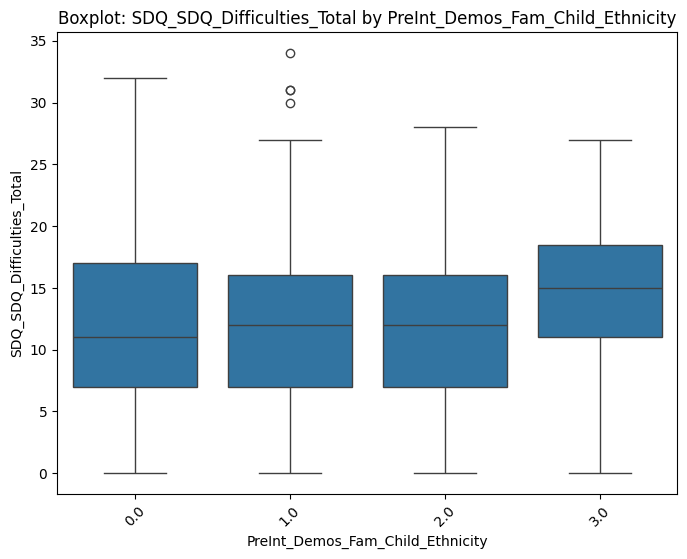


📊 Average SDQ_SDQ_Difficulties_Total per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    11.970334
1.0    12.344595
2.0    11.974026
3.0    14.354839
Name: SDQ_SDQ_Difficulties_Total, dtype: float64


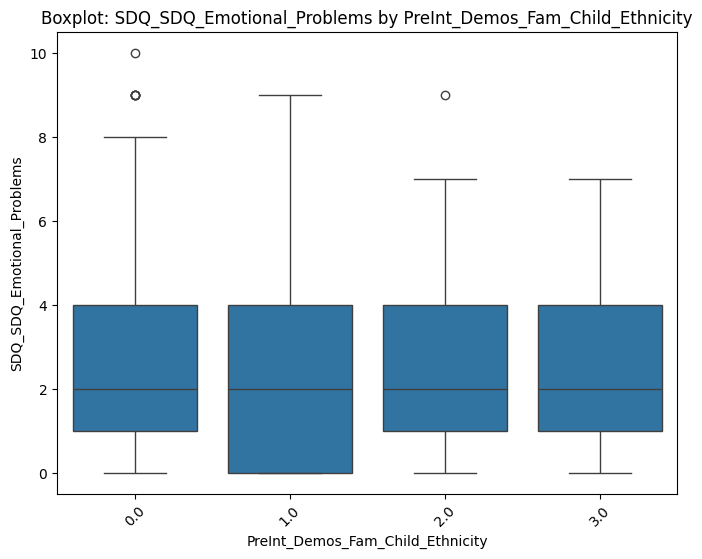


📊 Average SDQ_SDQ_Emotional_Problems per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    2.289246
1.0    2.233108
2.0    2.662338
3.0    2.612903
Name: SDQ_SDQ_Emotional_Problems, dtype: float64


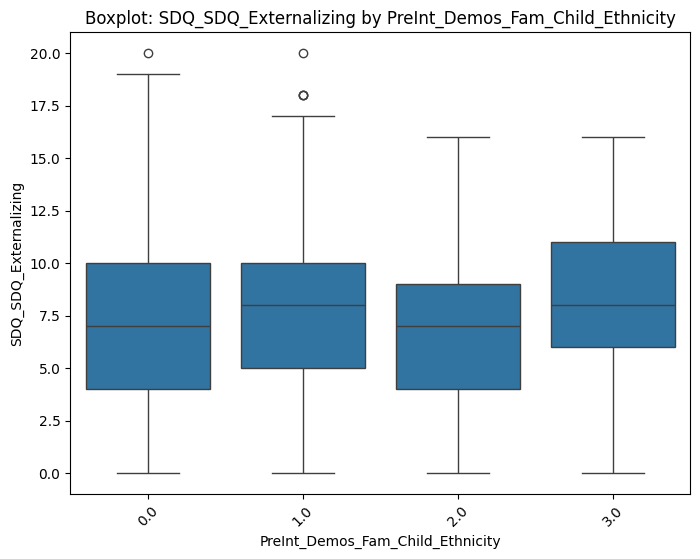


📊 Average SDQ_SDQ_Externalizing per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    7.485785
1.0    7.831081
2.0    6.831169
3.0    8.612903
Name: SDQ_SDQ_Externalizing, dtype: float64


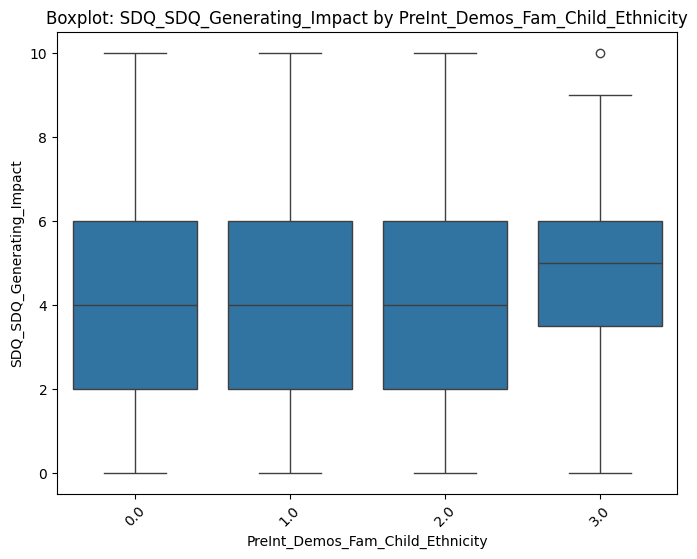


📊 Average SDQ_SDQ_Generating_Impact per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    4.013597
1.0    4.216216
2.0    3.961039
3.0    4.548387
Name: SDQ_SDQ_Generating_Impact, dtype: float64


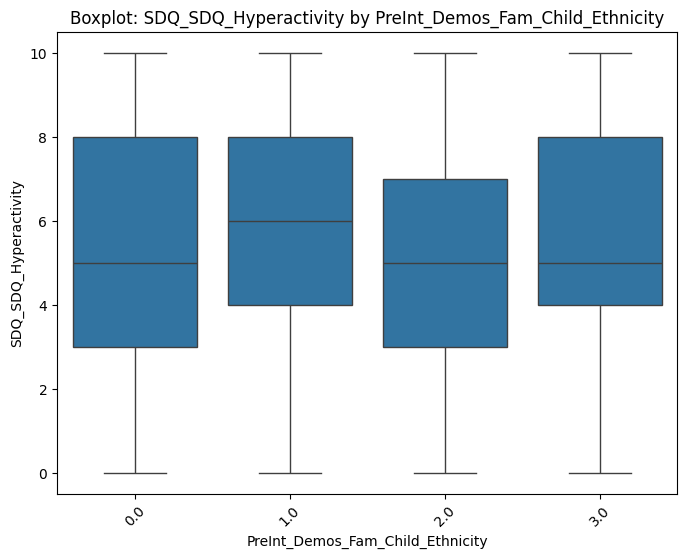


📊 Average SDQ_SDQ_Hyperactivity per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    5.480841
1.0    5.618243
2.0    5.129870
3.0    5.709677
Name: SDQ_SDQ_Hyperactivity, dtype: float64


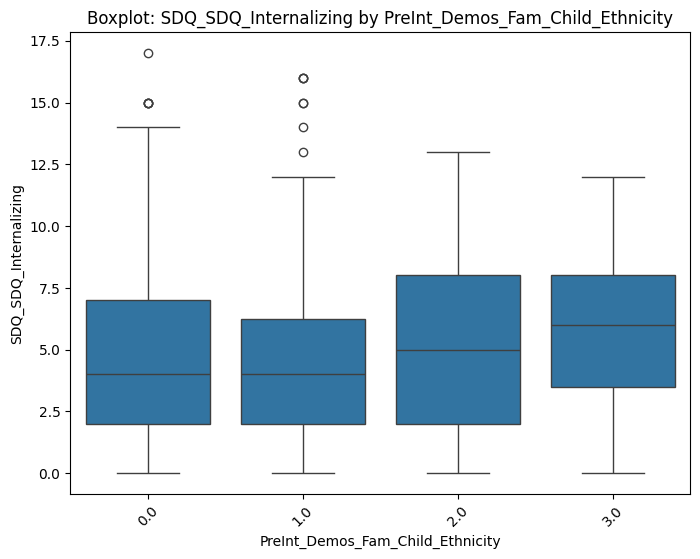


📊 Average SDQ_SDQ_Internalizing per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    4.484549
1.0    4.513514
2.0    5.142857
3.0    5.741935
Name: SDQ_SDQ_Internalizing, dtype: float64


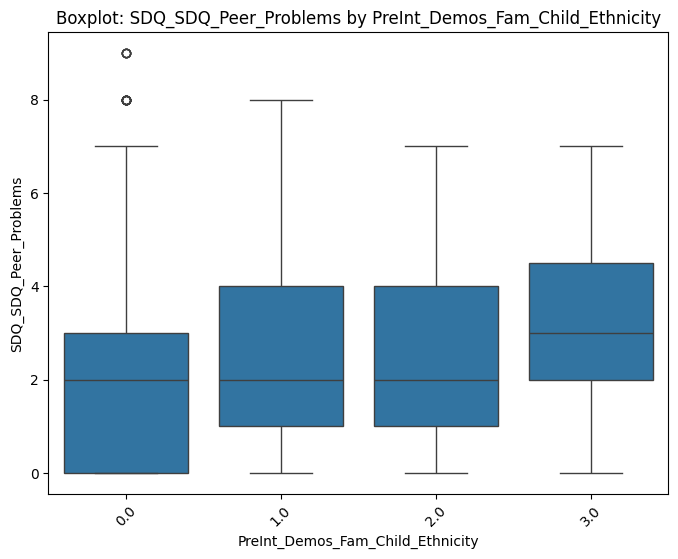


📊 Average SDQ_SDQ_Peer_Problems per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    2.195303
1.0    2.280405
2.0    2.480519
3.0    3.129032
Name: SDQ_SDQ_Peer_Problems, dtype: float64


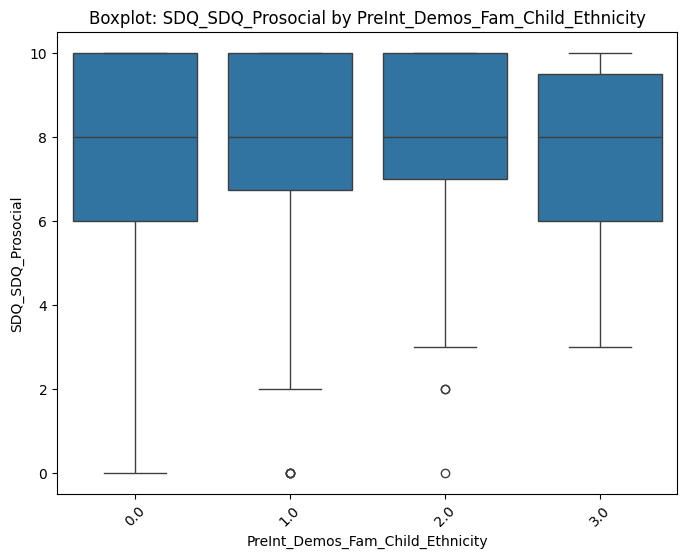


📊 Average SDQ_SDQ_Prosocial per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    7.647713
1.0    7.793919
2.0    7.727273
3.0    7.451613
Name: SDQ_SDQ_Prosocial, dtype: float64


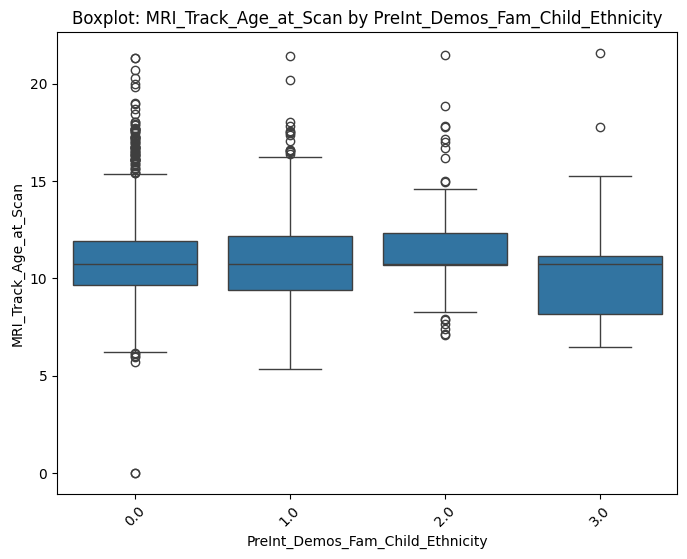


📊 Average MRI_Track_Age_at_Scan per PreInt_Demos_Fam_Child_Ethnicity:
PreInt_Demos_Fam_Child_Ethnicity
0.0    11.107806
1.0    10.979078
2.0    11.603845
3.0    10.618209
Name: MRI_Track_Age_at_Scan, dtype: float64


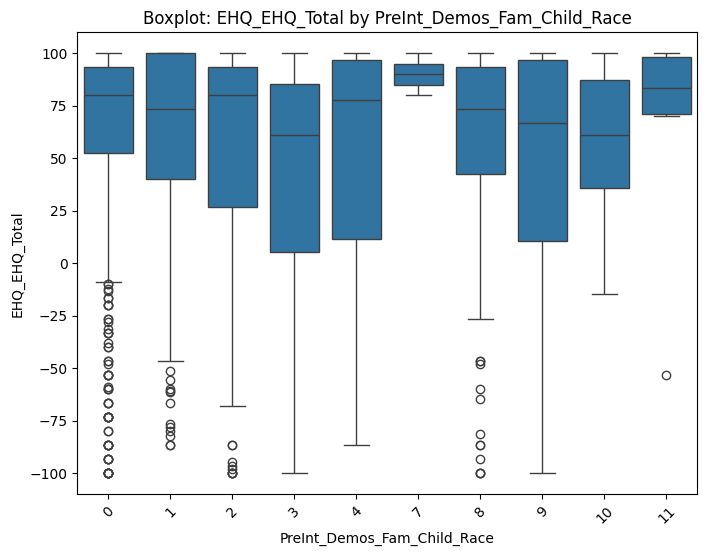


📊 Average EHQ_EHQ_Total per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     61.929856
1     59.485580
2     51.690000
3     38.637667
4     43.901000
7     90.000000
8     58.663333
9     42.473478
10    56.977273
11    63.890000
Name: EHQ_EHQ_Total, dtype: float64


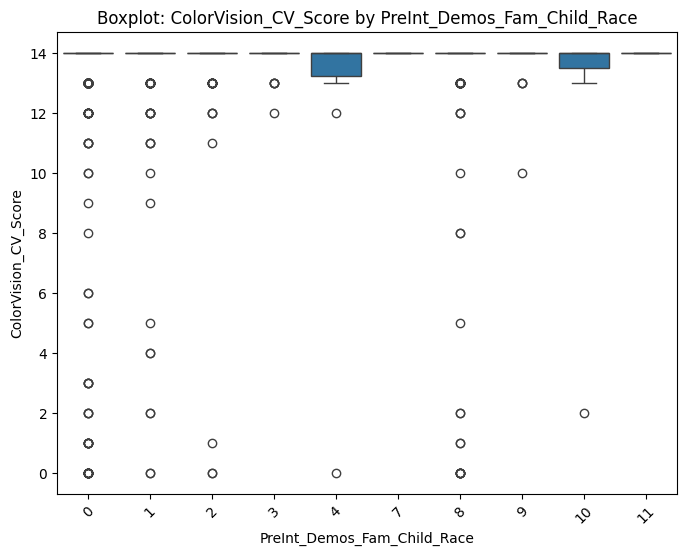


📊 Average ColorVision_CV_Score per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     13.090909
1     13.276243
2     13.500000
3     13.800000
4     12.300000
7     14.000000
8     12.953846
9     13.695652
10    12.727273
11    14.000000
Name: ColorVision_CV_Score, dtype: float64


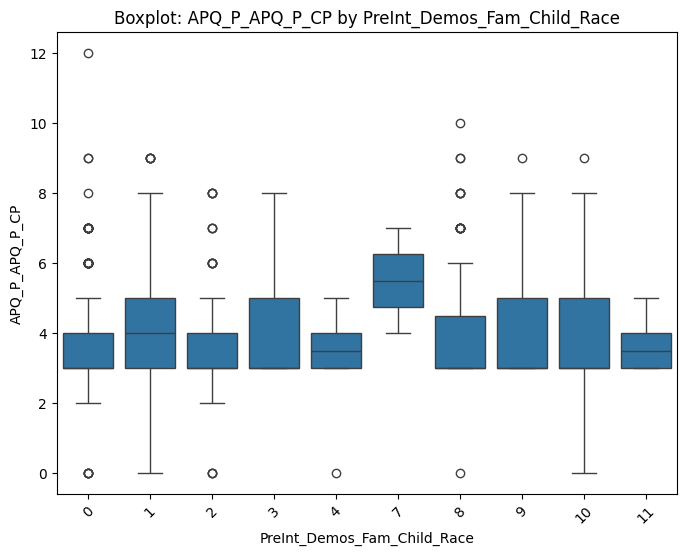


📊 Average APQ_P_APQ_P_CP per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     3.596491
1     4.276243
2     3.601562
3     4.166667
4     3.300000
7     5.500000
8     3.938462
9     4.000000
10    4.181818
11    3.666667
Name: APQ_P_APQ_P_CP, dtype: float64


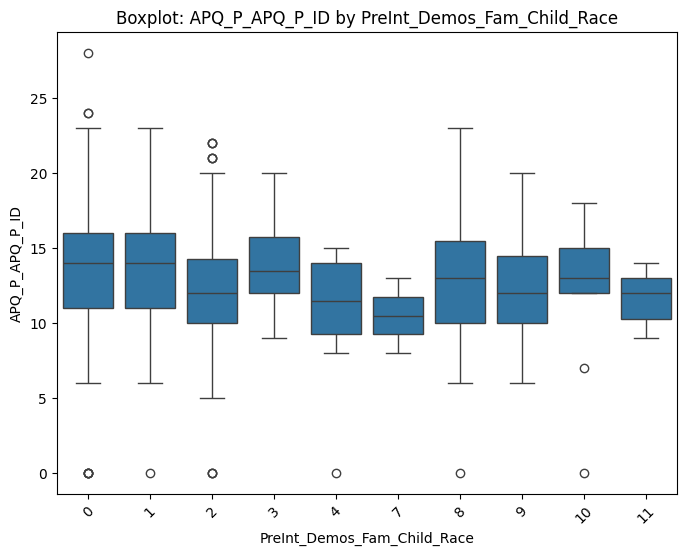


📊 Average APQ_P_APQ_P_ID per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     13.496013
1     13.375691
2     12.328125
3     13.900000
4     10.800000
7     10.500000
8     12.943590
9     12.217391
10    12.363636
11    11.666667
Name: APQ_P_APQ_P_ID, dtype: float64


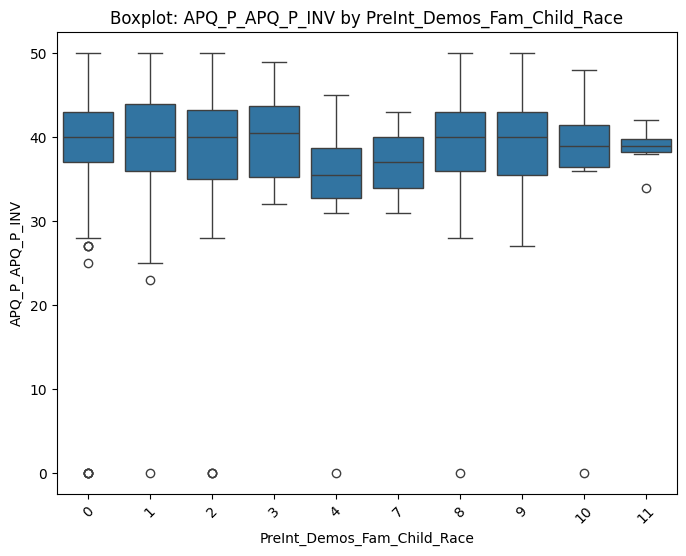


📊 Average APQ_P_APQ_P_INV per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     39.531100
1     39.558011
2     38.828125
3     39.733333
4     33.300000
7     37.000000
8     39.543590
9     39.260870
10    36.363636
11    38.666667
Name: APQ_P_APQ_P_INV, dtype: float64


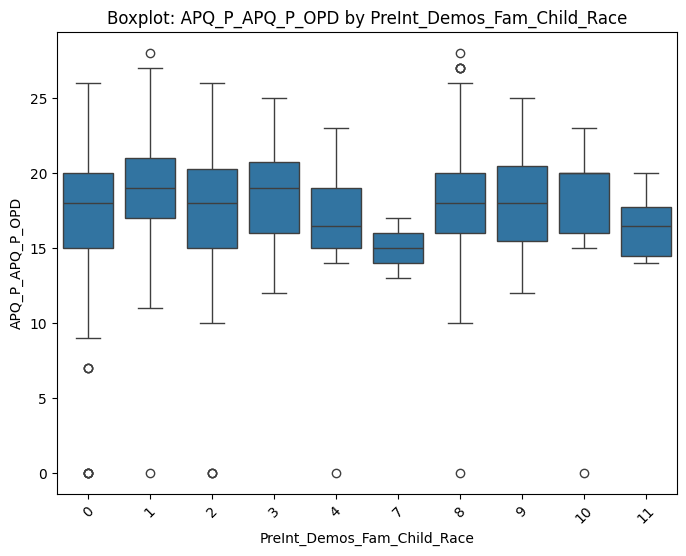


📊 Average APQ_P_APQ_P_OPD per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     17.464115
1     19.033149
2     17.500000
3     18.433333
4     15.800000
7     15.000000
8     17.887179
9     18.304348
10    17.272727
11    16.500000
Name: APQ_P_APQ_P_OPD, dtype: float64


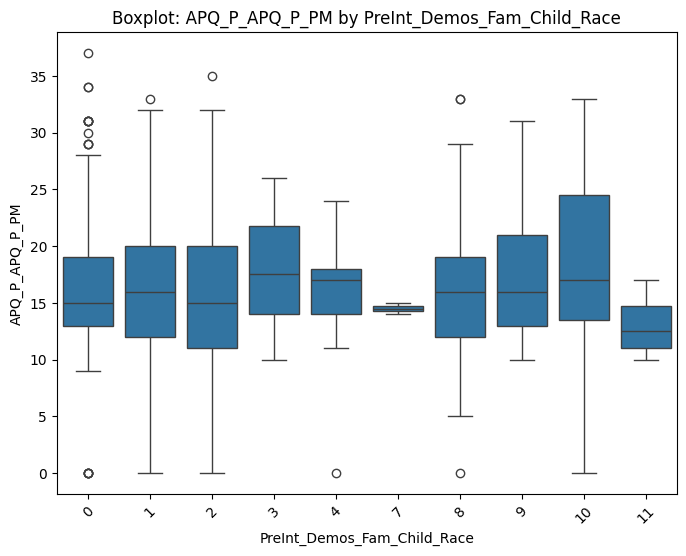


📊 Average APQ_P_APQ_P_PM per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     16.196172
1     16.895028
2     16.609375
3     17.366667
4     15.600000
7     14.500000
8     16.143590
9     17.739130
10    18.727273
11    13.000000
Name: APQ_P_APQ_P_PM, dtype: float64


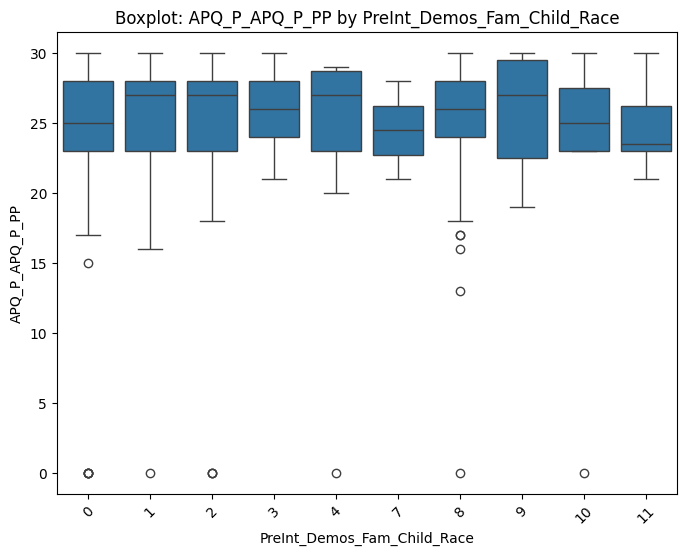


📊 Average APQ_P_APQ_P_PP per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     25.087719
1     25.607735
2     25.476562
3     25.766667
4     23.500000
7     24.500000
8     25.338462
9     25.695652
10    23.727273
11    24.666667
Name: APQ_P_APQ_P_PP, dtype: float64


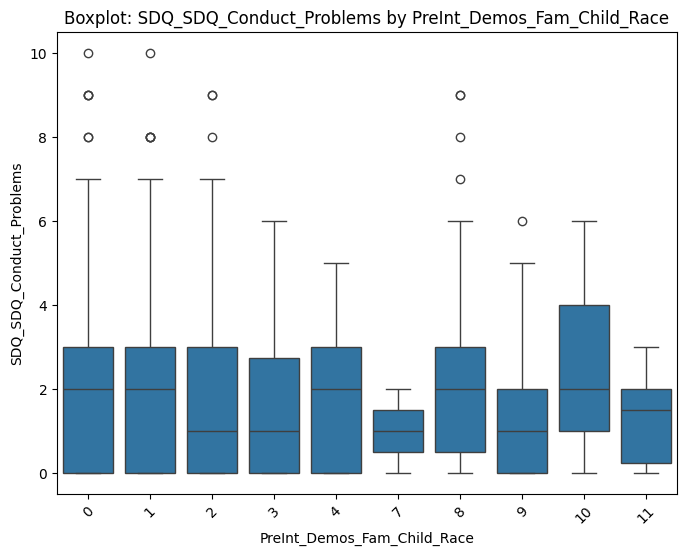


📊 Average SDQ_SDQ_Conduct_Problems per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     2.041467
1     2.209945
2     2.015625
3     1.766667
4     1.900000
7     1.000000
8     2.102564
9     1.739130
10    2.545455
11    1.333333
Name: SDQ_SDQ_Conduct_Problems, dtype: float64


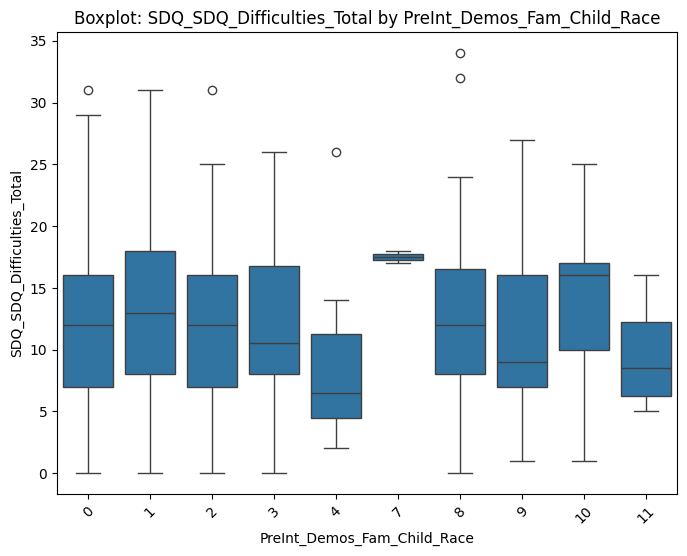


📊 Average SDQ_SDQ_Difficulties_Total per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     11.931419
1     13.176796
2     11.843750
3     12.100000
4      8.800000
7     17.500000
8     12.128205
9     11.478261
10    13.727273
11     9.500000
Name: SDQ_SDQ_Difficulties_Total, dtype: float64


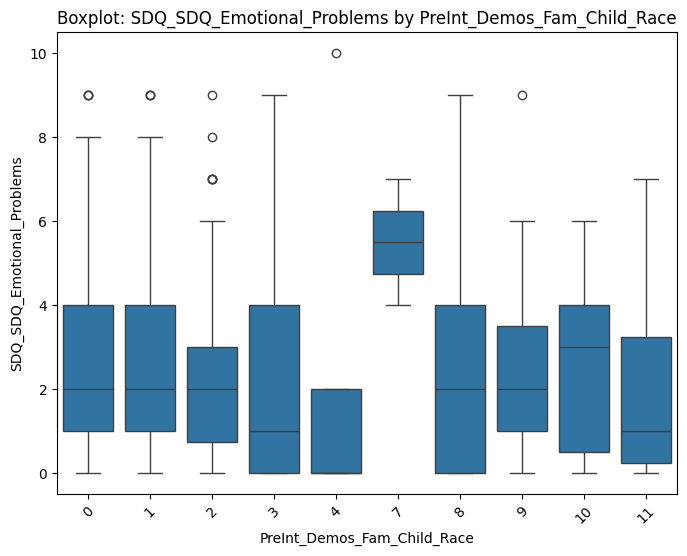


📊 Average SDQ_SDQ_Emotional_Problems per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     2.311005
1     2.436464
2     2.148438
3     2.233333
4     1.600000
7     5.500000
8     2.276923
9     2.391304
10    2.545455
11    2.166667
Name: SDQ_SDQ_Emotional_Problems, dtype: float64


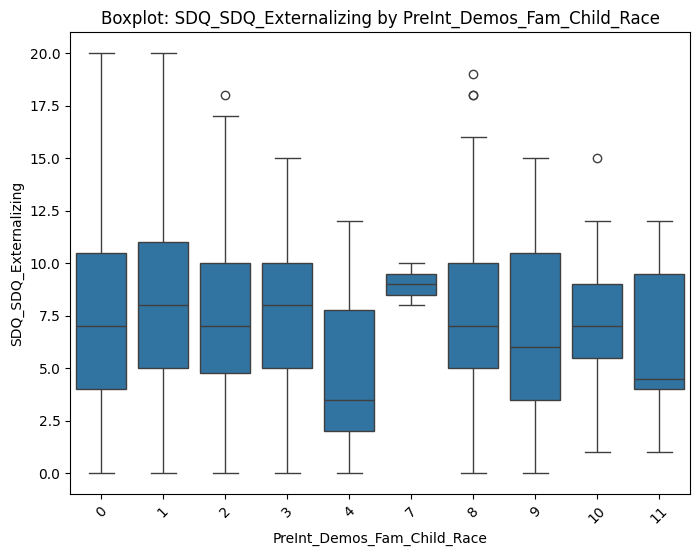


📊 Average SDQ_SDQ_Externalizing per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     7.460925
1     8.232044
2     7.437500
3     7.433333
4     4.700000
7     9.000000
8     7.589744
9     7.043478
10    7.272727
11    6.166667
Name: SDQ_SDQ_Externalizing, dtype: float64


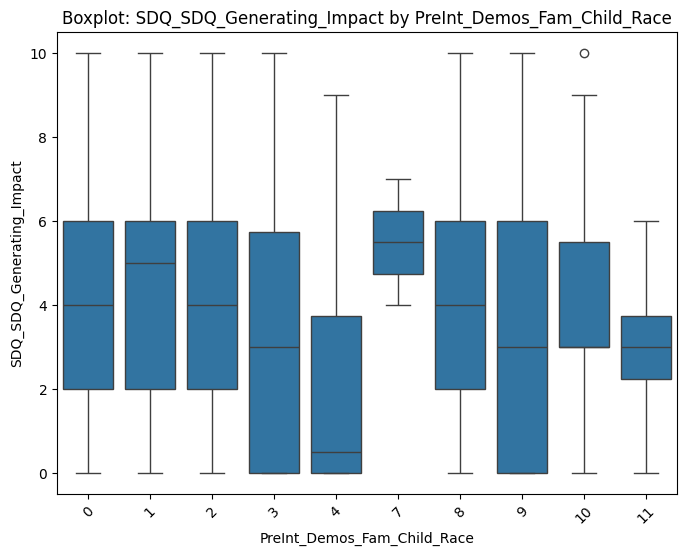


📊 Average SDQ_SDQ_Generating_Impact per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     4.030303
1     4.392265
2     4.164062
3     3.200000
4     2.600000
7     5.500000
8     4.107692
9     3.782609
10    4.272727
11    3.000000
Name: SDQ_SDQ_Generating_Impact, dtype: float64


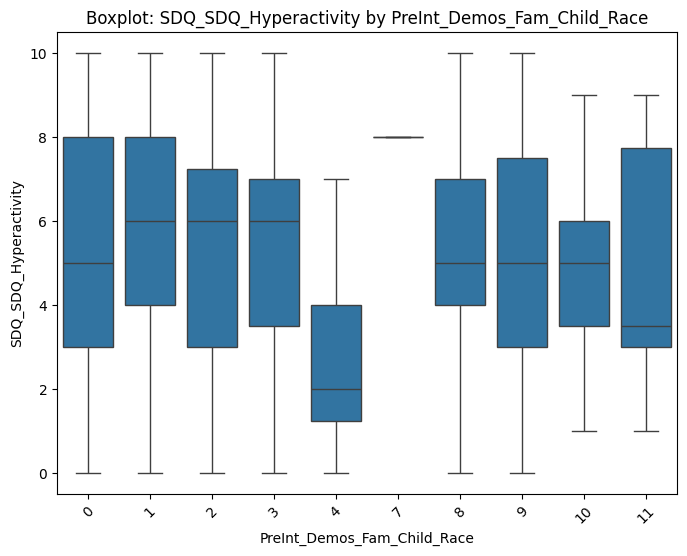


📊 Average SDQ_SDQ_Hyperactivity per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     5.419458
1     6.022099
2     5.421875
3     5.666667
4     2.800000
7     8.000000
8     5.487179
9     5.304348
10    4.727273
11    4.833333
Name: SDQ_SDQ_Hyperactivity, dtype: float64


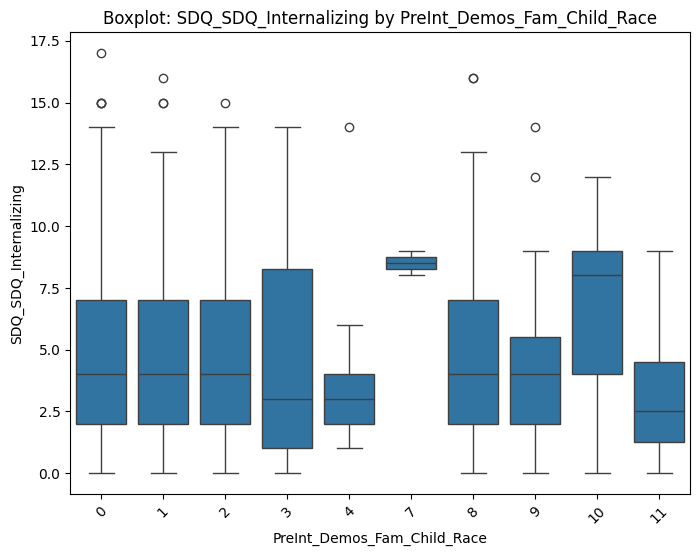


📊 Average SDQ_SDQ_Internalizing per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     4.470494
1     4.944751
2     4.406250
3     4.666667
4     4.100000
7     8.500000
8     4.538462
9     4.434783
10    6.454545
11    3.333333
Name: SDQ_SDQ_Internalizing, dtype: float64


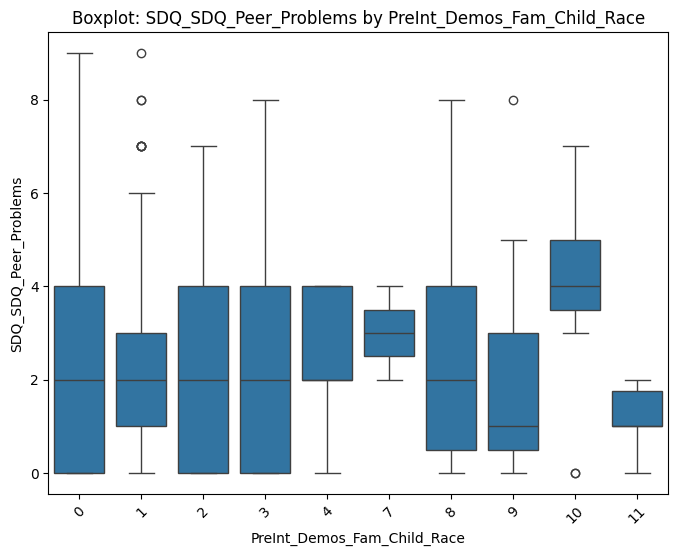


📊 Average SDQ_SDQ_Peer_Problems per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     2.159490
1     2.508287
2     2.257812
3     2.433333
4     2.500000
7     3.000000
8     2.261538
9     2.043478
10    3.909091
11    1.166667
Name: SDQ_SDQ_Peer_Problems, dtype: float64


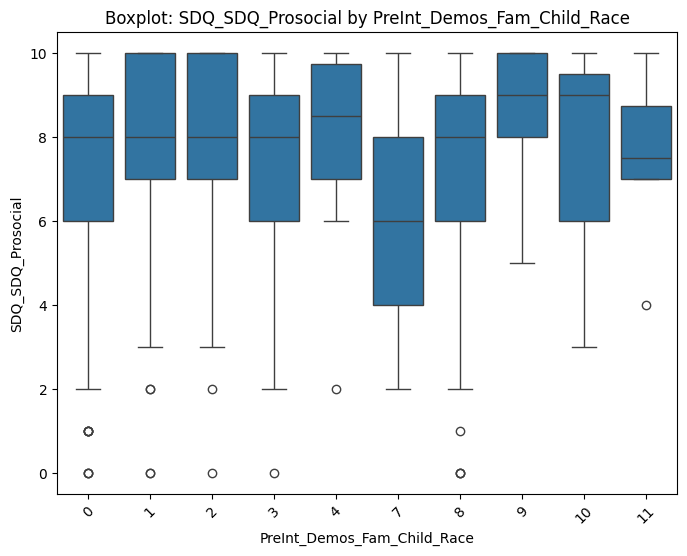


📊 Average SDQ_SDQ_Prosocial per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     7.569378
1     7.950276
2     7.890625
3     7.200000
4     7.800000
7     6.000000
8     7.656410
9     8.608696
10    7.545455
11    7.500000
Name: SDQ_SDQ_Prosocial, dtype: float64


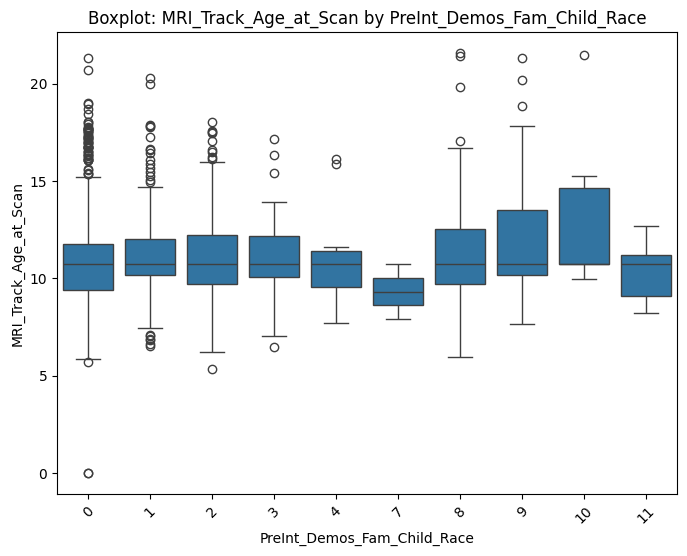


📊 Average MRI_Track_Age_at_Scan per PreInt_Demos_Fam_Child_Race:
PreInt_Demos_Fam_Child_Race
0     10.958844
1     11.216353
2     11.136472
3     11.040052
4     11.180846
7      9.322553
8     11.196702
9     12.222256
10    13.044002
11    10.375161
Name: MRI_Track_Age_at_Scan, dtype: float64


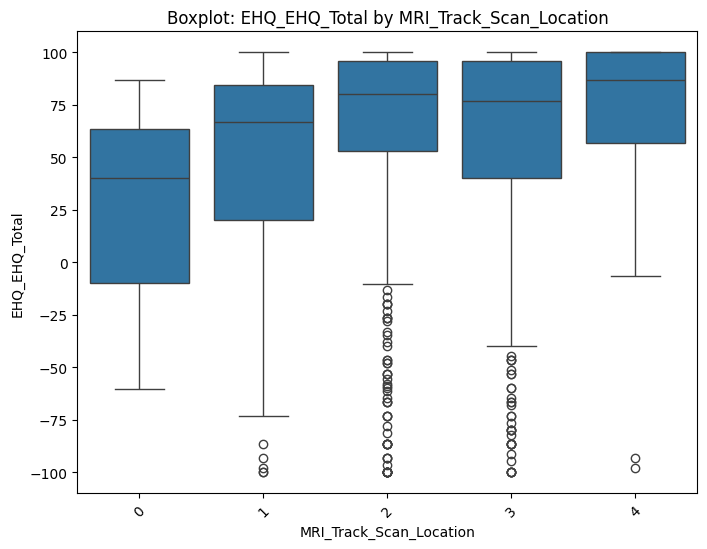


📊 Average EHQ_EHQ_Total per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    22.200000
1    48.802682
2    61.827256
3    59.056479
4    66.115833
Name: EHQ_EHQ_Total, dtype: float64


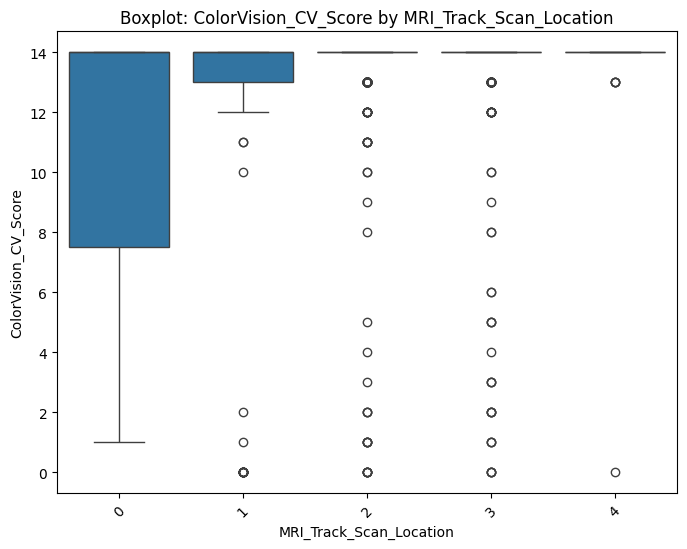


📊 Average ColorVision_CV_Score per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0     9.666667
1    12.128492
2    13.368421
3    13.328294
4    13.500000
Name: ColorVision_CV_Score, dtype: float64


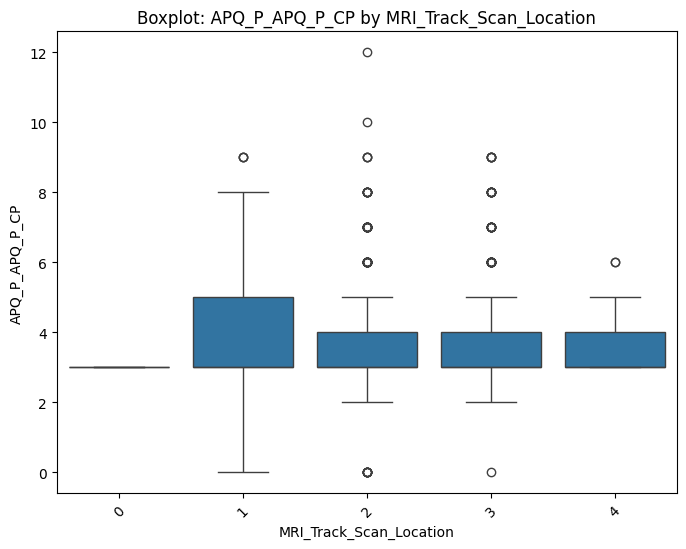


📊 Average APQ_P_APQ_P_CP per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    3.000000
1    3.977654
2    3.742481
3    3.779698
4    3.472222
Name: APQ_P_APQ_P_CP, dtype: float64


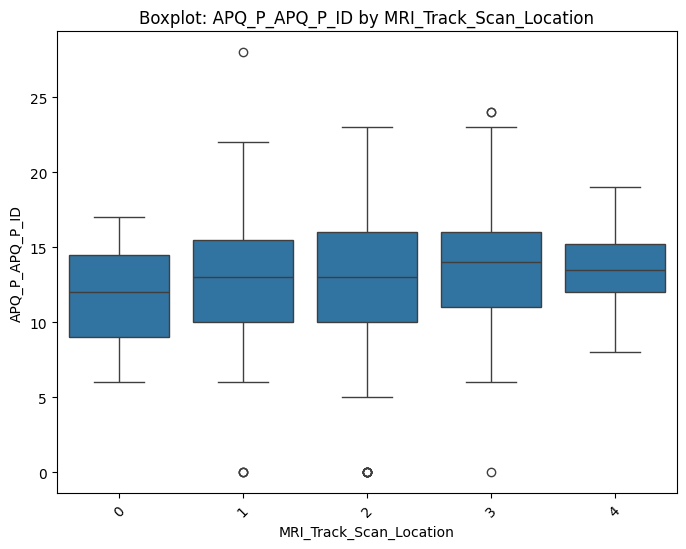


📊 Average APQ_P_APQ_P_ID per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    11.666667
1    12.798883
2    13.030075
3    13.552916
4    13.472222
Name: APQ_P_APQ_P_ID, dtype: float64


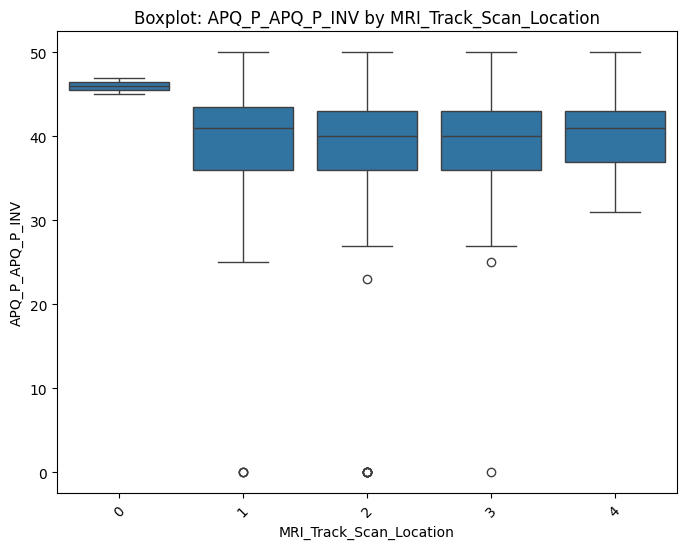


📊 Average APQ_P_APQ_P_INV per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    46.000000
1    39.424581
2    39.383459
3    39.233261
4    40.250000
Name: APQ_P_APQ_P_INV, dtype: float64


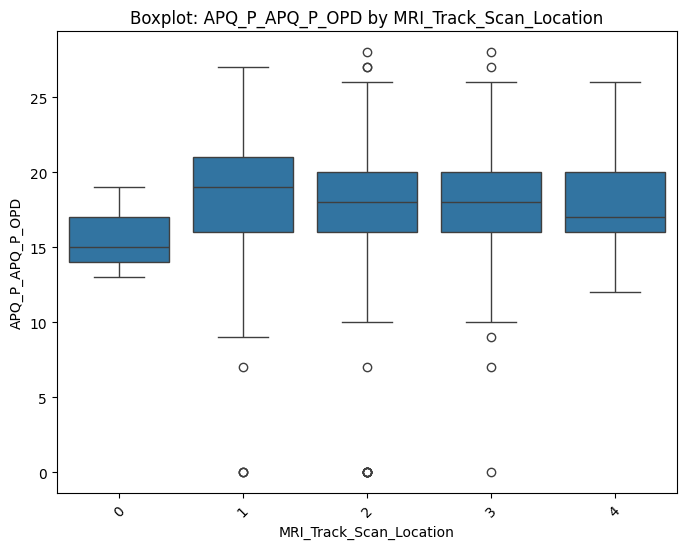


📊 Average APQ_P_APQ_P_OPD per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    15.666667
1    18.351955
2    17.693609
3    17.708423
4    17.500000
Name: APQ_P_APQ_P_OPD, dtype: float64


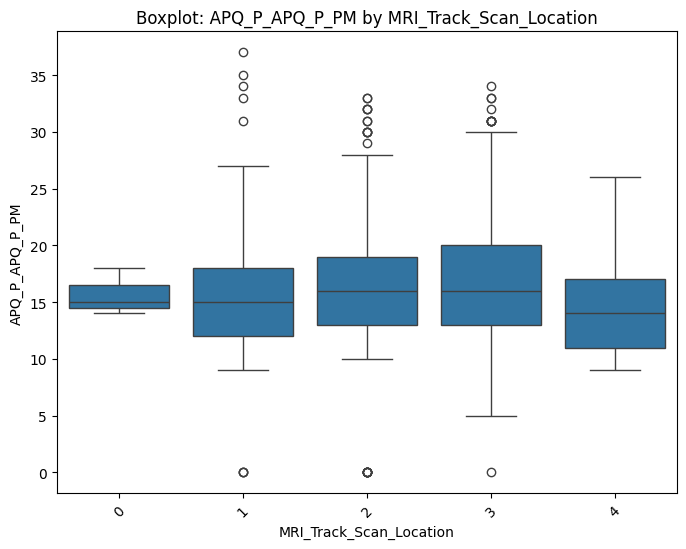


📊 Average APQ_P_APQ_P_PM per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    15.666667
1    15.748603
2    16.268797
3    16.946004
4    14.388889
Name: APQ_P_APQ_P_PM, dtype: float64


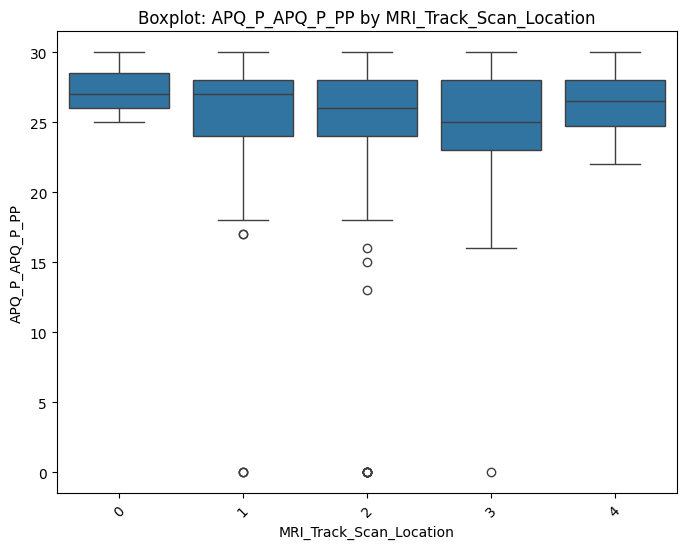


📊 Average APQ_P_APQ_P_PP per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    27.333333
1    25.569832
2    25.278195
3    25.002160
4    26.138889
Name: APQ_P_APQ_P_PP, dtype: float64


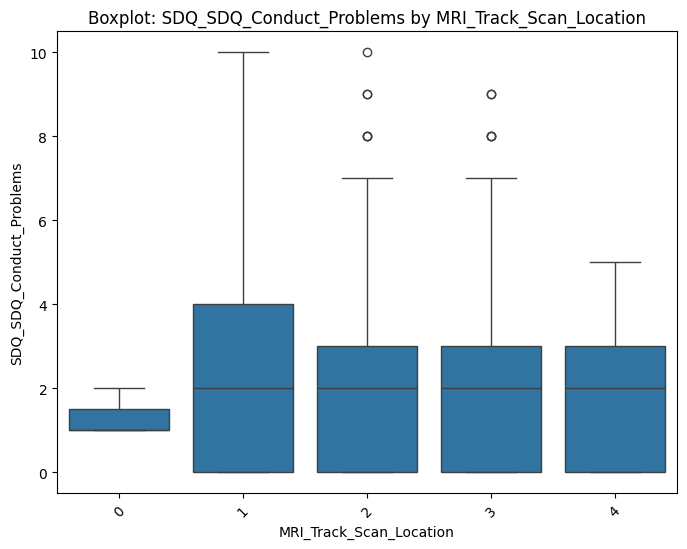


📊 Average SDQ_SDQ_Conduct_Problems per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    1.333333
1    2.329609
2    2.073308
3    1.946004
4    2.027778
Name: SDQ_SDQ_Conduct_Problems, dtype: float64


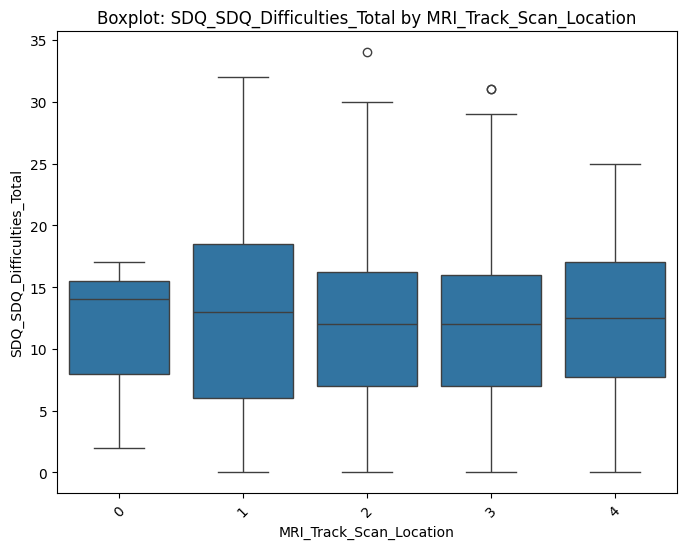


📊 Average SDQ_SDQ_Difficulties_Total per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    11.000000
1    12.726257
2    12.159774
3    11.835853
4    12.361111
Name: SDQ_SDQ_Difficulties_Total, dtype: float64


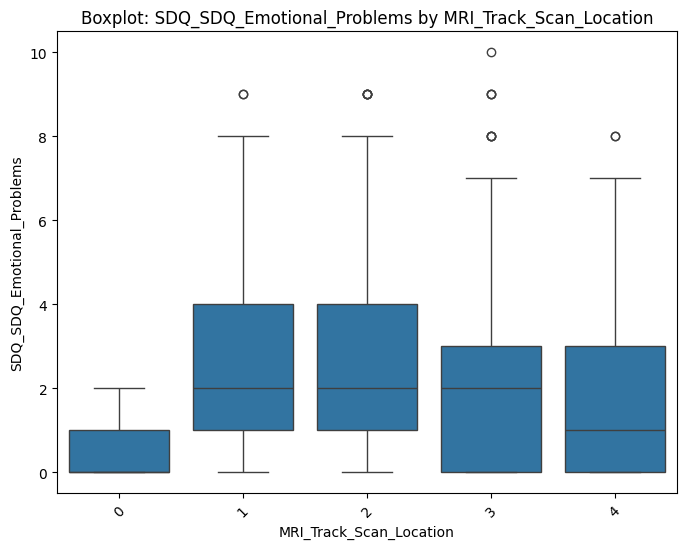


📊 Average SDQ_SDQ_Emotional_Problems per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    0.666667
1    2.564246
2    2.413534
3    2.138229
4    1.777778
Name: SDQ_SDQ_Emotional_Problems, dtype: float64


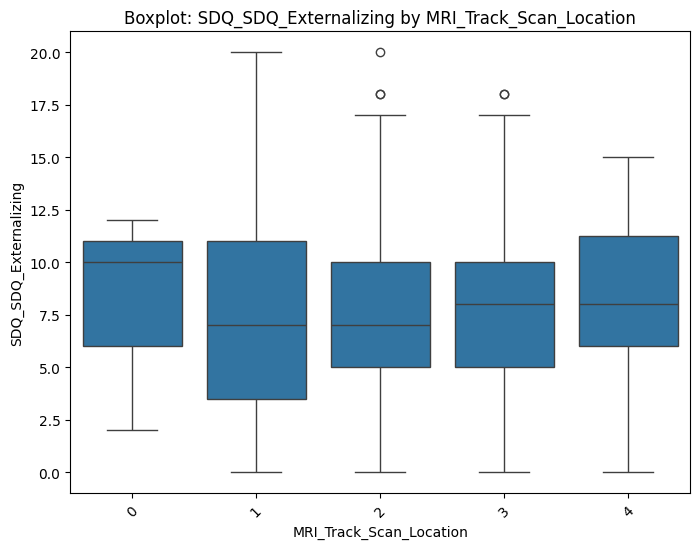


📊 Average SDQ_SDQ_Externalizing per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    8.000000
1    7.480447
2    7.419173
3    7.678186
4    8.388889
Name: SDQ_SDQ_Externalizing, dtype: float64


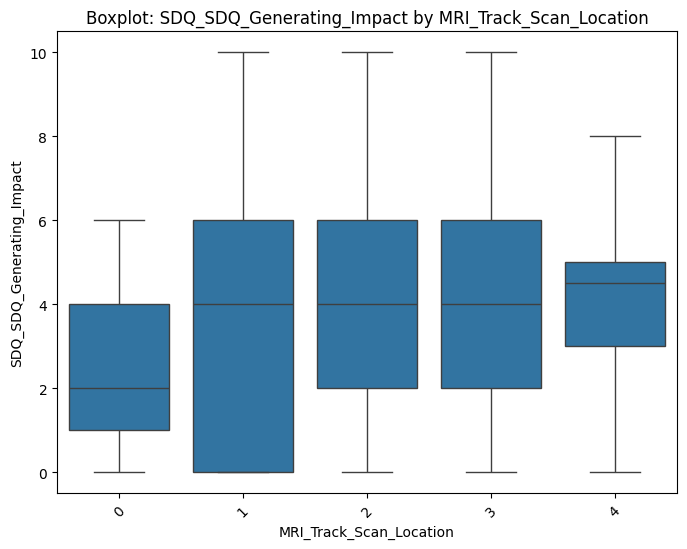


📊 Average SDQ_SDQ_Generating_Impact per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    2.666667
1    3.703911
2    4.110902
3    4.168467
4    4.250000
Name: SDQ_SDQ_Generating_Impact, dtype: float64


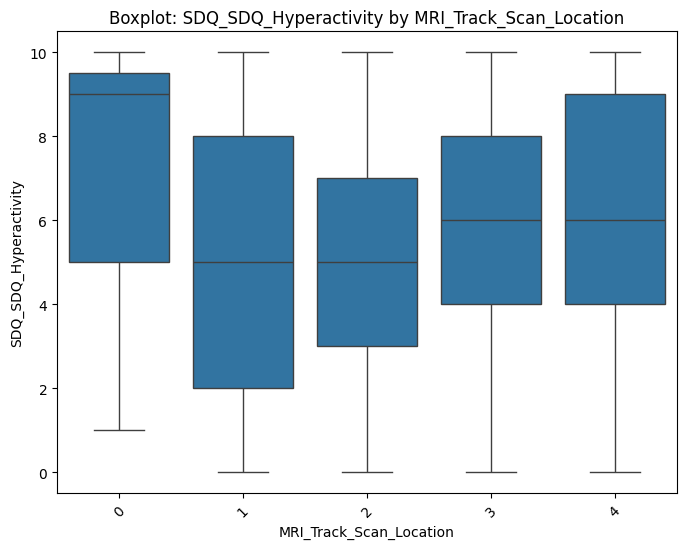


📊 Average SDQ_SDQ_Hyperactivity per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    6.666667
1    5.150838
2    5.345865
3    5.732181
4    6.361111
Name: SDQ_SDQ_Hyperactivity, dtype: float64


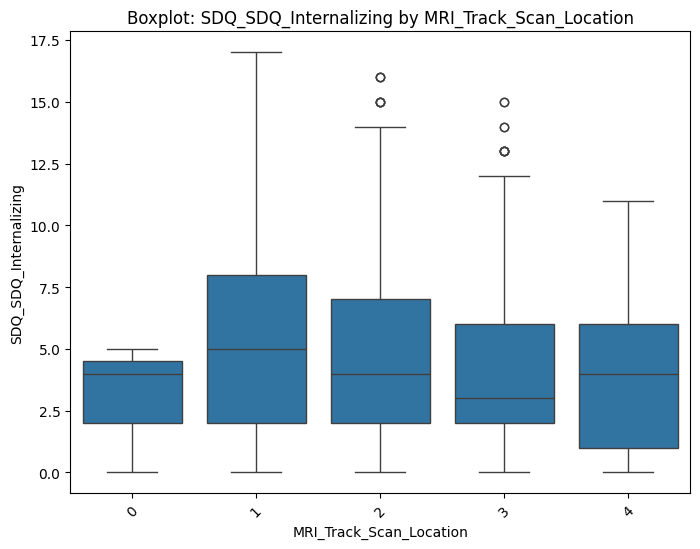


📊 Average SDQ_SDQ_Internalizing per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    3.000000
1    5.245810
2    4.740602
3    4.157667
4    3.972222
Name: SDQ_SDQ_Internalizing, dtype: float64


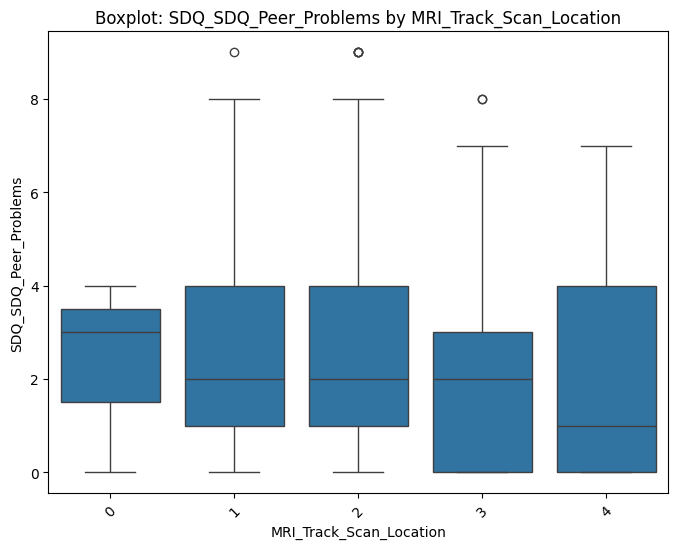


📊 Average SDQ_SDQ_Peer_Problems per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    2.333333
1    2.681564
2    2.327068
3    2.019438
4    2.194444
Name: SDQ_SDQ_Peer_Problems, dtype: float64


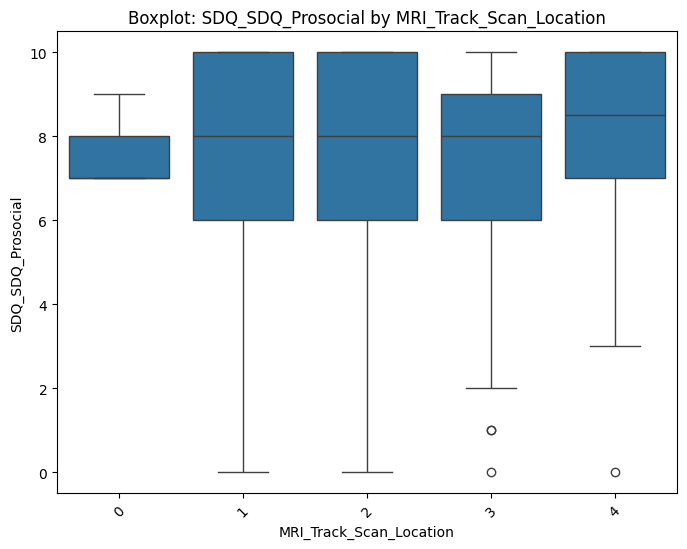


📊 Average SDQ_SDQ_Prosocial per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0    7.666667
1    7.553073
2    7.738722
3    7.643629
4    8.027778
Name: SDQ_SDQ_Prosocial, dtype: float64


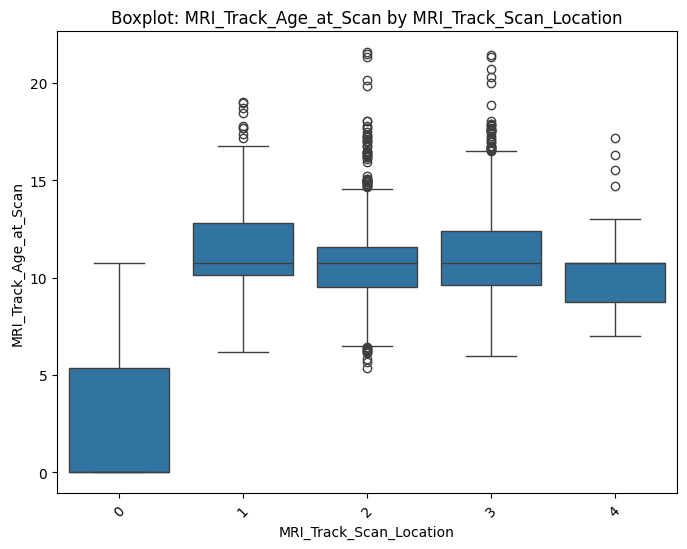


📊 Average MRI_Track_Age_at_Scan per MRI_Track_Scan_Location:
MRI_Track_Scan_Location
0     3.579740
1    11.446915
2    10.864144
3    11.315166
4    10.563860
Name: MRI_Track_Age_at_Scan, dtype: float64


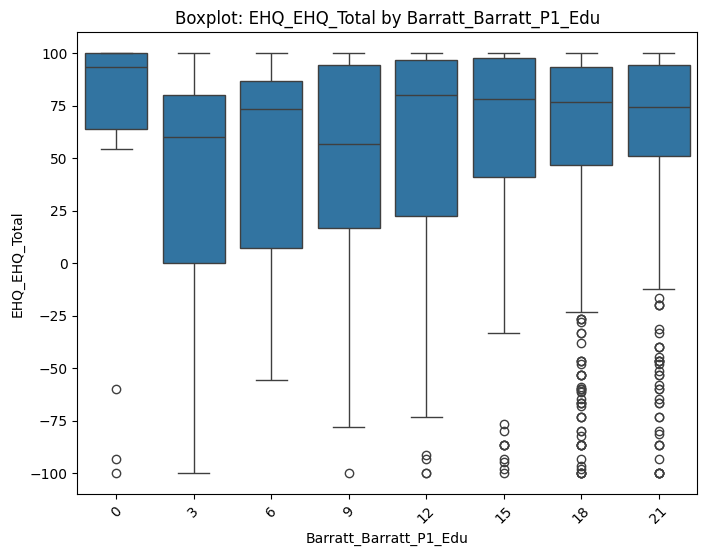


📊 Average EHQ_EHQ_Total per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     55.495333
3     28.000000
6     49.997333
9     42.978929
12    55.584845
15    58.910123
18    57.787102
21    62.188000
Name: EHQ_EHQ_Total, dtype: float64


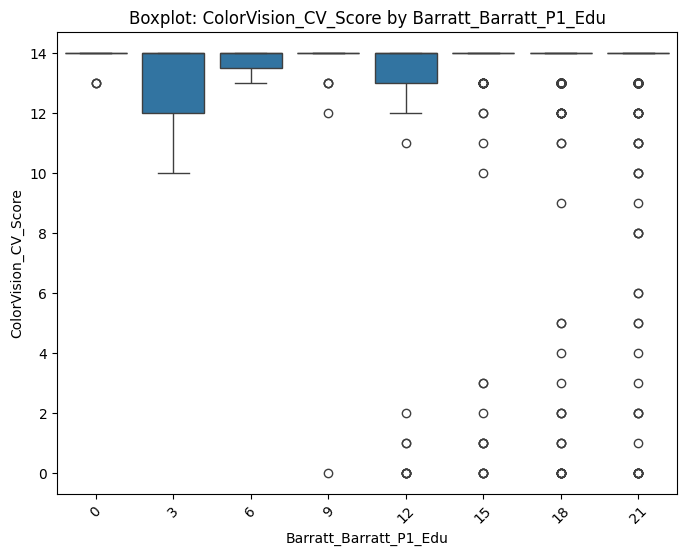


📊 Average ColorVision_CV_Score per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     13.800000
3     12.800000
6     13.733333
9     13.321429
12    12.505155
15    12.876543
18    13.209026
21    13.317021
Name: ColorVision_CV_Score, dtype: float64


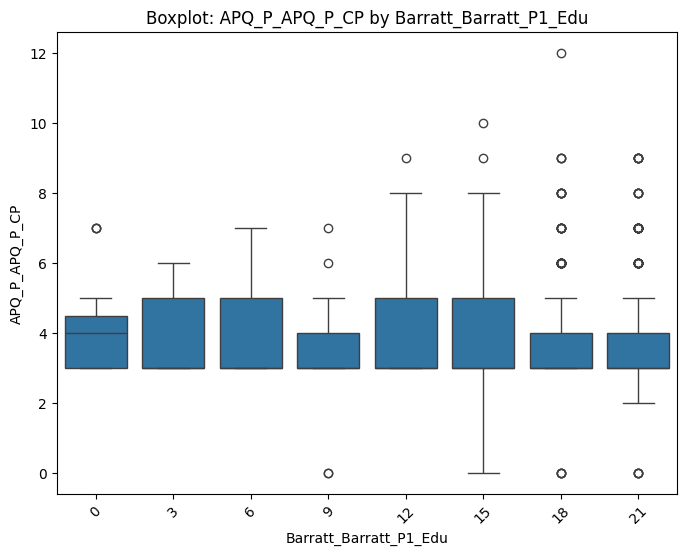


📊 Average APQ_P_APQ_P_CP per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     4.266667
3     4.000000
6     4.000000
9     3.321429
12    3.969072
15    4.024691
18    3.750594
21    3.689362
Name: APQ_P_APQ_P_CP, dtype: float64


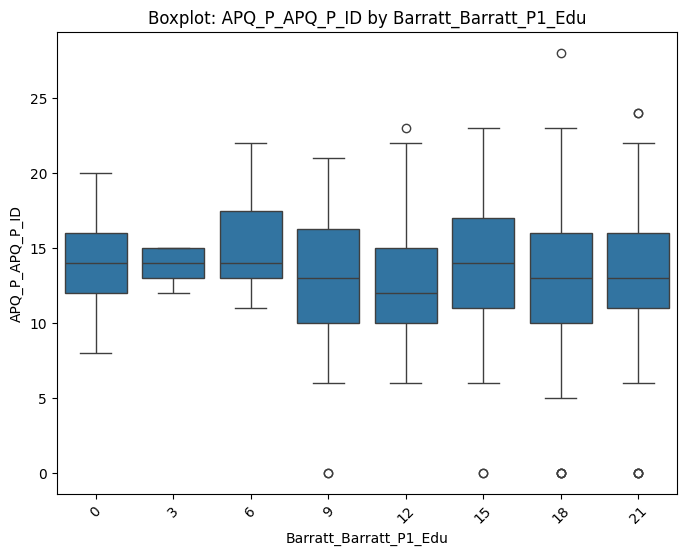


📊 Average APQ_P_APQ_P_ID per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     13.866667
3     13.800000
6     15.066667
9     12.678571
12    12.505155
15    13.703704
18    13.118765
21    13.200000
Name: APQ_P_APQ_P_ID, dtype: float64


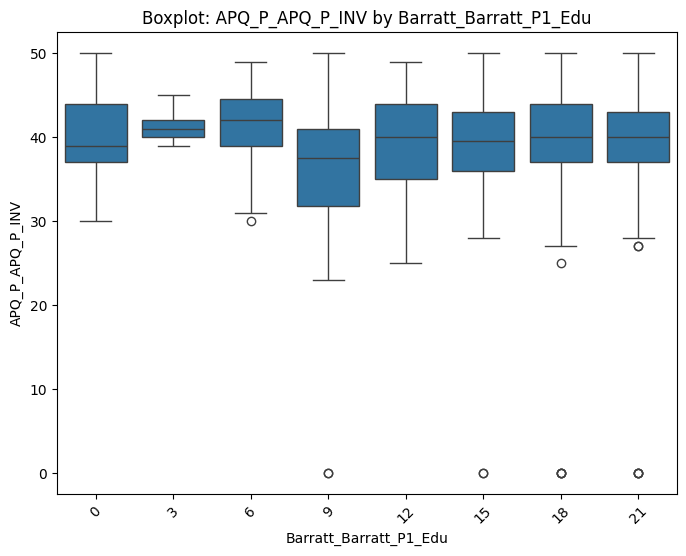


📊 Average APQ_P_APQ_P_INV per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     40.266667
3     41.400000
6     40.933333
9     35.035714
12    39.195876
15    39.055556
18    39.741093
21    39.351064
Name: APQ_P_APQ_P_INV, dtype: float64


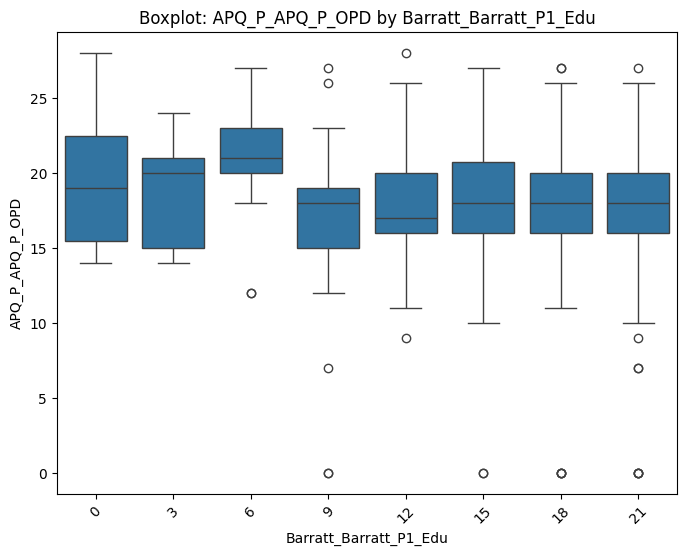


📊 Average APQ_P_APQ_P_OPD per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     19.400000
3     18.800000
6     20.600000
9     16.821429
12    17.783505
15    18.283951
18    17.902613
21    17.414894
Name: APQ_P_APQ_P_OPD, dtype: float64


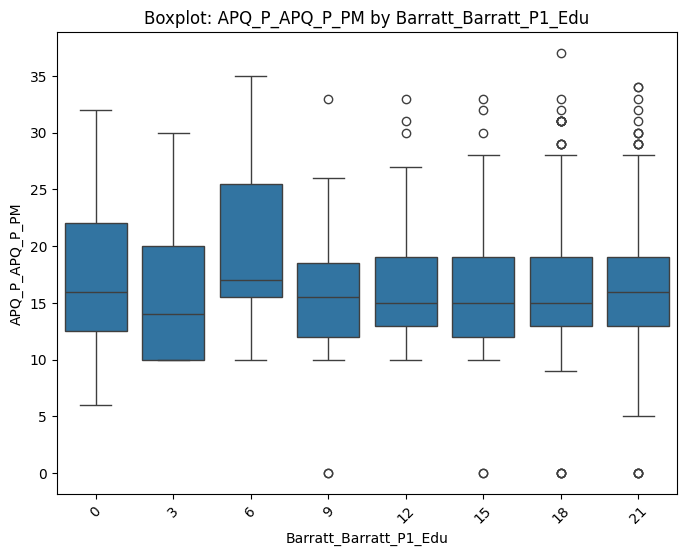


📊 Average APQ_P_APQ_P_PM per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     17.200000
3     16.800000
6     20.066667
9     15.857143
12    16.639175
15    16.148148
18    16.301663
21    16.393617
Name: APQ_P_APQ_P_PM, dtype: float64


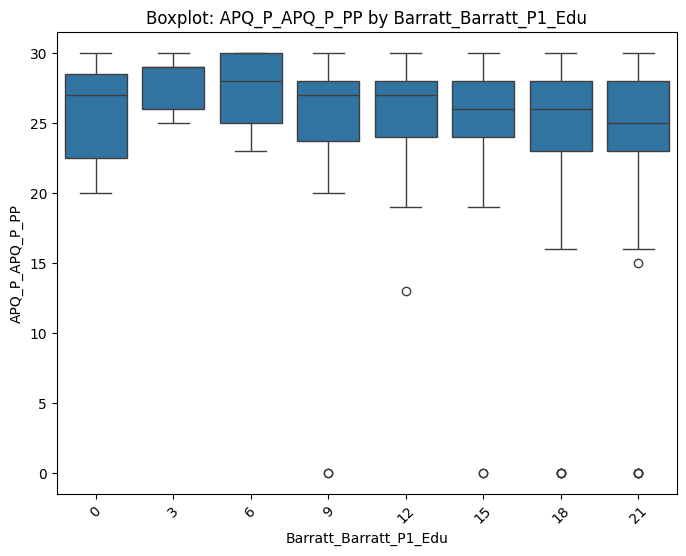


📊 Average APQ_P_APQ_P_PP per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     25.866667
3     27.800000
6     27.133333
9     24.500000
12    25.896907
15    25.611111
18    25.299287
21    24.876596
Name: APQ_P_APQ_P_PP, dtype: float64


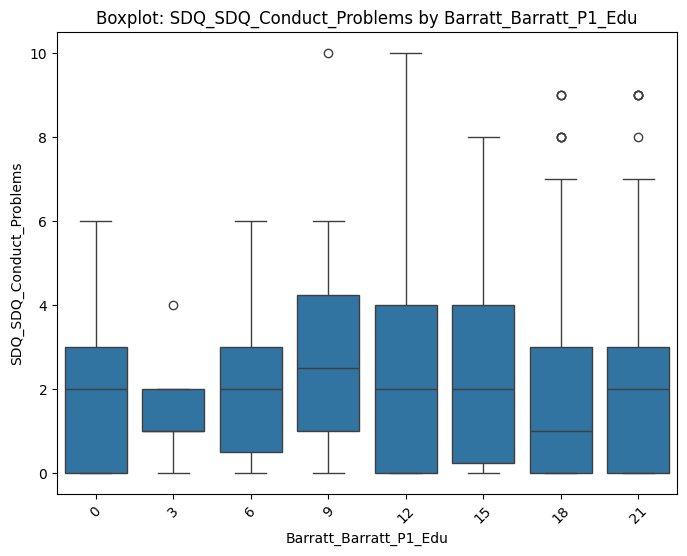


📊 Average SDQ_SDQ_Conduct_Problems per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     2.133333
3     1.600000
6     2.000000
9     2.821429
12    2.164948
15    2.308642
18    1.997625
21    1.965957
Name: SDQ_SDQ_Conduct_Problems, dtype: float64


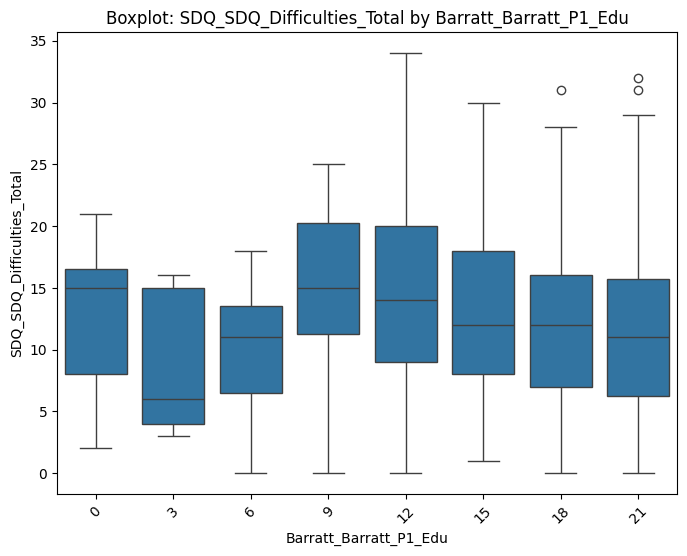


📊 Average SDQ_SDQ_Difficulties_Total per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     12.733333
3      8.800000
6     10.133333
9     14.785714
12    14.298969
15    12.907407
18    12.054632
21    11.385106
Name: SDQ_SDQ_Difficulties_Total, dtype: float64


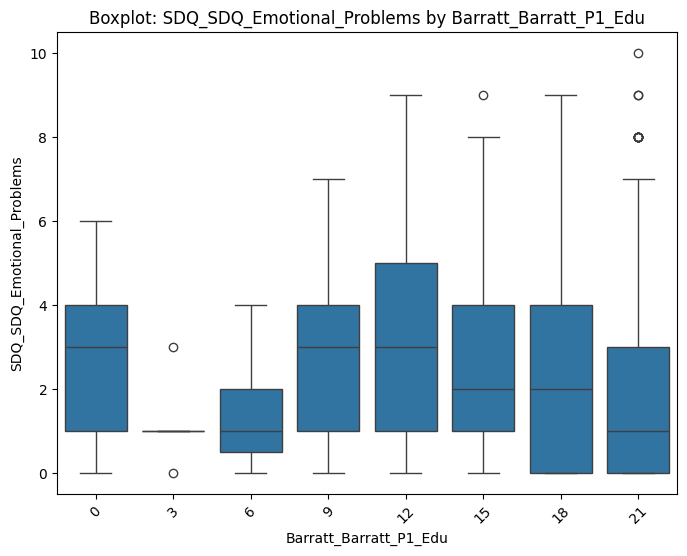


📊 Average SDQ_SDQ_Emotional_Problems per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     2.733333
3     1.200000
6     1.400000
9     2.892857
12    2.958763
15    2.592593
18    2.289786
21    2.082979
Name: SDQ_SDQ_Emotional_Problems, dtype: float64


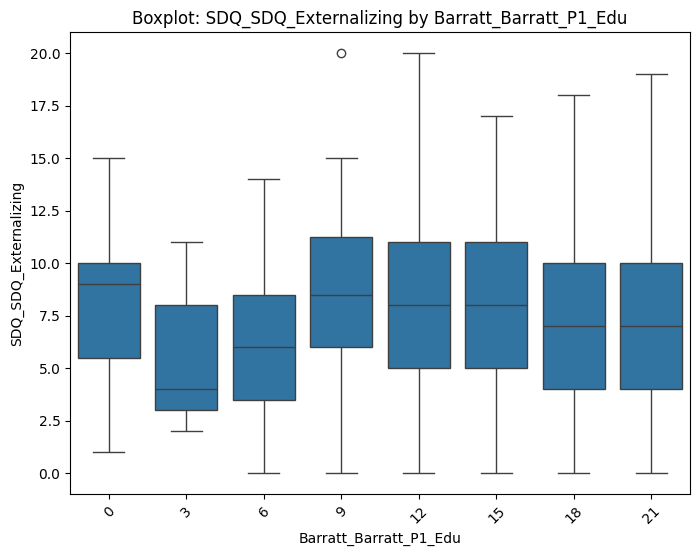


📊 Average SDQ_SDQ_Externalizing per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     7.933333
3     5.600000
6     6.200000
9     8.714286
12    8.309278
15    7.864198
18    7.489311
21    7.340426
Name: SDQ_SDQ_Externalizing, dtype: float64


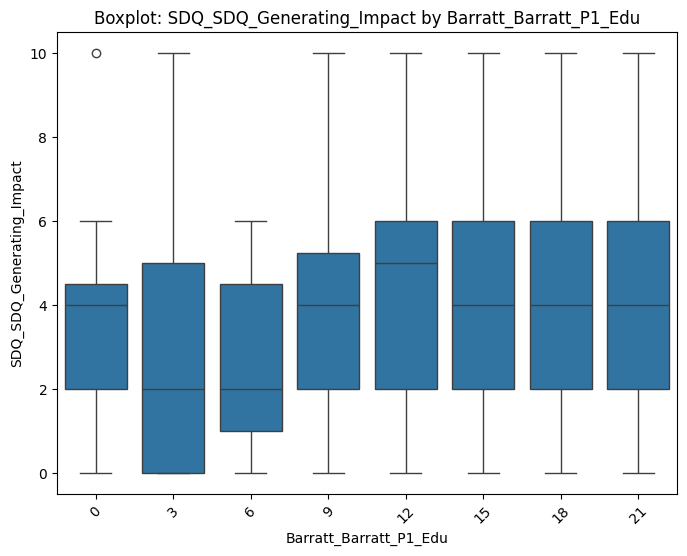


📊 Average SDQ_SDQ_Generating_Impact per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     3.733333
3     3.400000
6     2.533333
9     4.107143
12    4.402062
15    4.277778
18    4.118765
21    3.959574
Name: SDQ_SDQ_Generating_Impact, dtype: float64


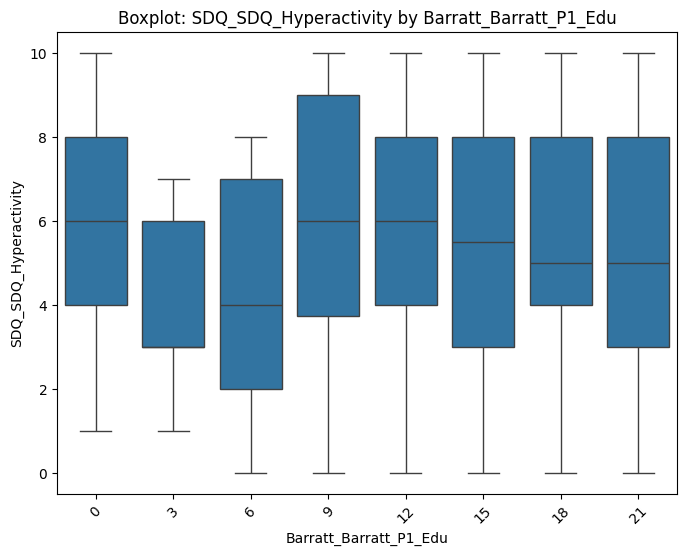


📊 Average SDQ_SDQ_Hyperactivity per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     5.800000
3     4.000000
6     4.200000
9     5.892857
12    6.144330
15    5.555556
18    5.491686
21    5.374468
Name: SDQ_SDQ_Hyperactivity, dtype: float64


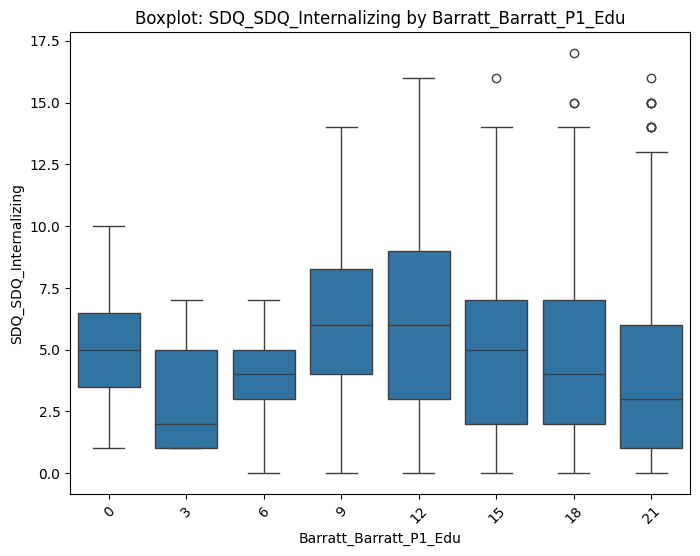


📊 Average SDQ_SDQ_Internalizing per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     4.800000
3     3.200000
6     3.933333
9     6.071429
12    5.989691
15    5.043210
18    4.565321
21    4.044681
Name: SDQ_SDQ_Internalizing, dtype: float64


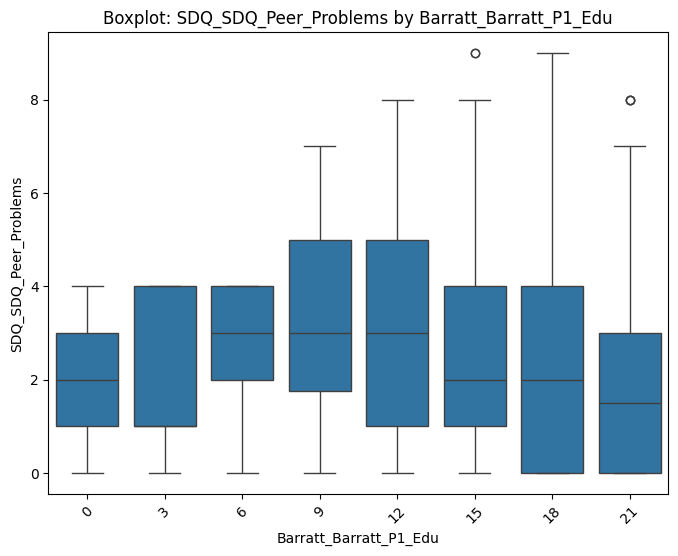


📊 Average SDQ_SDQ_Peer_Problems per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     2.066667
3     2.000000
6     2.533333
9     3.178571
12    3.030928
15    2.450617
18    2.275534
21    1.961702
Name: SDQ_SDQ_Peer_Problems, dtype: float64


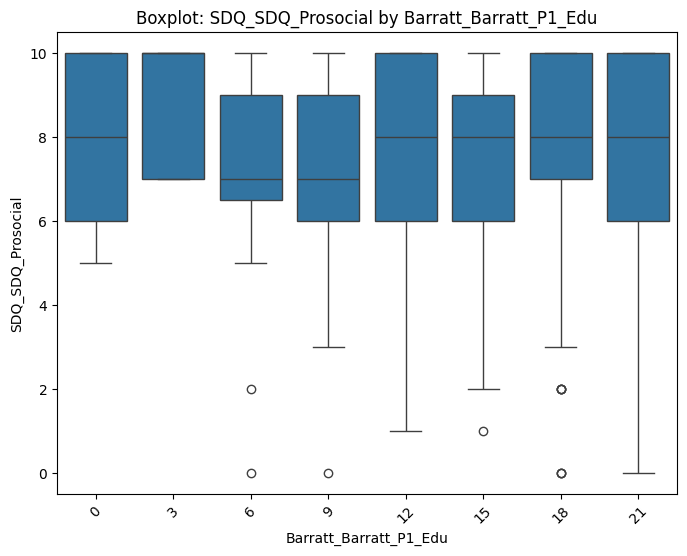


📊 Average SDQ_SDQ_Prosocial per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     8.000000
3     8.800000
6     6.933333
9     6.964286
12    7.659794
15    7.524691
18    7.767221
21    7.712766
Name: SDQ_SDQ_Prosocial, dtype: float64


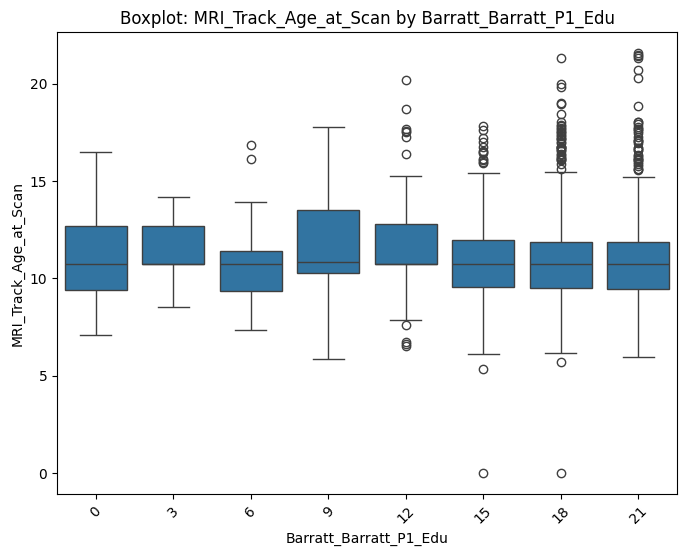


📊 Average MRI_Track_Age_at_Scan per Barratt_Barratt_P1_Edu:
Barratt_Barratt_P1_Edu
0     11.221560
3     11.371685
6     10.977960
9     11.716970
12    11.637453
15    10.945639
18    11.056753
21    11.029440
Name: MRI_Track_Age_at_Scan, dtype: float64


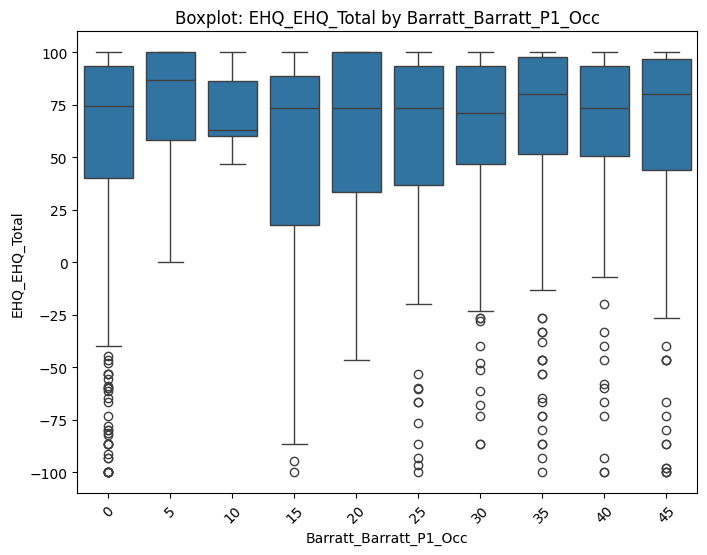


📊 Average EHQ_EHQ_Total per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     54.629874
5     72.481290
10    70.935000
15    46.266857
20    61.938710
25    50.487595
30    59.869091
35    63.893425
40    61.184545
45    60.238610
Name: EHQ_EHQ_Total, dtype: float64


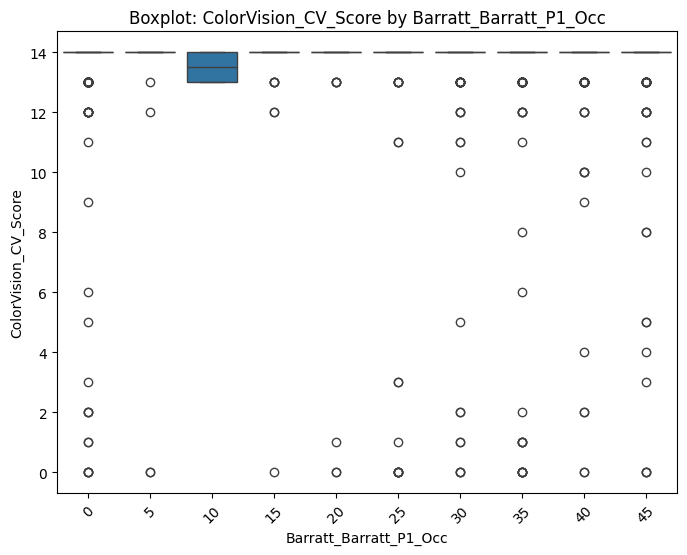


📊 Average ColorVision_CV_Score per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     13.331230
5     13.000000
10    13.500000
15    13.371429
20    12.548387
25    12.341772
30    13.155844
35    13.086758
40    13.311688
45    13.288770
Name: ColorVision_CV_Score, dtype: float64


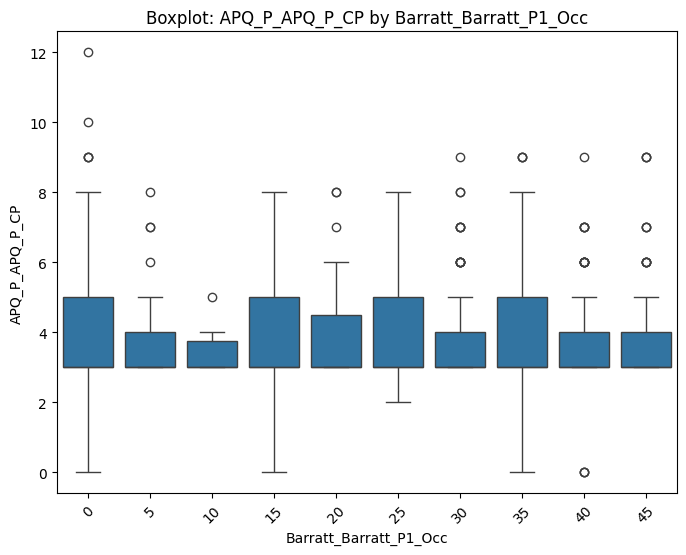


📊 Average APQ_P_APQ_P_CP per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     3.873817
5     3.774194
10    3.500000
15    3.771429
20    3.935484
25    4.101266
30    3.694805
35    3.890411
40    3.629870
45    3.545455
Name: APQ_P_APQ_P_CP, dtype: float64


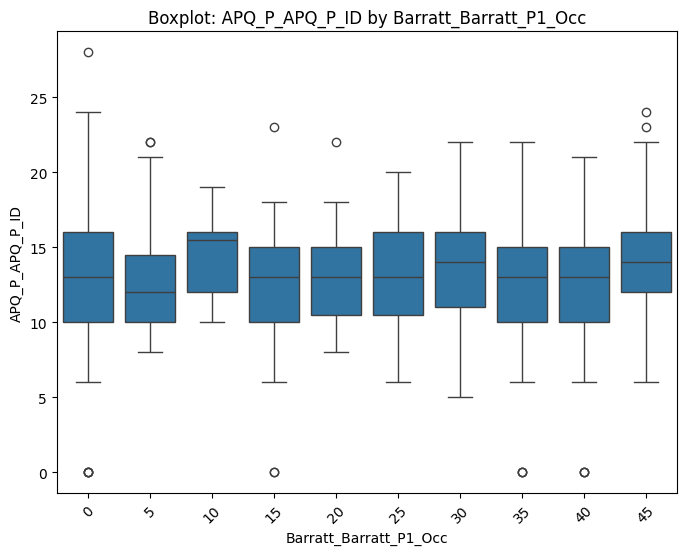


📊 Average APQ_P_APQ_P_ID per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     13.242902
5     13.096774
10    14.500000
15    12.514286
20    12.903226
25    13.139241
30    13.564935
35    12.808219
40    12.538961
45    14.042781
Name: APQ_P_APQ_P_ID, dtype: float64


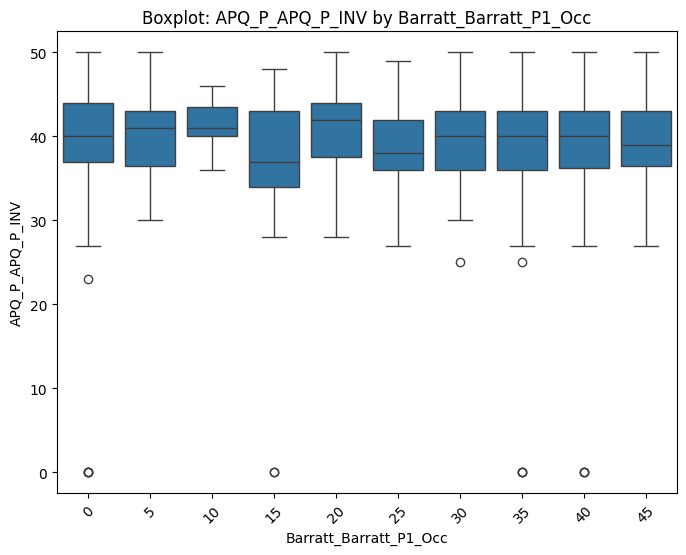


📊 Average APQ_P_APQ_P_INV per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     39.735016
5     39.870968
10    41.333333
15    36.685714
20    40.645161
25    39.037975
30    39.610390
35    38.963470
40    39.233766
45    39.454545
Name: APQ_P_APQ_P_INV, dtype: float64


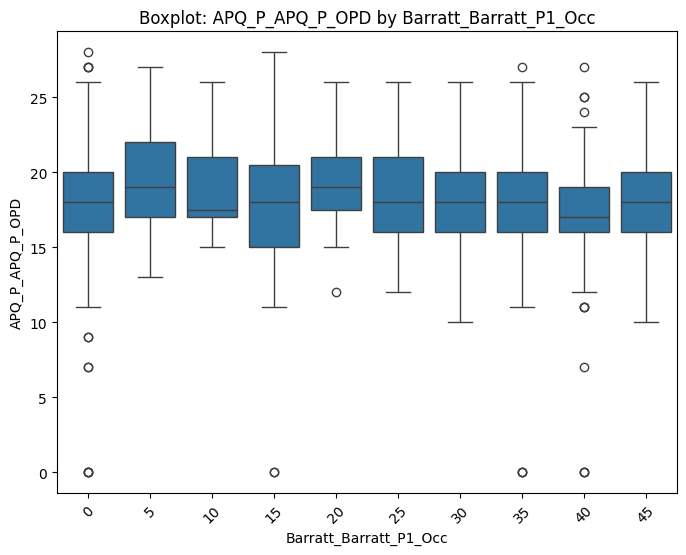


📊 Average APQ_P_APQ_P_OPD per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     17.662461
5     19.419355
10    19.166667
15    17.400000
20    19.000000
25    18.329114
30    17.967532
35    17.712329
40    17.181818
45    17.754011
Name: APQ_P_APQ_P_OPD, dtype: float64


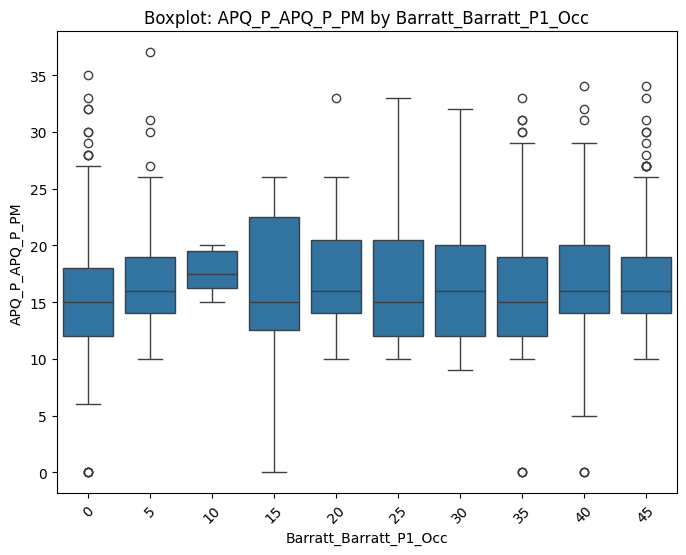


📊 Average APQ_P_APQ_P_PM per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     15.880126
5     17.741935
10    17.666667
15    16.457143
20    17.419355
25    16.417722
30    17.000000
35    15.954338
40    16.655844
45    16.604278
Name: APQ_P_APQ_P_PM, dtype: float64


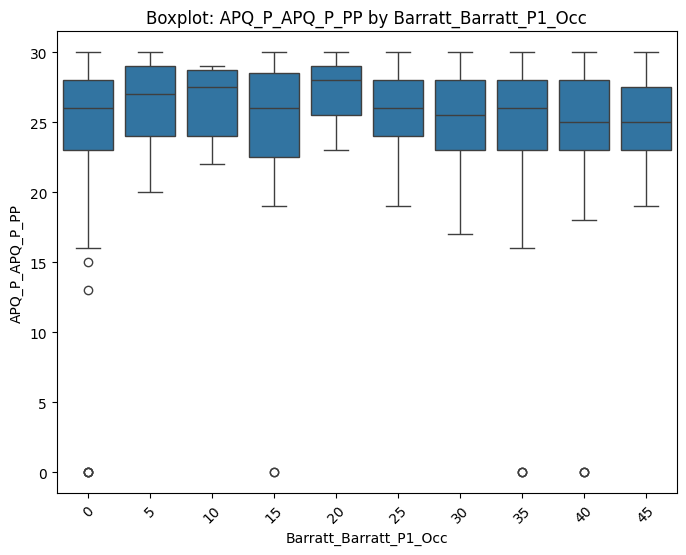


📊 Average APQ_P_APQ_P_PP per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     25.025237
5     26.258065
10    26.333333
15    24.257143
20    27.096774
25    25.708861
30    25.285714
35    25.287671
40    24.961039
45    25.256684
Name: APQ_P_APQ_P_PP, dtype: float64


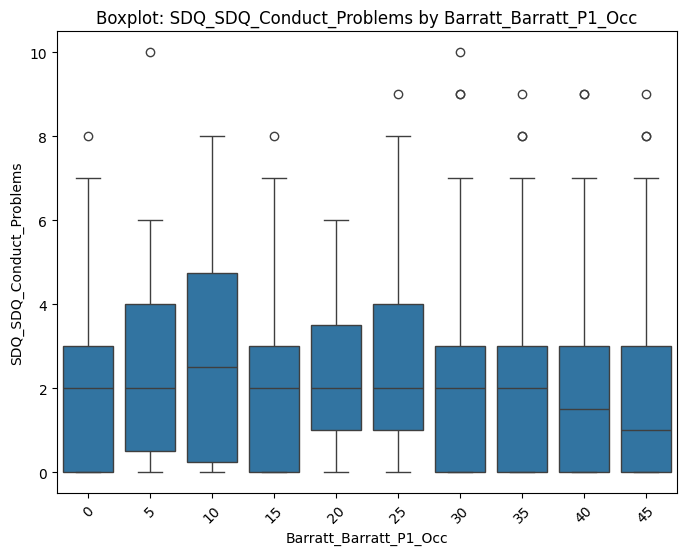


📊 Average SDQ_SDQ_Conduct_Problems per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     2.104101
5     2.354839
10    3.000000
15    2.057143
20    2.064516
25    2.417722
30    1.883117
35    2.050228
40    1.993506
45    1.962567
Name: SDQ_SDQ_Conduct_Problems, dtype: float64


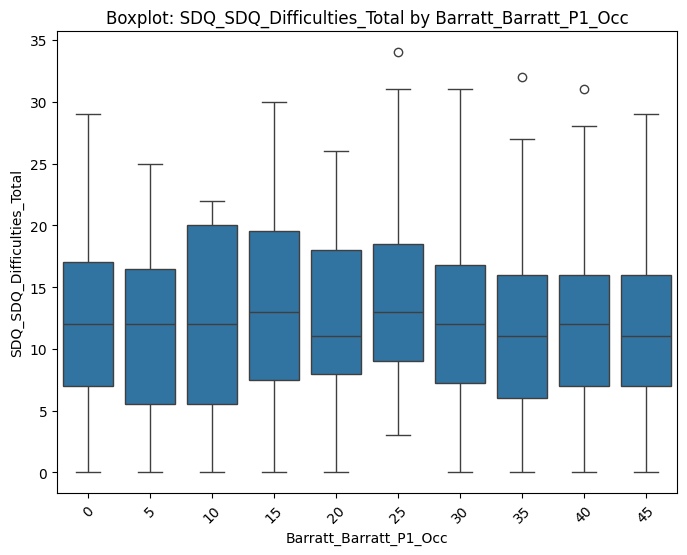


📊 Average SDQ_SDQ_Difficulties_Total per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     12.283912
5     12.096774
10    12.000000
15    13.400000
20    12.516129
25    13.911392
30    12.272727
35    11.675799
40    11.720779
45    11.529412
Name: SDQ_SDQ_Difficulties_Total, dtype: float64


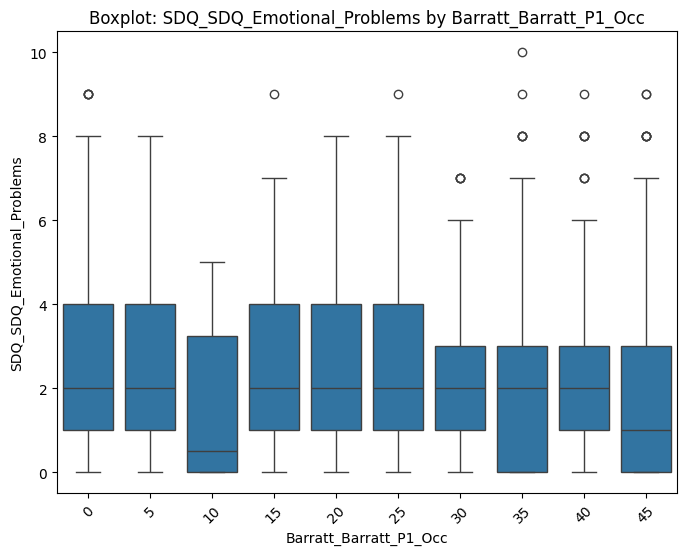


📊 Average SDQ_SDQ_Emotional_Problems per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     2.501577
5     2.548387
10    1.666667
15    2.685714
20    2.741935
25    2.721519
30    2.181818
35    2.136986
40    2.207792
45    2.026738
Name: SDQ_SDQ_Emotional_Problems, dtype: float64


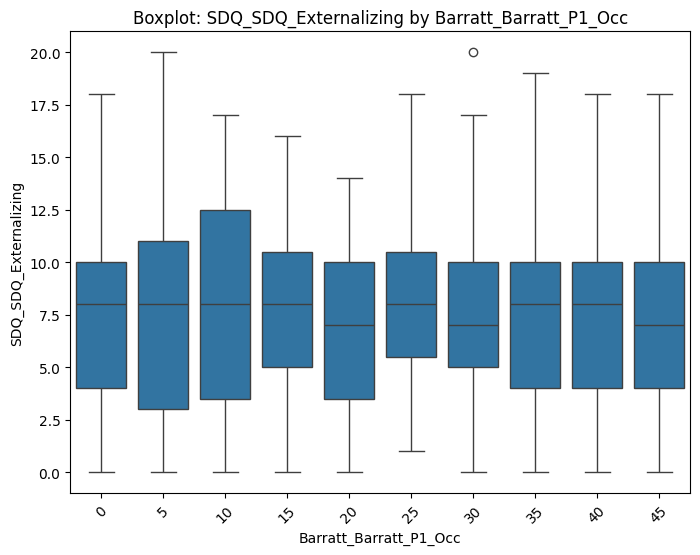


📊 Average SDQ_SDQ_Externalizing per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     7.495268
5     7.451613
10    8.166667
15    7.885714
20    7.000000
25    8.354430
30    7.662338
35    7.397260
40    7.584416
45    7.433155
Name: SDQ_SDQ_Externalizing, dtype: float64


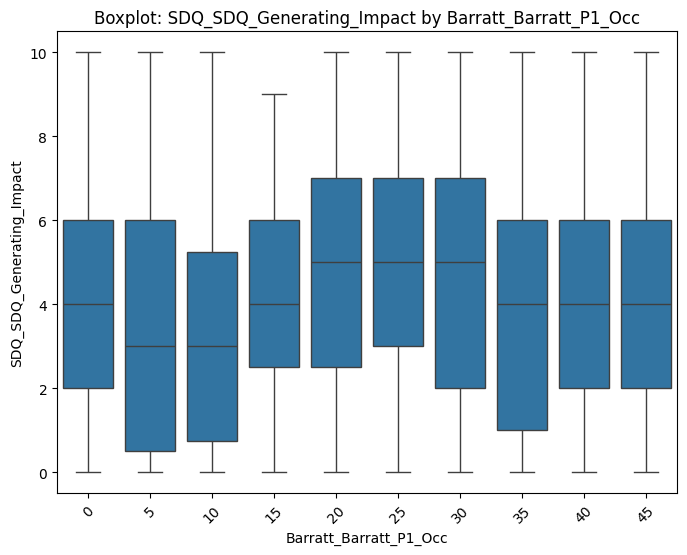


📊 Average SDQ_SDQ_Generating_Impact per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     4.072555
5     3.677419
10    3.666667
15    4.342857
20    4.483871
25    4.797468
30    4.402597
35    3.680365
40    4.181818
45    3.828877
Name: SDQ_SDQ_Generating_Impact, dtype: float64


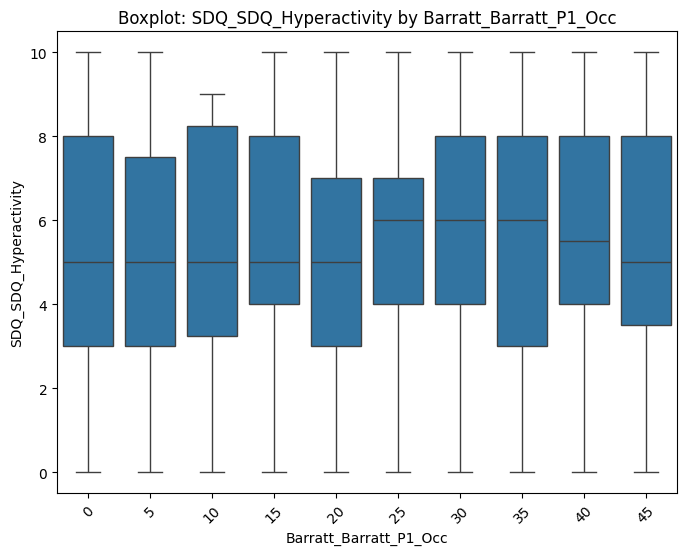


📊 Average SDQ_SDQ_Hyperactivity per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     5.391167
5     5.096774
10    5.166667
15    5.828571
20    4.935484
25    5.936709
30    5.779221
35    5.347032
40    5.590909
45    5.470588
Name: SDQ_SDQ_Hyperactivity, dtype: float64


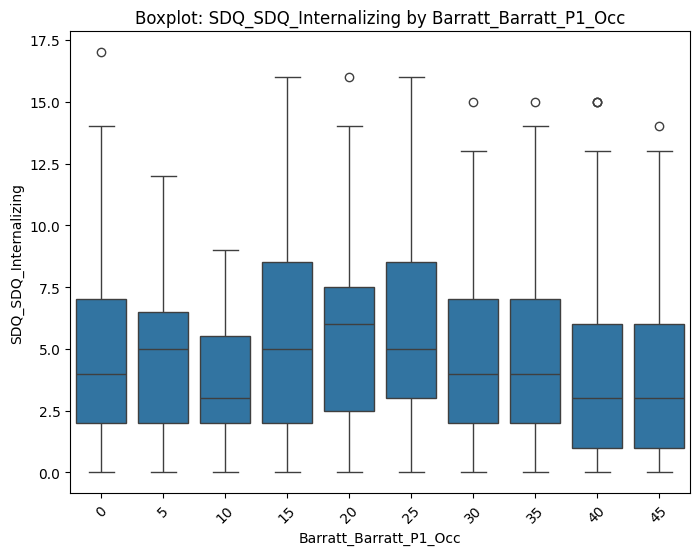


📊 Average SDQ_SDQ_Internalizing per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     4.788644
5     4.645161
10    3.833333
15    5.514286
20    5.516129
25    5.556962
30    4.610390
35    4.278539
40    4.136364
45    4.096257
Name: SDQ_SDQ_Internalizing, dtype: float64


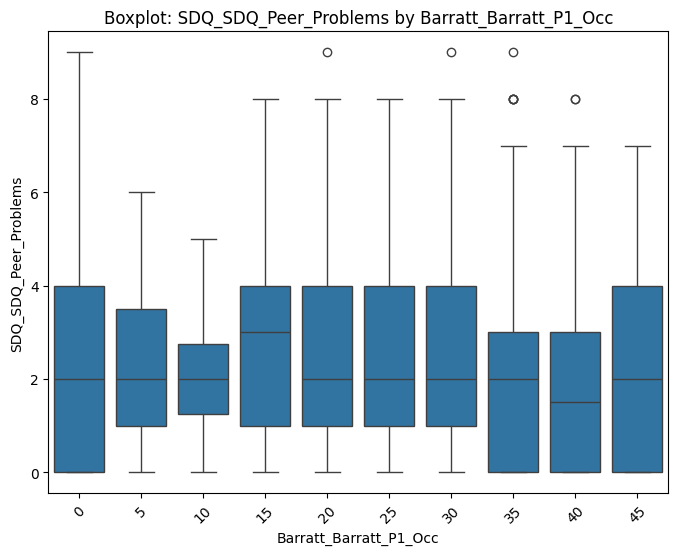


📊 Average SDQ_SDQ_Peer_Problems per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     2.287066
5     2.096774
10    2.166667
15    2.828571
20    2.774194
25    2.835443
30    2.428571
35    2.141553
40    1.928571
45    2.069519
Name: SDQ_SDQ_Peer_Problems, dtype: float64


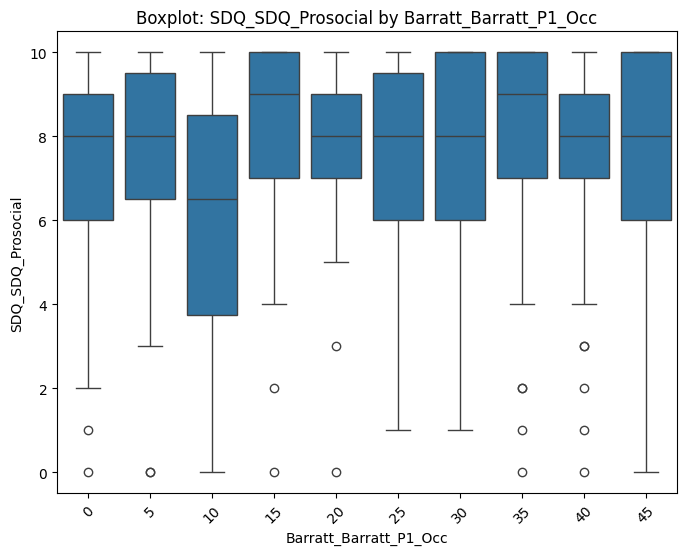


📊 Average SDQ_SDQ_Prosocial per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     7.561514
5     7.322581
10    5.833333
15    7.857143
20    7.677419
25    7.620253
30    7.545455
35    8.000000
40    7.896104
45    7.572193
Name: SDQ_SDQ_Prosocial, dtype: float64


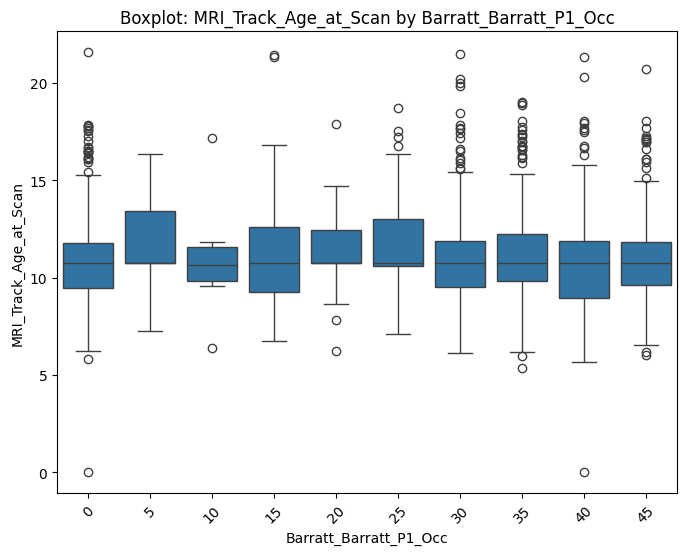


📊 Average MRI_Track_Age_at_Scan per Barratt_Barratt_P1_Occ:
Barratt_Barratt_P1_Occ
0     10.905732
5     11.636112
10    11.048635
15    11.442524
20    11.254910
25    11.622537
30    11.215029
35    11.202180
40    10.841276
45    11.000187
Name: MRI_Track_Age_at_Scan, dtype: float64


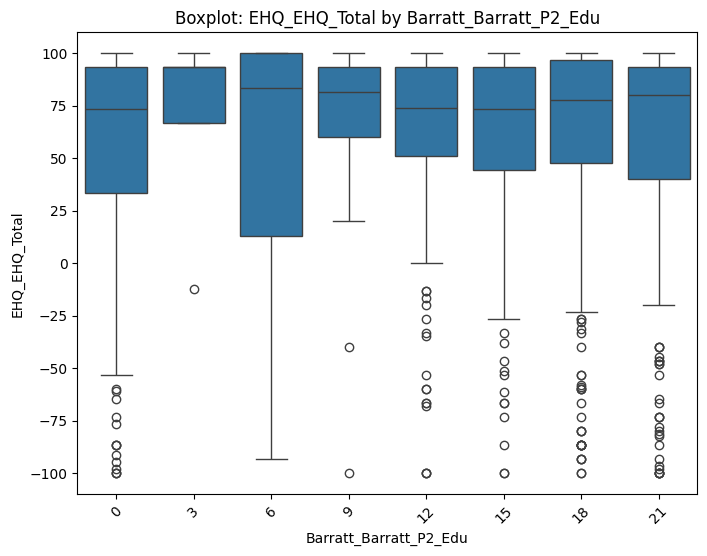


📊 Average EHQ_EHQ_Total per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     53.508687
3     68.230000
6     52.137857
9     69.400455
12    61.851358
15    58.701807
18    59.457741
21    58.938328
Name: EHQ_EHQ_Total, dtype: float64


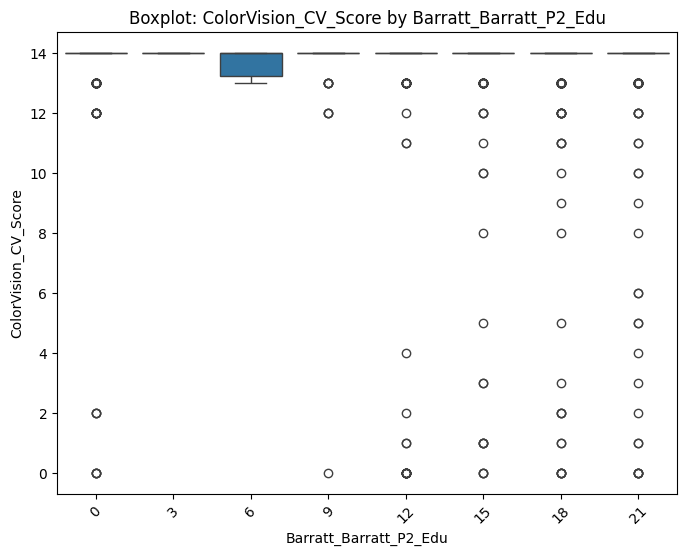


📊 Average ColorVision_CV_Score per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     13.323232
3     14.000000
6     13.714286
9     13.431818
12    12.604938
15    12.969880
18    13.252492
21    13.294118
Name: ColorVision_CV_Score, dtype: float64


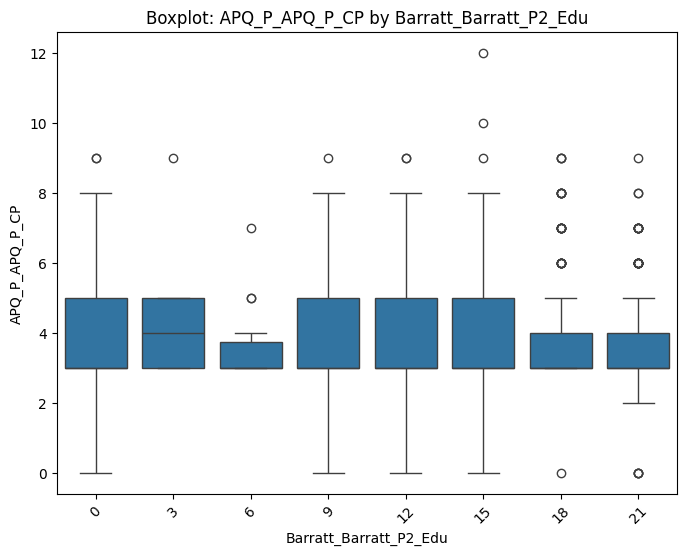


📊 Average APQ_P_APQ_P_CP per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     3.904040
3     4.800000
6     3.642857
9     4.113636
12    3.913580
15    3.945783
18    3.767442
21    3.513932
Name: APQ_P_APQ_P_CP, dtype: float64


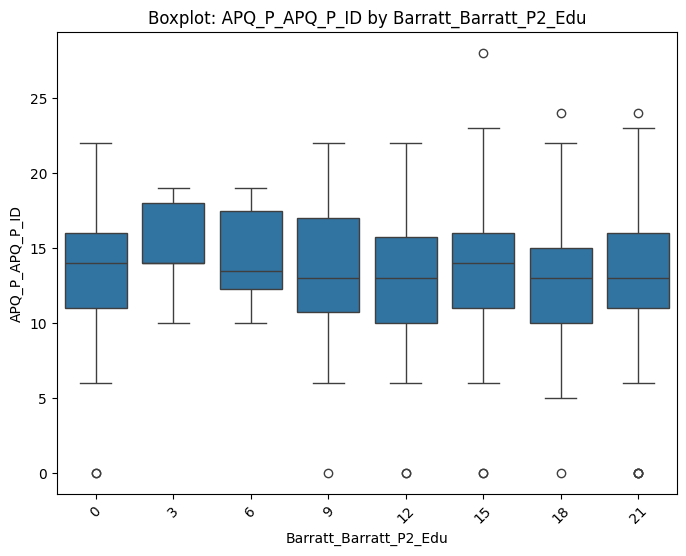


📊 Average APQ_P_APQ_P_ID per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     13.308081
3     15.000000
6     14.500000
9     13.431818
12    12.543210
15    13.668675
18    12.990033
21    13.321981
Name: APQ_P_APQ_P_ID, dtype: float64


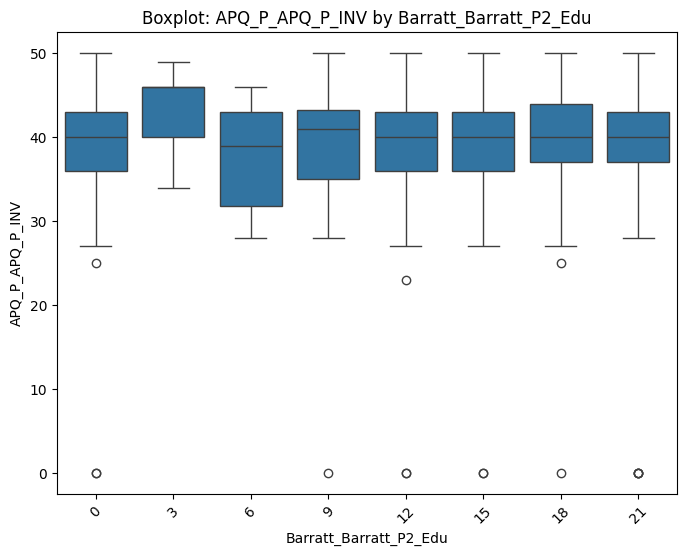


📊 Average APQ_P_APQ_P_INV per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     38.974747
3     43.000000
6     37.714286
9     38.772727
12    39.185185
15    39.000000
18    40.023256
21    39.399381
Name: APQ_P_APQ_P_INV, dtype: float64


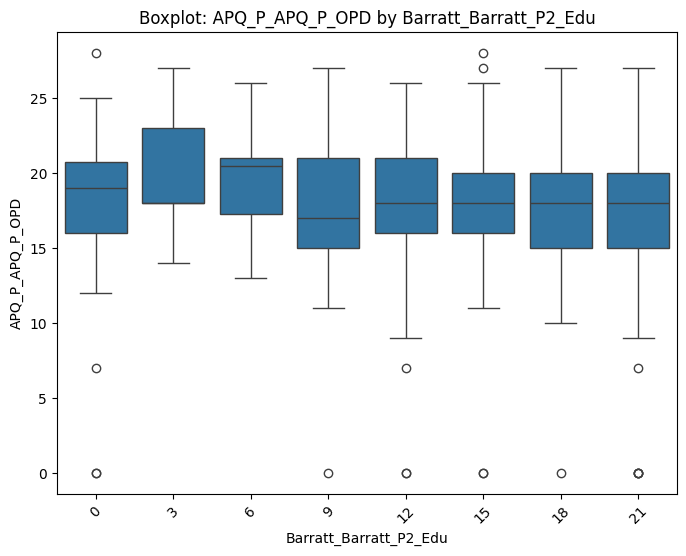


📊 Average APQ_P_APQ_P_OPD per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     18.237374
3     20.000000
6     19.571429
9     17.954545
12    17.969136
15    17.867470
18    17.654485
21    17.362229
Name: APQ_P_APQ_P_OPD, dtype: float64


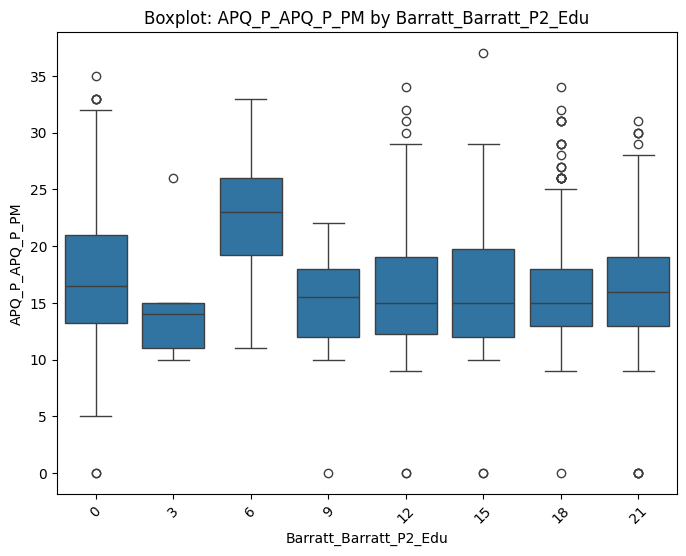


📊 Average APQ_P_APQ_P_PM per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     17.434343
3     15.200000
6     22.928571
9     15.159091
12    16.222222
15    15.746988
18    16.116279
21    16.334365
Name: APQ_P_APQ_P_PM, dtype: float64


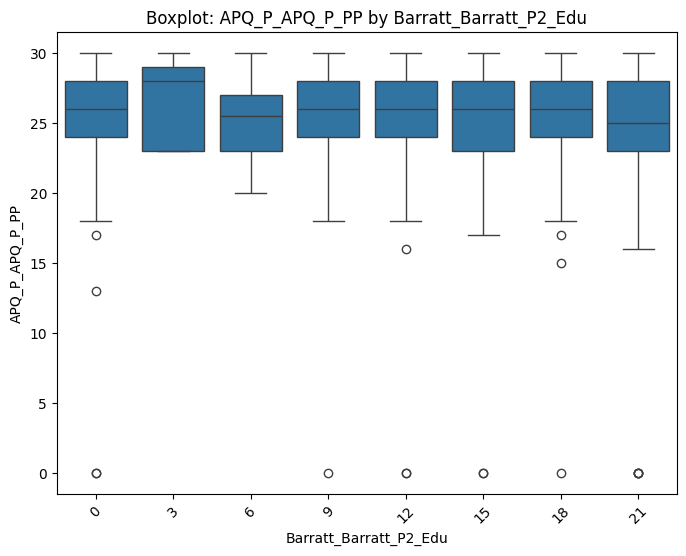


📊 Average APQ_P_APQ_P_PP per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     25.575758
3     26.600000
6     25.285714
9     25.340909
12    25.339506
15    24.921687
18    25.461794
21    24.928793
Name: APQ_P_APQ_P_PP, dtype: float64


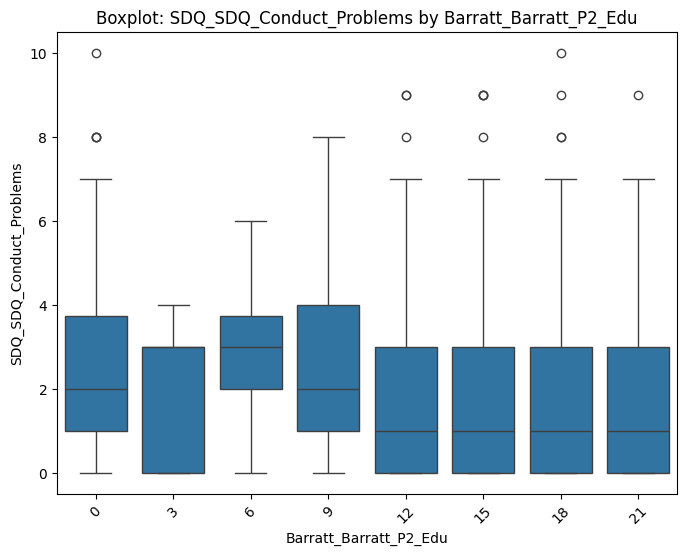


📊 Average SDQ_SDQ_Conduct_Problems per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     2.348485
3     2.000000
6     2.714286
9     2.477273
12    2.024691
15    2.132530
18    1.877076
21    1.947368
Name: SDQ_SDQ_Conduct_Problems, dtype: float64


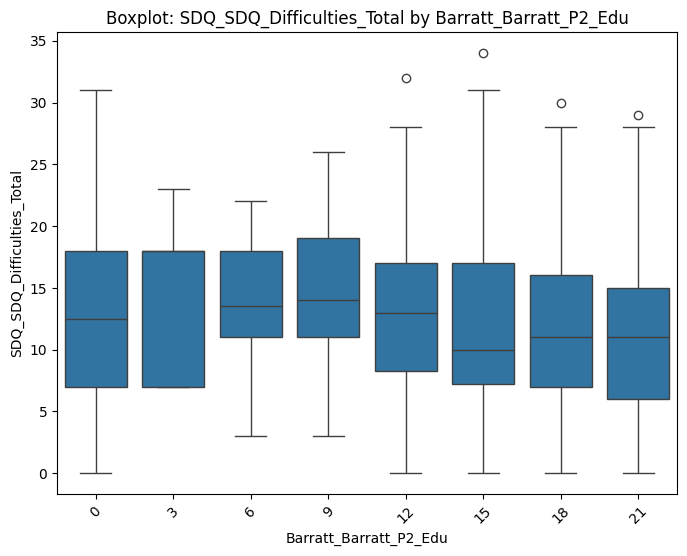


📊 Average SDQ_SDQ_Difficulties_Total per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     12.737374
3     14.600000
6     13.500000
9     14.454545
12    12.839506
15    12.222892
18    11.820598
21    11.201238
Name: SDQ_SDQ_Difficulties_Total, dtype: float64


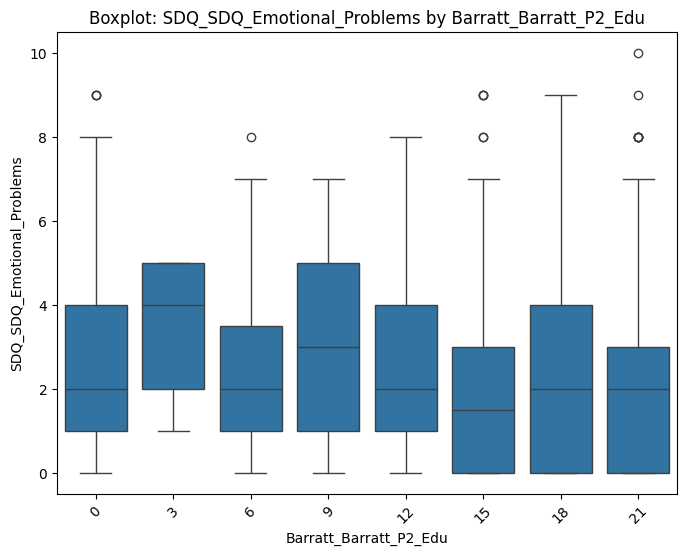


📊 Average SDQ_SDQ_Emotional_Problems per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     2.398990
3     3.400000
6     2.785714
9     3.090909
12    2.481481
15    2.144578
18    2.242525
21    2.164087
Name: SDQ_SDQ_Emotional_Problems, dtype: float64


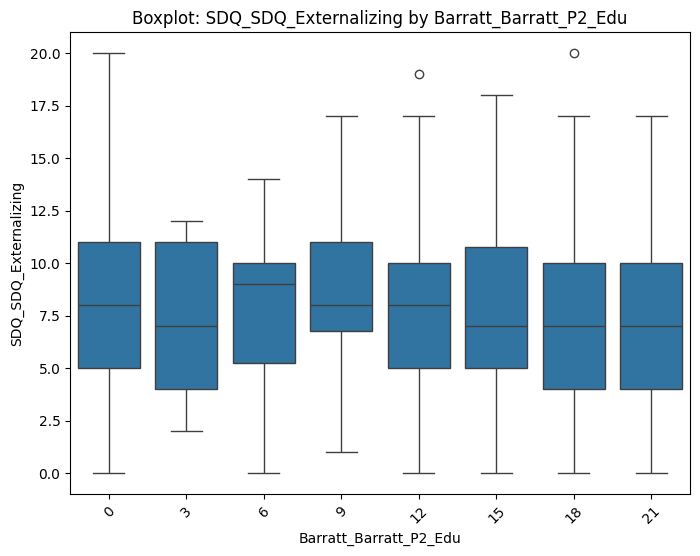


📊 Average SDQ_SDQ_Externalizing per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     7.909091
3     7.200000
6     7.928571
9     8.795455
12    7.820988
15    7.716867
18    7.428571
21    7.068111
Name: SDQ_SDQ_Externalizing, dtype: float64


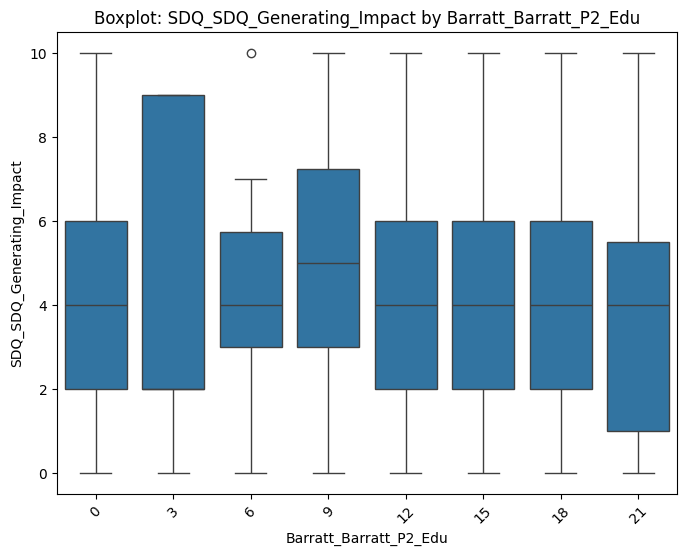


📊 Average SDQ_SDQ_Generating_Impact per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     4.121212
3     4.400000
6     4.357143
9     4.818182
12    4.290123
15    4.114458
18    4.186047
21    3.690402
Name: SDQ_SDQ_Generating_Impact, dtype: float64


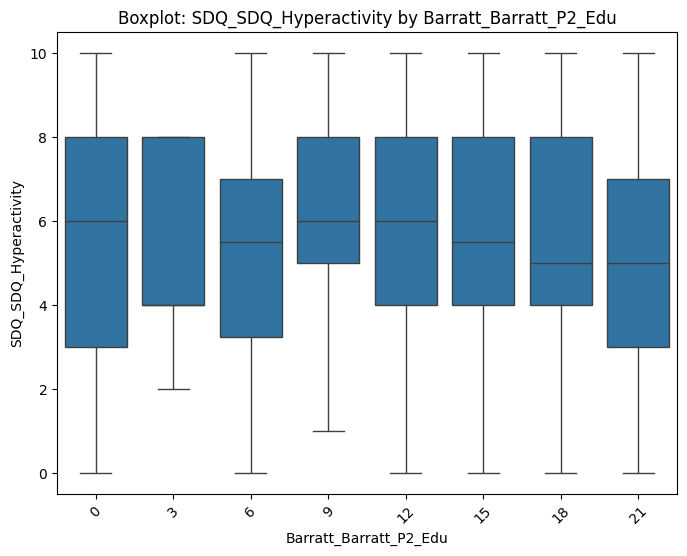


📊 Average SDQ_SDQ_Hyperactivity per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     5.560606
3     5.200000
6     5.214286
9     6.318182
12    5.796296
15    5.584337
18    5.551495
21    5.120743
Name: SDQ_SDQ_Hyperactivity, dtype: float64


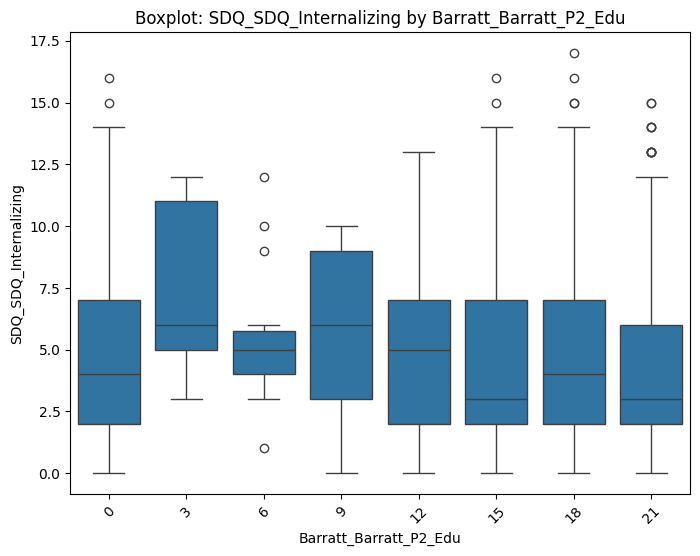


📊 Average SDQ_SDQ_Internalizing per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     4.828283
3     7.400000
6     5.571429
9     5.659091
12    5.018519
15    4.506024
18    4.392027
21    4.133127
Name: SDQ_SDQ_Internalizing, dtype: float64


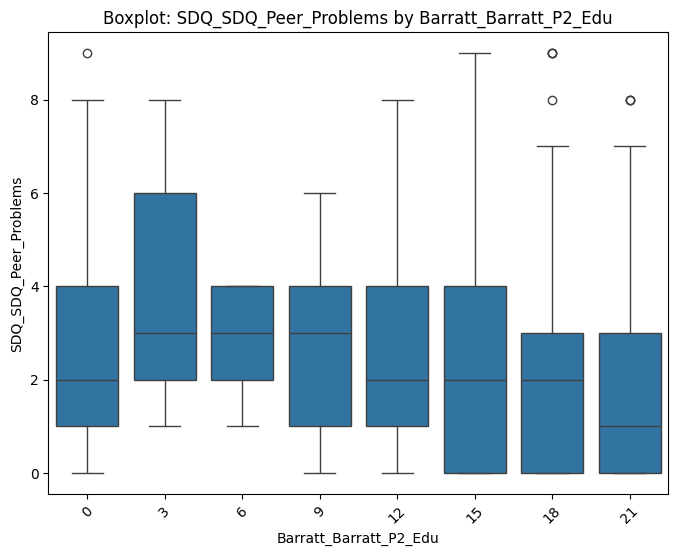


📊 Average SDQ_SDQ_Peer_Problems per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     2.429293
3     4.000000
6     2.785714
9     2.568182
12    2.537037
15    2.361446
18    2.149502
21    1.969040
Name: SDQ_SDQ_Peer_Problems, dtype: float64


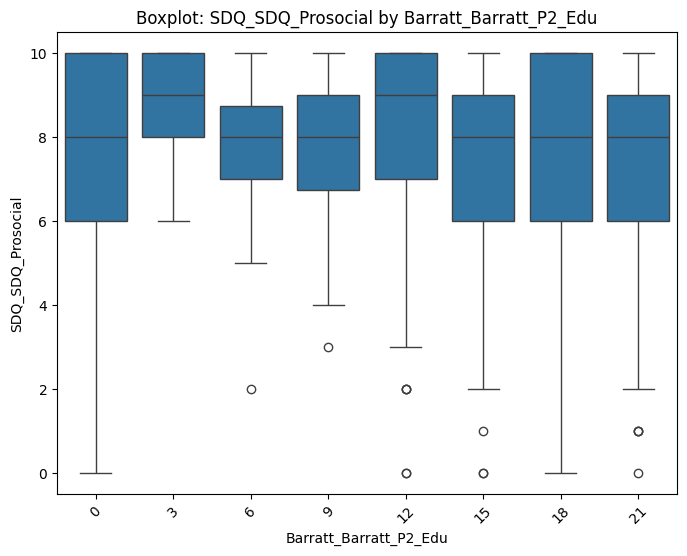


📊 Average SDQ_SDQ_Prosocial per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     7.696970
3     8.600000
6     7.500000
9     7.750000
12    7.796296
15    7.566265
18    7.654485
21    7.690402
Name: SDQ_SDQ_Prosocial, dtype: float64


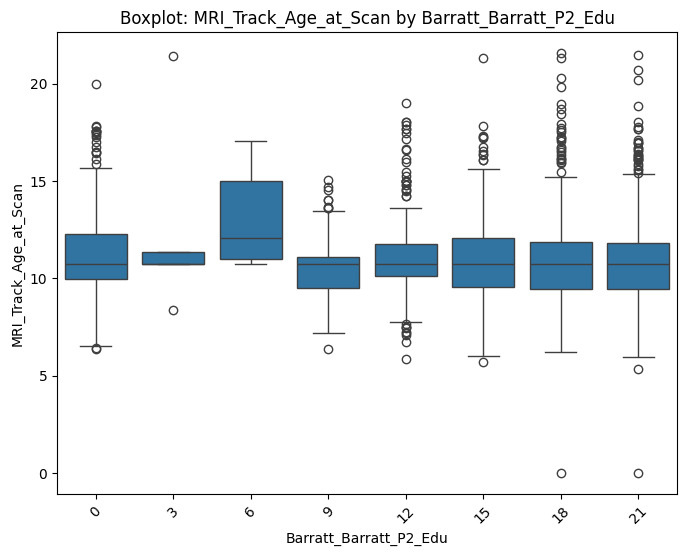


📊 Average MRI_Track_Age_at_Scan per Barratt_Barratt_P2_Edu:
Barratt_Barratt_P2_Edu
0     11.256449
3     12.528222
6     13.189547
9     10.603060
12    11.226241
15    11.025963
18    11.089564
21    10.926181
Name: MRI_Track_Age_at_Scan, dtype: float64


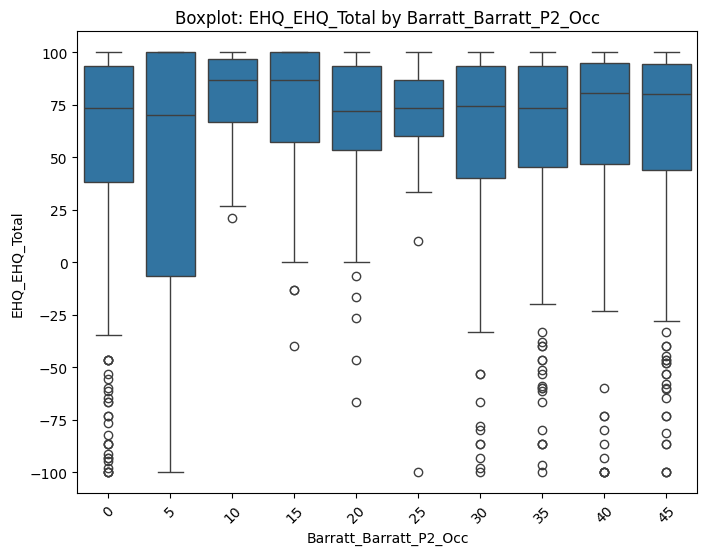


📊 Average EHQ_EHQ_Total per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     54.749512
5     41.958158
10    76.738919
15    72.939070
20    60.145122
25    65.607200
30    58.083557
35    58.685795
40    56.839828
45    59.415690
Name: EHQ_EHQ_Total, dtype: float64


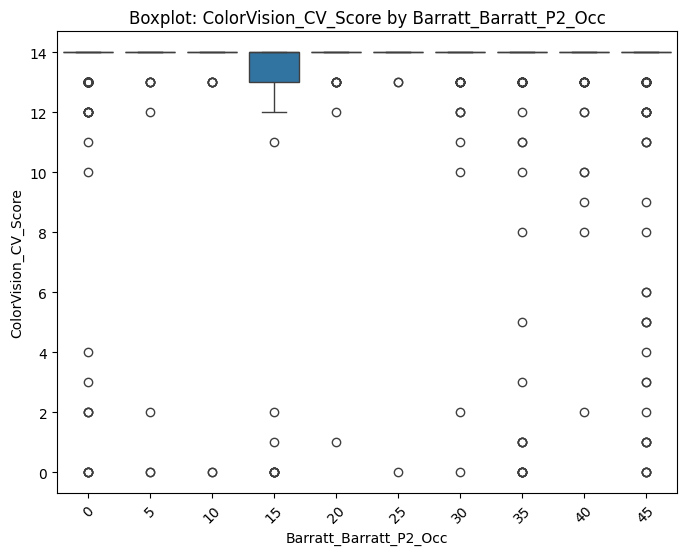


📊 Average ColorVision_CV_Score per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     13.320557
5     12.763158
10    13.108108
15    12.337209
20    13.463415
25    13.360000
30    13.664430
35    12.938462
40    13.594828
45    12.941423
Name: ColorVision_CV_Score, dtype: float64


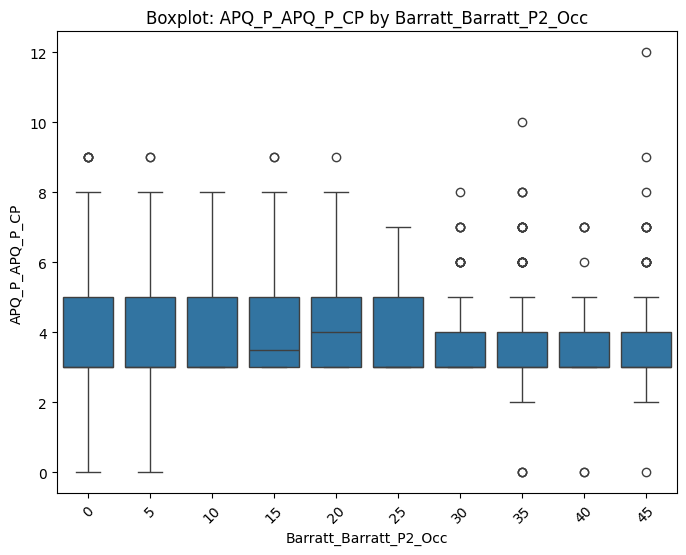


📊 Average APQ_P_APQ_P_CP per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     3.881533
5     4.236842
10    4.000000
15    4.011628
20    4.390244
25    4.000000
30    3.684564
35    3.738462
40    3.534483
45    3.560669
Name: APQ_P_APQ_P_CP, dtype: float64


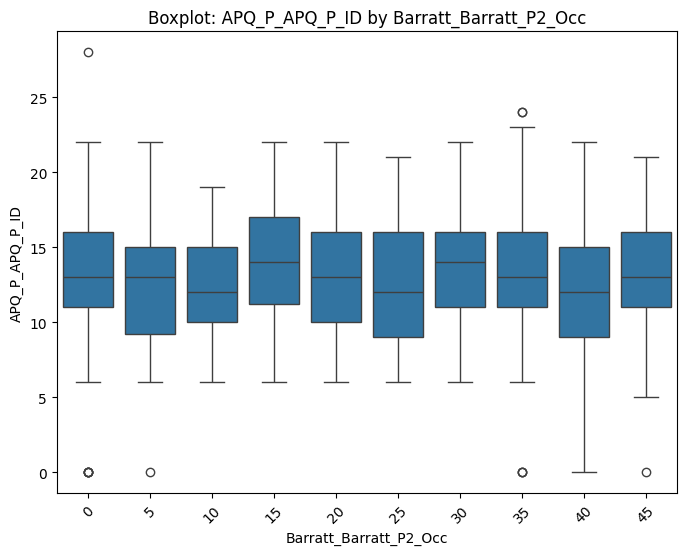


📊 Average APQ_P_APQ_P_ID per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     13.125436
5     12.657895
10    12.324324
15    14.023256
20    13.048780
25    12.760000
30    13.610738
35    13.451282
40    12.198276
45    13.338912
Name: APQ_P_APQ_P_ID, dtype: float64


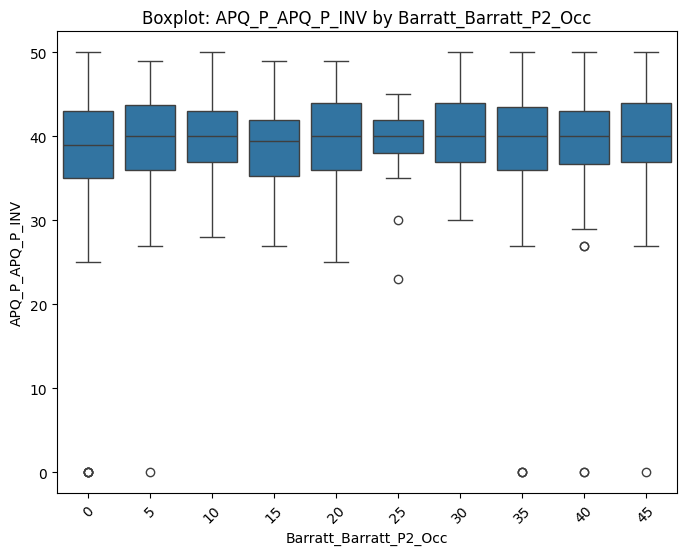


📊 Average APQ_P_APQ_P_INV per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     38.581882
5     38.605263
10    40.027027
15    39.279070
20    39.585366
25    39.280000
30    40.315436
35    39.276923
40    38.939655
45    40.058577
Name: APQ_P_APQ_P_INV, dtype: float64


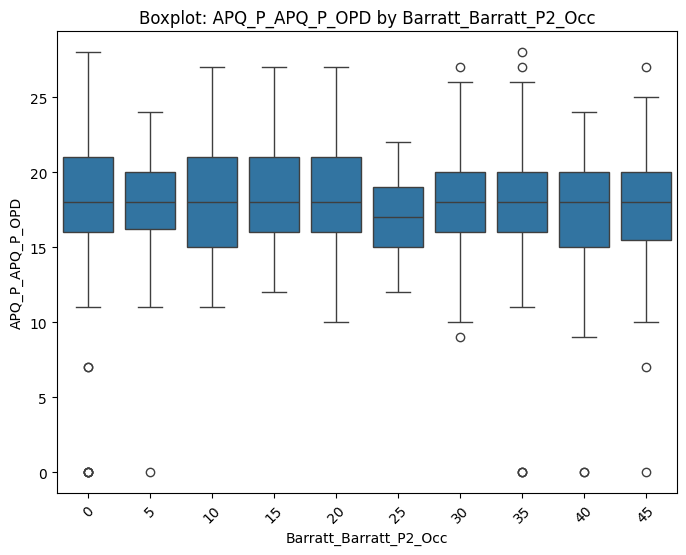


📊 Average APQ_P_APQ_P_OPD per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     17.864111
5     17.894737
10    17.972973
15    18.523256
20    18.560976
25    16.920000
30    18.120805
35    17.712821
40    17.146552
45    17.497908
Name: APQ_P_APQ_P_OPD, dtype: float64


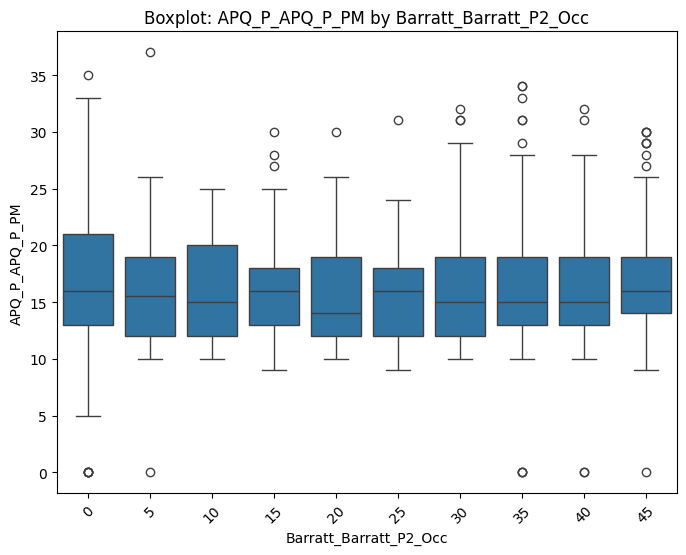


📊 Average APQ_P_APQ_P_PM per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     17.132404
5     16.184211
10    15.972973
15    15.988372
20    15.658537
25    15.880000
30    16.181208
35    16.158974
40    16.034483
45    16.426778
Name: APQ_P_APQ_P_PM, dtype: float64


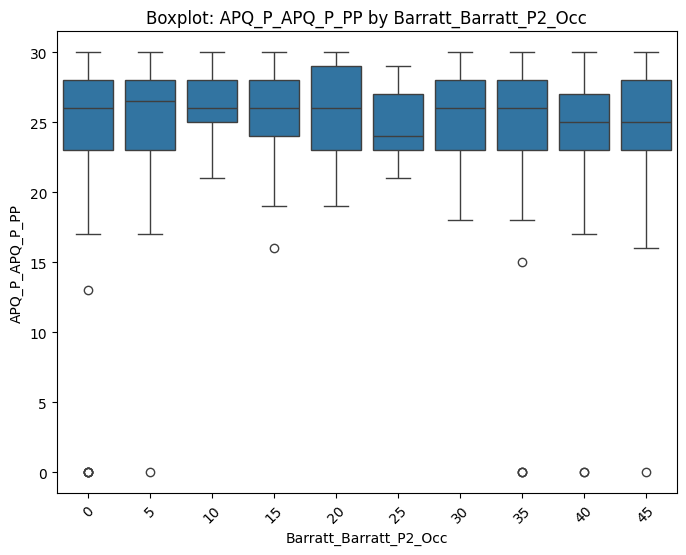


📊 Average APQ_P_APQ_P_PP per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     25.149826
5     24.842105
10    26.108108
15    25.697674
20    25.829268
25    24.880000
30    25.677852
35    24.979487
40    24.603448
45    25.330544
Name: APQ_P_APQ_P_PP, dtype: float64


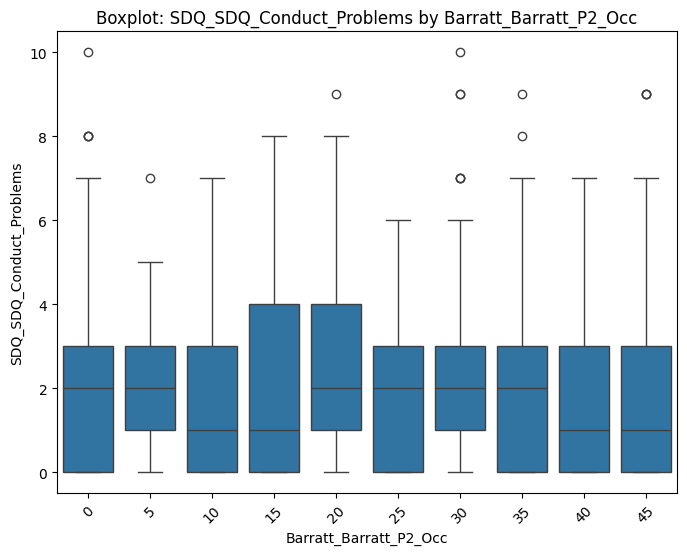


📊 Average SDQ_SDQ_Conduct_Problems per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     2.212544
5     2.184211
10    2.054054
15    2.069767
20    2.707317
25    1.920000
30    2.147651
35    2.035897
40    1.775862
45    1.857741
Name: SDQ_SDQ_Conduct_Problems, dtype: float64


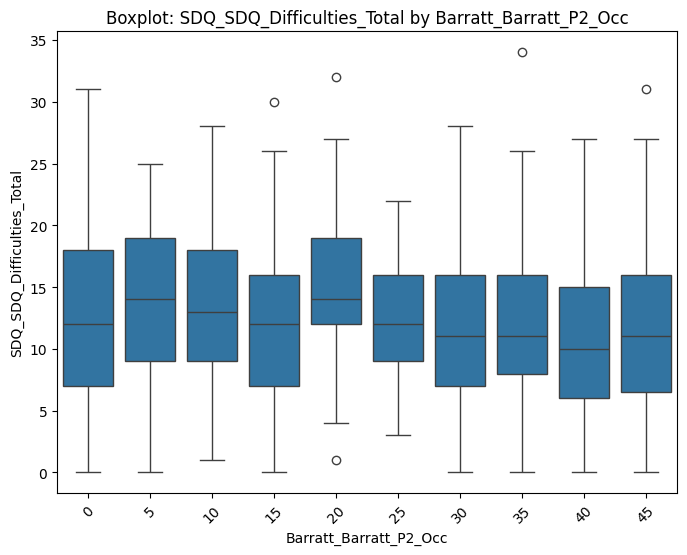


📊 Average SDQ_SDQ_Difficulties_Total per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     12.651568
5     13.815789
10    13.513514
15    12.267442
20    15.146341
25    12.280000
30    11.805369
35    12.035897
40    10.827586
45    11.313808
Name: SDQ_SDQ_Difficulties_Total, dtype: float64


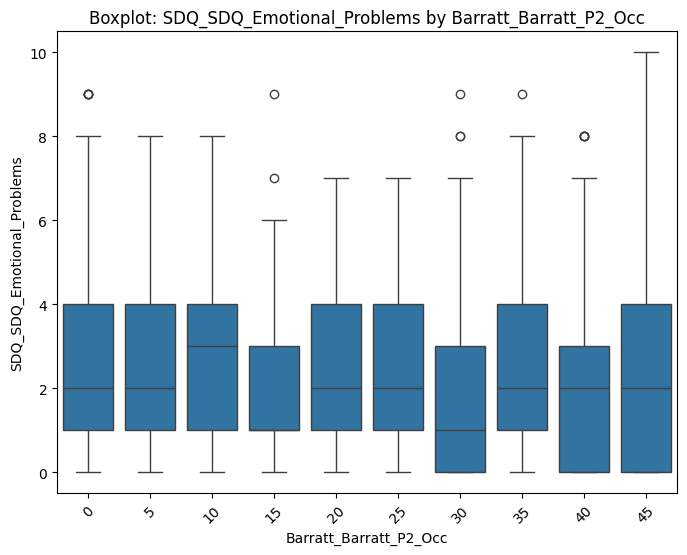


📊 Average SDQ_SDQ_Emotional_Problems per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     2.501742
5     2.842105
10    2.891892
15    2.174419
20    2.878049
25    2.560000
30    1.912752
35    2.410256
40    1.913793
45    2.175732
Name: SDQ_SDQ_Emotional_Problems, dtype: float64


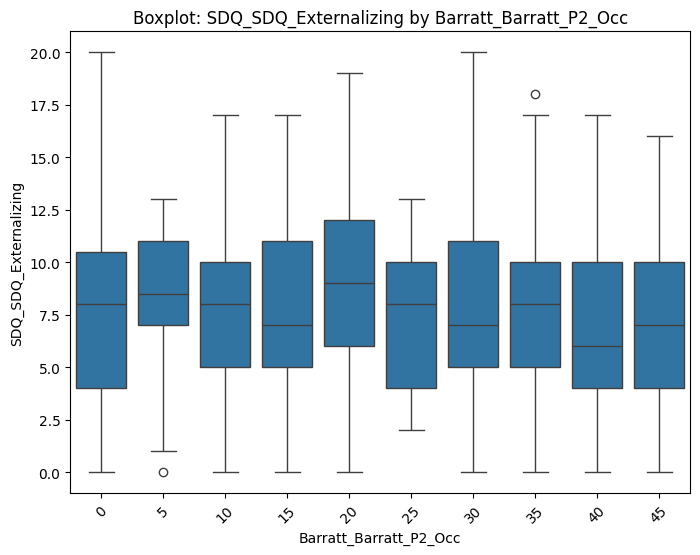


📊 Average SDQ_SDQ_Externalizing per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     7.735192
5     8.105263
10    7.756757
15    7.523256
20    9.048780
25    7.520000
30    7.758389
35    7.492308
40    7.051724
45    7.158996
Name: SDQ_SDQ_Externalizing, dtype: float64


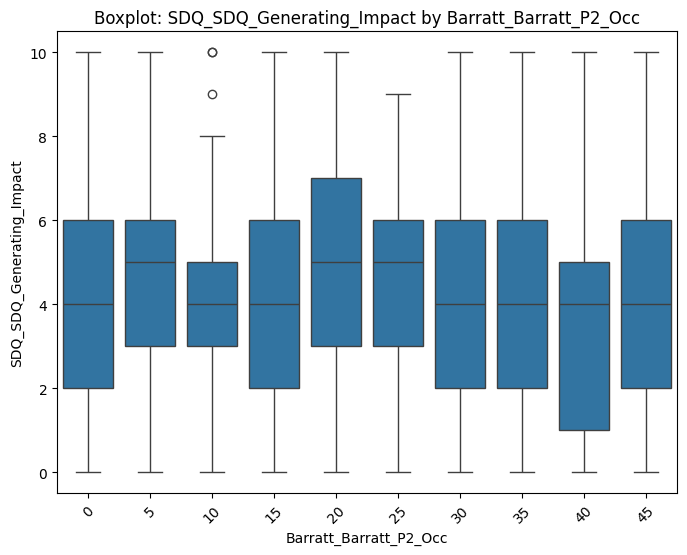


📊 Average SDQ_SDQ_Generating_Impact per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     4.062718
5     4.631579
10    4.054054
15    3.976744
20    5.000000
25    4.520000
30    4.140940
35    4.107692
40    3.750000
45    3.916318
Name: SDQ_SDQ_Generating_Impact, dtype: float64


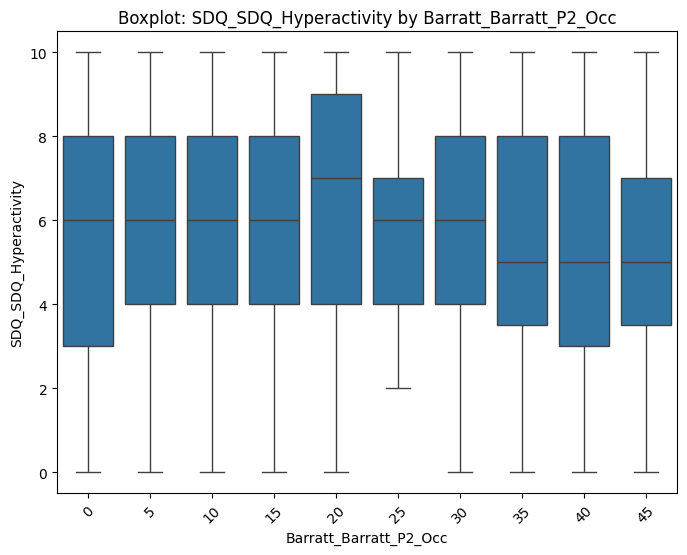


📊 Average SDQ_SDQ_Hyperactivity per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     5.522648
5     5.921053
10    5.702703
15    5.453488
20    6.341463
25    5.600000
30    5.610738
35    5.456410
40    5.275862
45    5.301255
Name: SDQ_SDQ_Hyperactivity, dtype: float64


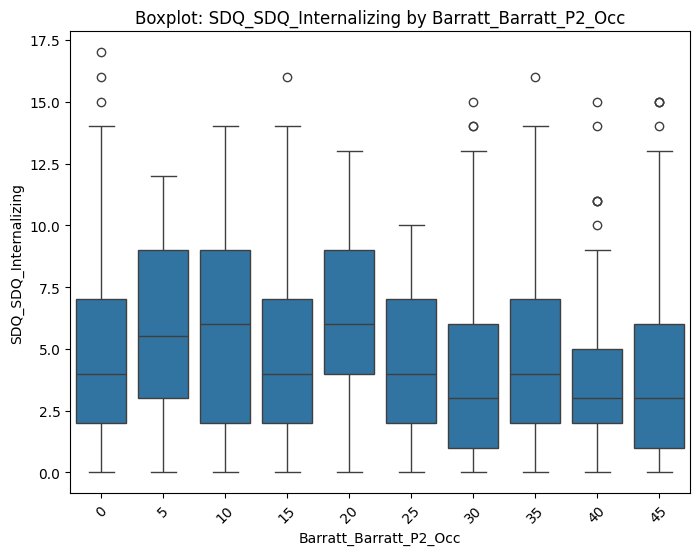


📊 Average SDQ_SDQ_Internalizing per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     4.916376
5     5.710526
10    5.756757
15    4.744186
20    6.097561
25    4.760000
30    4.046980
35    4.543590
40    3.775862
45    4.154812
Name: SDQ_SDQ_Internalizing, dtype: float64


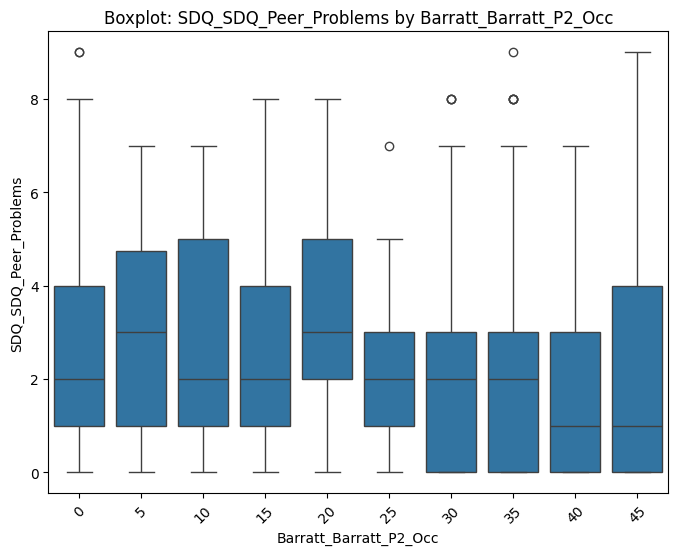


📊 Average SDQ_SDQ_Peer_Problems per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     2.414634
5     2.868421
10    2.864865
15    2.569767
20    3.219512
25    2.200000
30    2.134228
35    2.133333
40    1.862069
45    1.979079
Name: SDQ_SDQ_Peer_Problems, dtype: float64


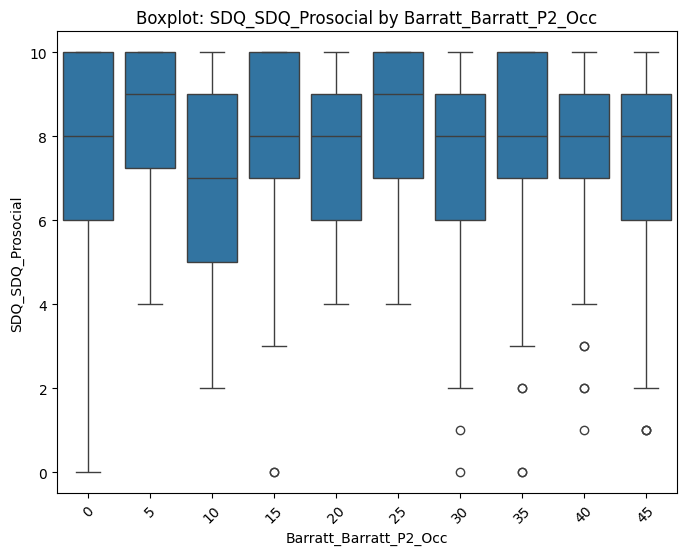


📊 Average SDQ_SDQ_Prosocial per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     7.675958
5     8.289474
10    6.783784
15    7.732558
20    7.829268
25    8.360000
30    7.624161
35    7.758974
40    7.827586
45    7.527197
Name: SDQ_SDQ_Prosocial, dtype: float64


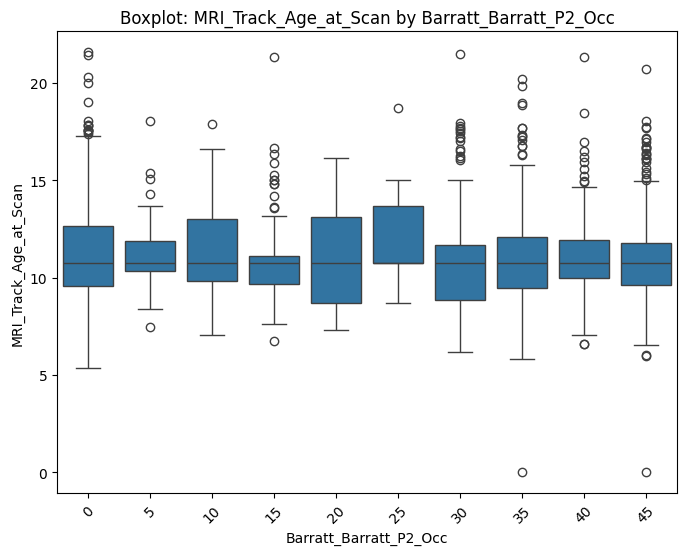


📊 Average MRI_Track_Age_at_Scan per Barratt_Barratt_P2_Occ:
Barratt_Barratt_P2_Occ
0     11.349583
5     11.239129
10    11.286148
15    10.910830
20    10.872247
25    11.675847
30    10.918991
35    11.044071
40    11.059903
45    10.950694
Name: MRI_Track_Age_at_Scan, dtype: float64


In [49]:
# Merge metadata_a and metadata_b on participant_id
merged_df = metadata_a.merge(metadata_b, on='participant_id')

# Boxplots for all categorical vs. numerical pairs
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(8,6))
        sns.boxplot(x=merged_df[cat_col], y=merged_df[num_col])
        plt.title(f"Boxplot: {num_col} by {cat_col}")
        plt.xticks(rotation=45)
        plt.show()

        # Groupby statistics
        print(f"\n📊 Average {num_col} per {cat_col}:")
        print(merged_df.groupby(cat_col)[num_col].mean())


3️⃣ Categorical vs. Categorical (Cross-tabulation & Stacked Bar Charts)


📌 Cross-tabulation: Basic_Demos_Enroll_Year vs Basic_Demos_Study_Site
Basic_Demos_Study_Site     1   2    3    4
Basic_Demos_Enroll_Year                   
2015                      35   1    0    0
2016                     170  10   11    0
2017                     176   0   78    0
2018                     169   0  245    1
2019                     102   0   96  114
2020                       0   0    0    5


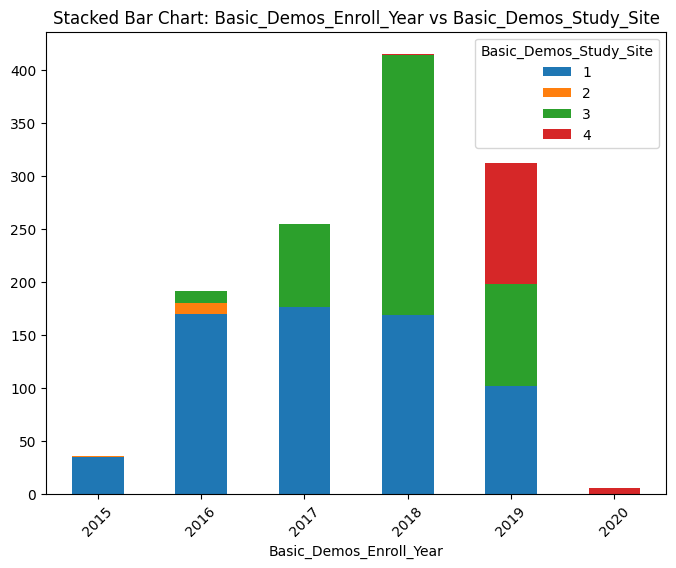


📌 Cross-tabulation: Basic_Demos_Enroll_Year vs PreInt_Demos_Fam_Child_Ethnicity
PreInt_Demos_Fam_Child_Ethnicity  0.0  1.0  2.0  3.0
Basic_Demos_Enroll_Year                             
2015                               24   10    2    0
2016                              130   33   17   11
2017                              153   75   19    7
2018                              294   92   18   11
2019                              204   85   21    2
2020                                4    1    0    0


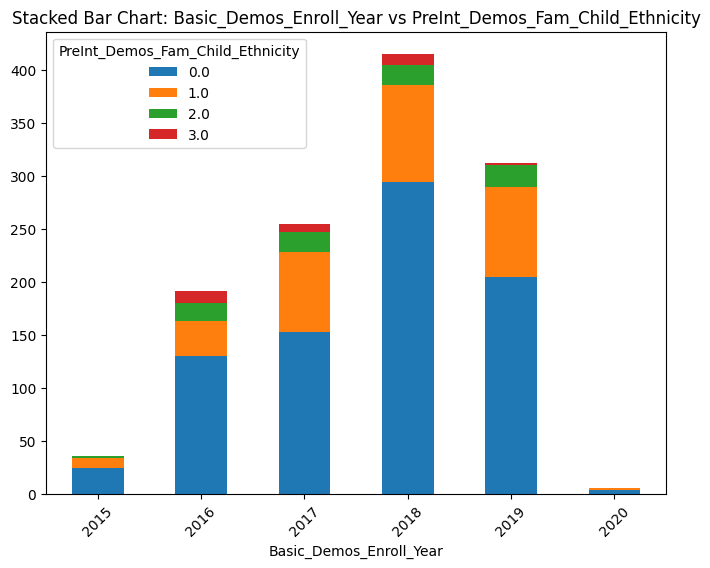


📌 Cross-tabulation: Basic_Demos_Enroll_Year vs PreInt_Demos_Fam_Child_Race
PreInt_Demos_Fam_Child_Race   0   1   2   3   4   7   8   9   10  11
Basic_Demos_Enroll_Year                                             
2015                          21   7   3   0   0   0   5   0   0   0
2016                          97  30  15   8   5   0  25   6   5   0
2017                         135  31  33   5   0   0  45   2   3   0
2018                         216  65  39  10   2   2  71   9   1   0
2019                         154  48  37   7   3   0  49   6   2   6
2020                           4   0   1   0   0   0   0   0   0   0


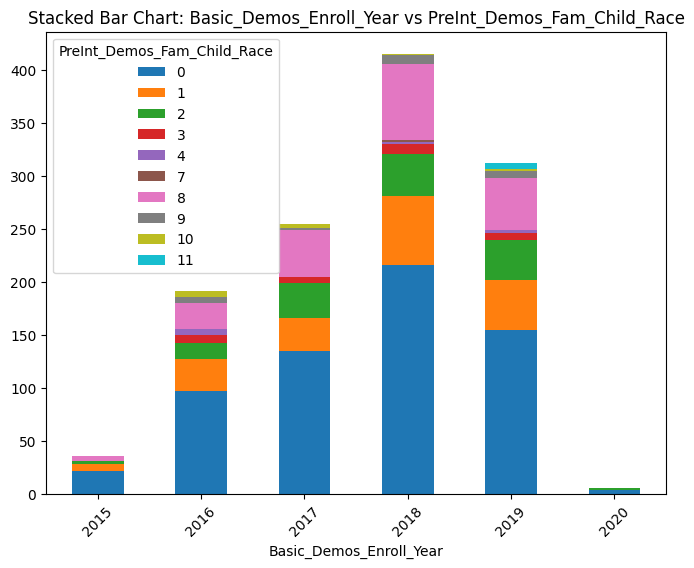


📌 Cross-tabulation: Basic_Demos_Enroll_Year vs MRI_Track_Scan_Location
MRI_Track_Scan_Location  0    1    2    3   4
Basic_Demos_Enroll_Year                      
2015                     0   36    0    0   0
2016                     3  143   45    0   0
2017                     0    0  209   44   1
2018                     0    0  171  244   0
2019                     0    0  107  173  32
2020                     0    0    0    2   3


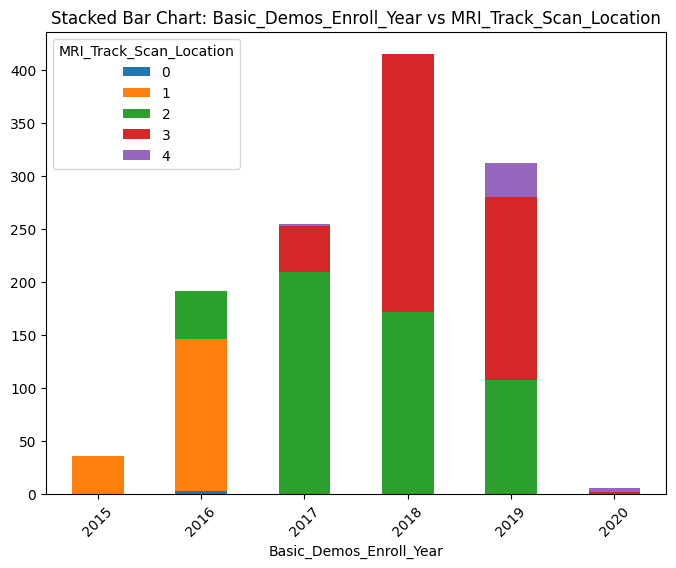


📌 Cross-tabulation: Basic_Demos_Enroll_Year vs Barratt_Barratt_P1_Edu
Barratt_Barratt_P1_Edu   0   3   6   9   12  15   18   21
Basic_Demos_Enroll_Year                                  
2015                      0   0   1   3  10   3    9   10
2016                      2   1   4   6  25  32   61   60
2017                      4   0   3  10  23  33   88   93
2018                      7   1   2   5  21  47  153  179
2019                      2   3   5   4  18  46  110  124
2020                      0   0   0   0   0   1    0    4


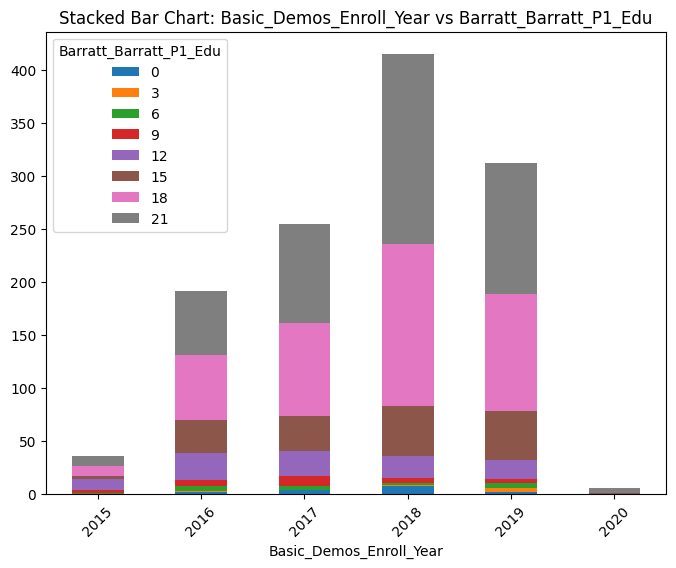


📌 Cross-tabulation: Basic_Demos_Enroll_Year vs Barratt_Barratt_P1_Occ
Barratt_Barratt_P1_Occ   0   5   10  15  20  25  30  35  40  45
Basic_Demos_Enroll_Year                                        
2015                      2   7   1   1   5   6   0   7   3   4
2016                     61   3   1   5   5  11  16  50  19  20
2017                     74   4   1  12  10  15  35  35  36  32
2018                     98   7   3   7   5  24  62  74  64  71
2019                     82  10   0  10   6  23  40  52  31  58
2020                      0   0   0   0   0   0   1   1   1   2


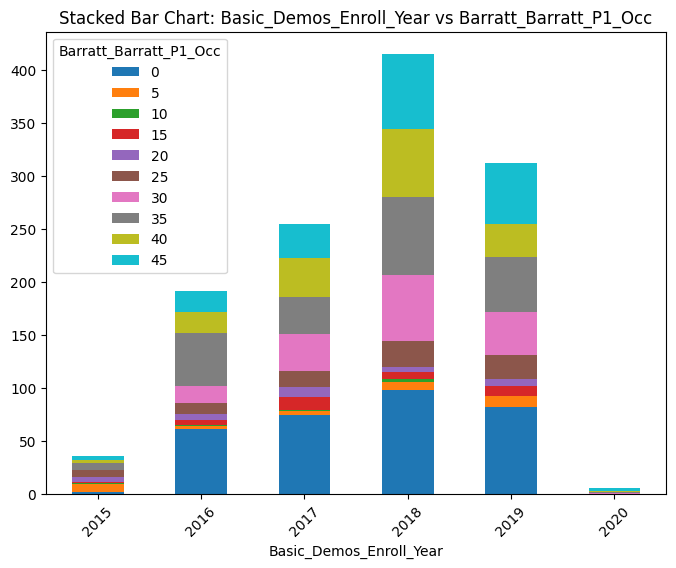


📌 Cross-tabulation: Basic_Demos_Enroll_Year vs Barratt_Barratt_P2_Edu
Barratt_Barratt_P2_Edu   0   3   6   9   12  15   18   21
Basic_Demos_Enroll_Year                                  
2015                      5   0   1   4  14   2    6    4
2016                     43   2   2   3  37  19   41   44
2017                     41   0   3  12  42  44   60   52
2018                     57   1   5  17  38  58  112  127
2019                     51   2   3   8  31  43   80   94
2020                      1   0   0   0   0   0    2    2


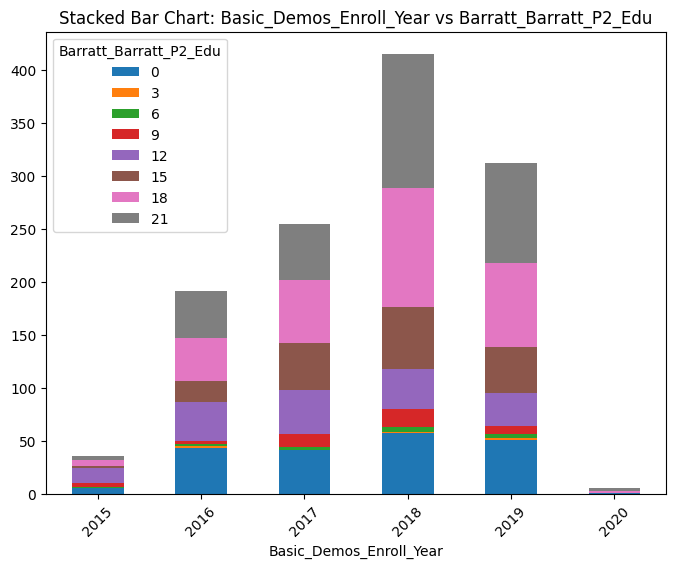


📌 Cross-tabulation: Basic_Demos_Enroll_Year vs Barratt_Barratt_P2_Occ
Barratt_Barratt_P2_Occ   0   5   10  15  20  25  30  35  40  45
Basic_Demos_Enroll_Year                                        
2015                      5   4   6   6   3   0   1   7   1   3
2016                     56   8   6  15  10   5  21  35  10  25
2017                     65   4  10  24   7   4  29  36  28  47
2018                     81  10  10  22  15   8  60  63  49  97
2019                     79  12   5  19   6   8  38  52  27  66
2020                      1   0   0   0   0   0   0   2   1   1


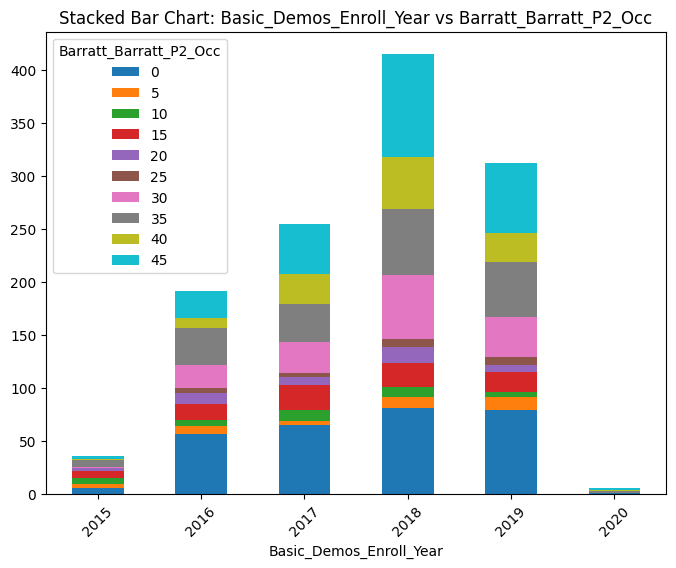


📌 Cross-tabulation: Basic_Demos_Study_Site vs PreInt_Demos_Fam_Child_Ethnicity
PreInt_Demos_Fam_Child_Ethnicity  0.0  1.0  2.0  3.0
Basic_Demos_Study_Site                              
1                                 424  160   51   17
2                                  10    1    0    0
3                                 301   98   19   12
4                                  74   37    7    2


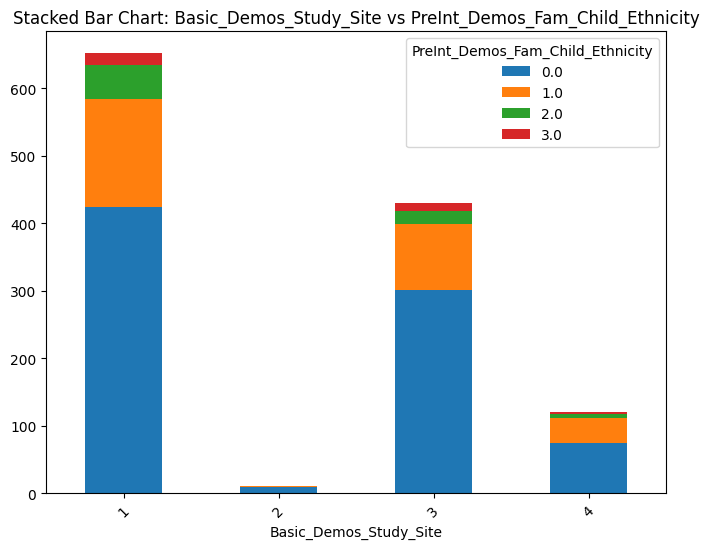


📌 Cross-tabulation: Basic_Demos_Study_Site vs PreInt_Demos_Fam_Child_Race
PreInt_Demos_Fam_Child_Race   0   1   2   3   4   7    8   9   10  11
Basic_Demos_Study_Site                                               
1                            361  81  70  13   6   1  101  11   6   2
2                              3   7   1   0   0   0    0   0   0   0
3                            206  70  44  15   3   1   79   8   4   0
4                             57  23  13   2   1   0   15   4   1   4


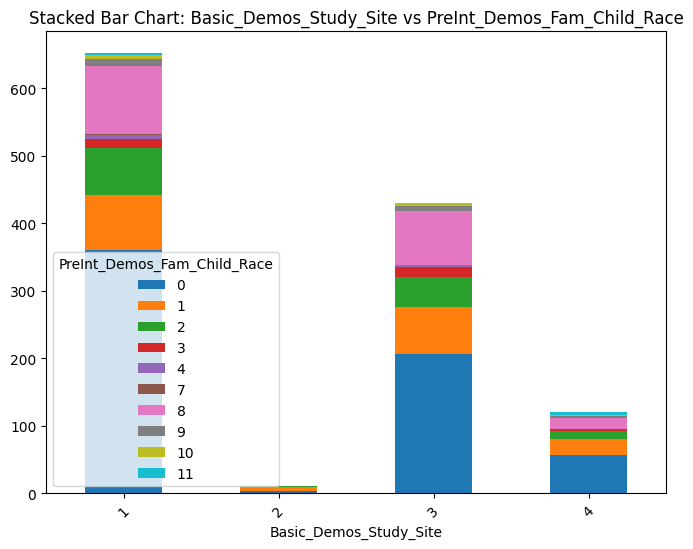


📌 Cross-tabulation: Basic_Demos_Study_Site vs MRI_Track_Scan_Location
MRI_Track_Scan_Location  0    1    2    3   4
Basic_Demos_Study_Site                       
1                        3  161  408   79   1
2                        0   11    0    0   0
3                        0    7  121  301   1
4                        0    0    3   83  34


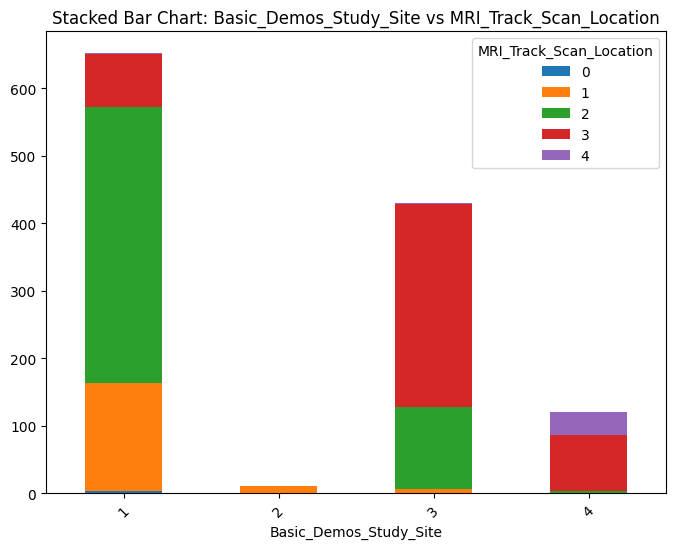


📌 Cross-tabulation: Basic_Demos_Study_Site vs Barratt_Barratt_P1_Edu
Barratt_Barratt_P1_Edu  0   3   6   9   12   15   18   21
Basic_Demos_Study_Site                                   
1                        6   3  13  26  66  103  209  226
2                        0   0   0   0   3    1    3    4
3                        8   1   1   2  23   46  165  184
4                        1   1   1   0   5   12   44   56


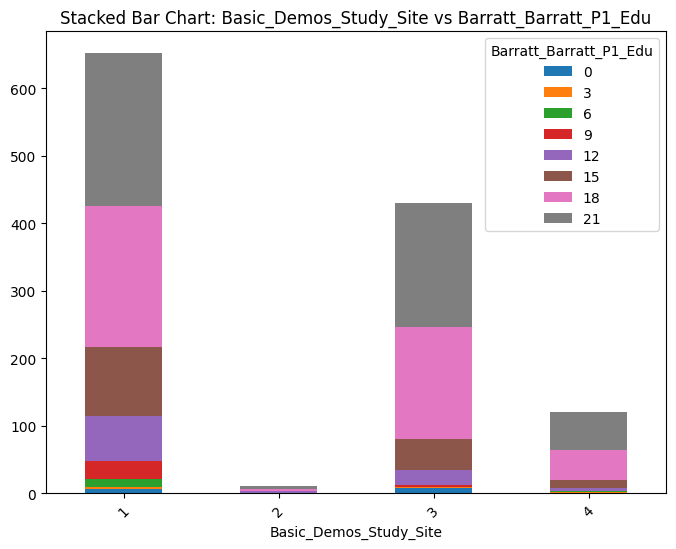


📌 Cross-tabulation: Basic_Demos_Study_Site vs Barratt_Barratt_P1_Occ
Barratt_Barratt_P1_Occ   0   5   10  15  20  25  30   35  40  45
Basic_Demos_Study_Site                                          
1                       184  19   4  21  21  42  58  136  89  78
2                         1   0   0   0   0   1   1    6   1   1
3                       104   9   2  12   8  27  78   55  52  83
4                        28   3   0   2   2   9  17   22  12  25


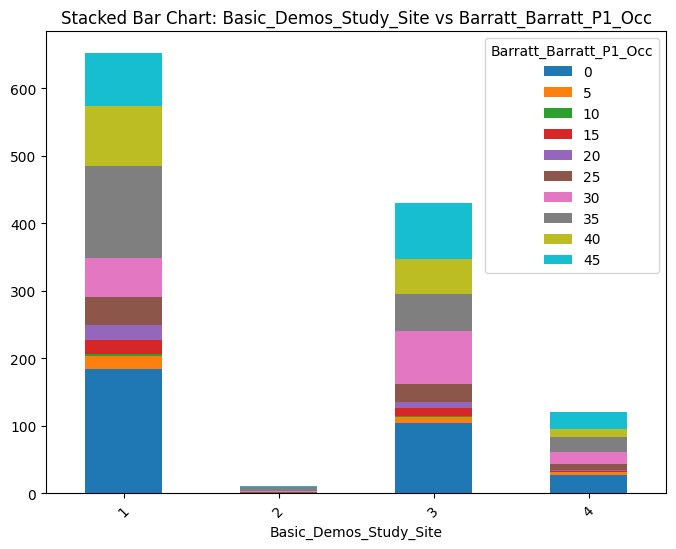


📌 Cross-tabulation: Basic_Demos_Study_Site vs Barratt_Barratt_P2_Edu
Barratt_Barratt_P2_Edu   0   3   6   9    12  15   18   21
Basic_Demos_Study_Site                                    
1                       102   2  10  33  108  96  148  153
2                         1   0   0   0    3   0    5    2
3                        75   1   2   9   40  58  117  128
4                        20   2   2   2   11  12   31   40


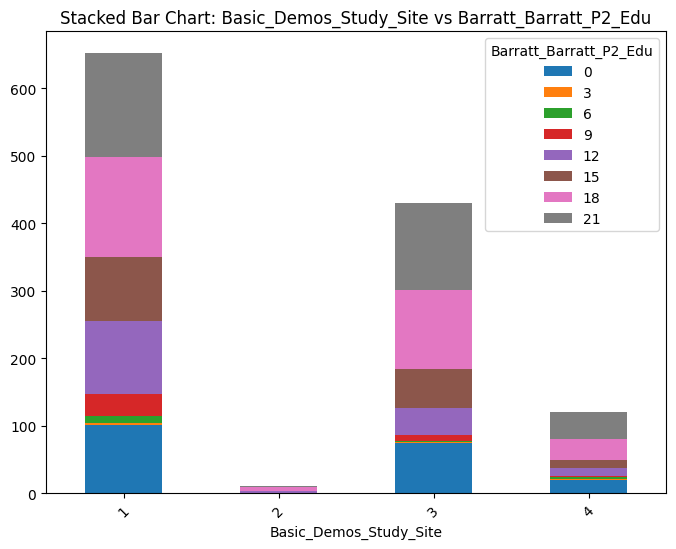


📌 Cross-tabulation: Basic_Demos_Study_Site vs Barratt_Barratt_P2_Occ
Barratt_Barratt_P2_Occ   0   5   10  15  20  25  30   35  40   45
Basic_Demos_Study_Site                                           
1                       152  21  28  61  26  13  74  108  69  100
2                         3   0   1   0   1   1   1    1   1    2
3                       105  12   5  21  11   6  56   70  37  107
4                        27   5   3   4   3   5  18   16   9   30


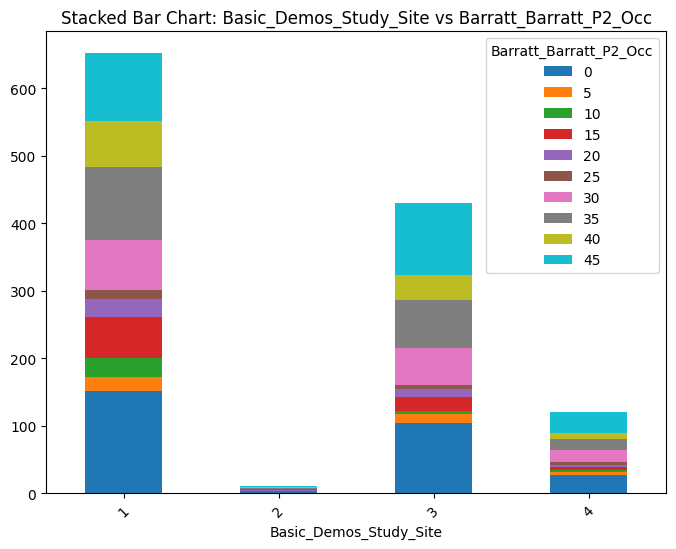


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Ethnicity vs PreInt_Demos_Fam_Child_Race
PreInt_Demos_Fam_Child_Race        0    1    2   3   4   7   8   9   10  11
PreInt_Demos_Fam_Child_Ethnicity                                           
0.0                               534  140    1  23   8   0  92  11   0   0
1.0                                50   29  125   2   0   0  80   6   1   3
2.0                                30    7    2   2   1   2  19   5   6   3
3.0                                13    5    0   3   1   0   4   1   4   0


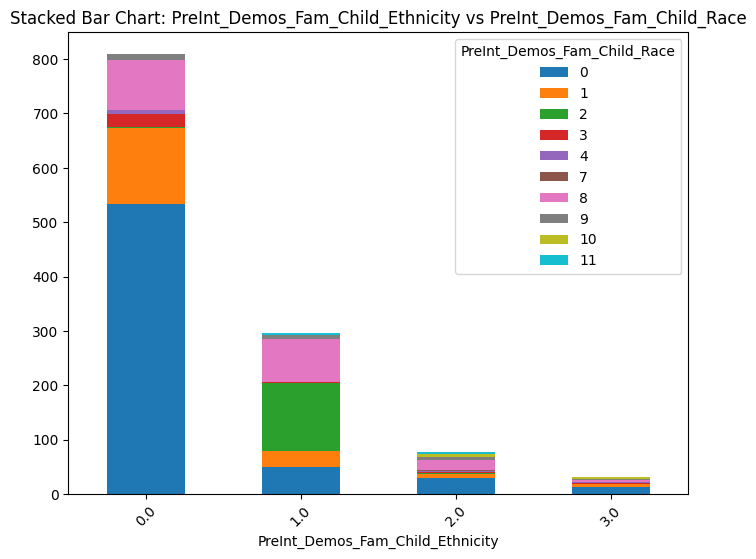


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Ethnicity vs MRI_Track_Scan_Location
MRI_Track_Scan_Location           0    1    2    3   4
PreInt_Demos_Fam_Child_Ethnicity                      
0.0                               3  122  342  319  23
1.0                               0   35  138  110  13
2.0                               0   12   39   26   0
3.0                               0   10   13    8   0


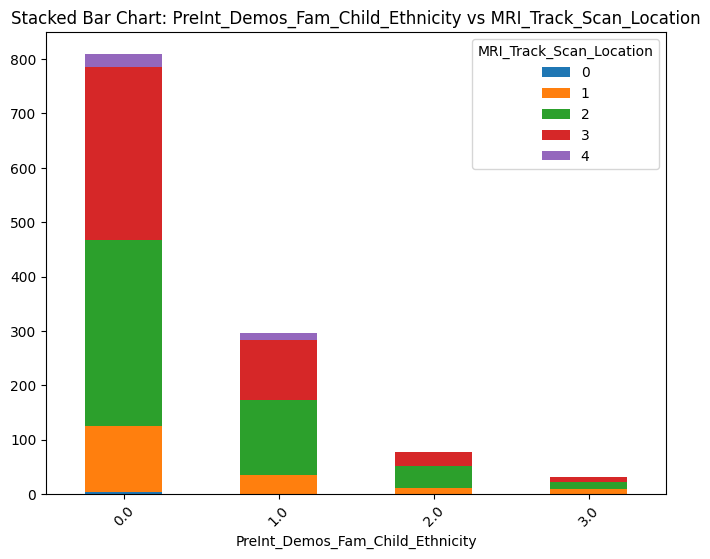


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Ethnicity vs Barratt_Barratt_P1_Edu
Barratt_Barratt_P1_Edu            0   3   6   9   12   15   18   21
PreInt_Demos_Fam_Child_Ethnicity                                   
0.0                                9   2   8   9  46  100  294  341
1.0                                4   2   6  12  37   54   90   91
2.0                                2   1   0   5  11    6   25   27
3.0                                0   0   1   2   3    2   12   11


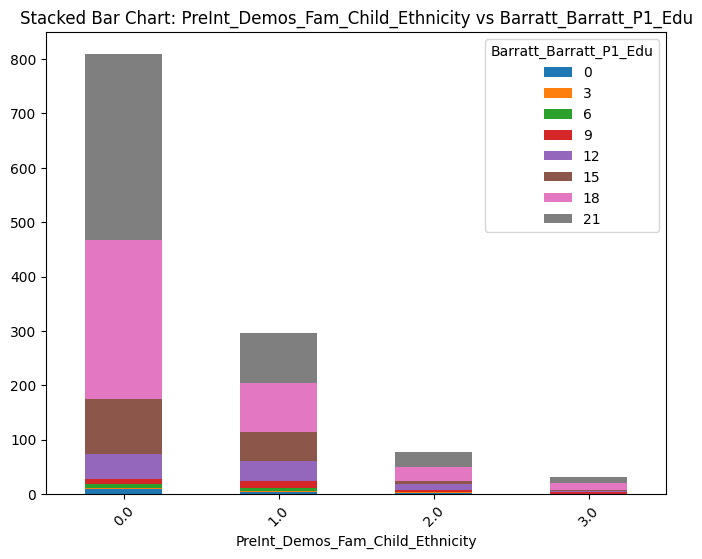


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Ethnicity vs Barratt_Barratt_P1_Occ
Barratt_Barratt_P1_Occ             0   5   10  15  20  25   30   35   40   45
PreInt_Demos_Fam_Child_Ethnicity                                             
0.0                               217  15   1  10  14  47  101  150  112  142
1.0                                65  16   2  20  14  27   41   48   31   32
2.0                                25   0   2   3   2   3    9   17    8    8
3.0                                10   0   1   2   1   2    3    4    3    5


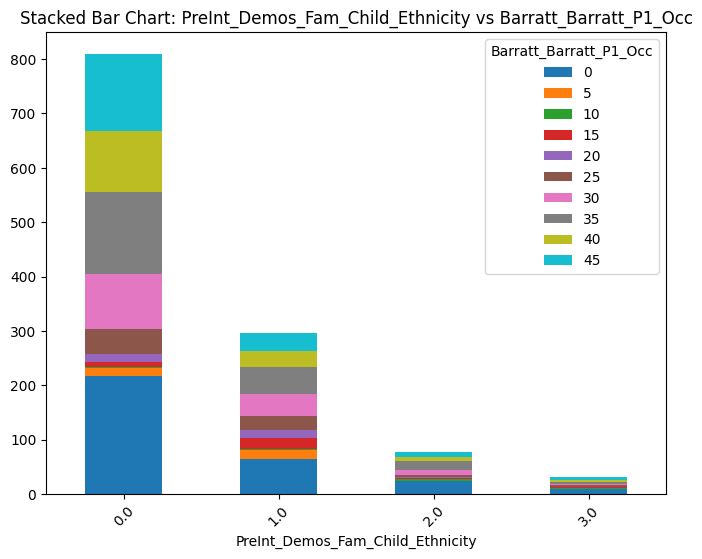


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Ethnicity vs Barratt_Barratt_P2_Edu
Barratt_Barratt_P2_Edu             0   3   6   9   12   15   18   21
PreInt_Demos_Fam_Child_Ethnicity                                    
0.0                               104   2   9  17  93  109  214  261
1.0                                67   3   4  23  54   46   59   40
2.0                                18   0   1   3  11    8   19   17
3.0                                 9   0   0   1   4    3    9    5


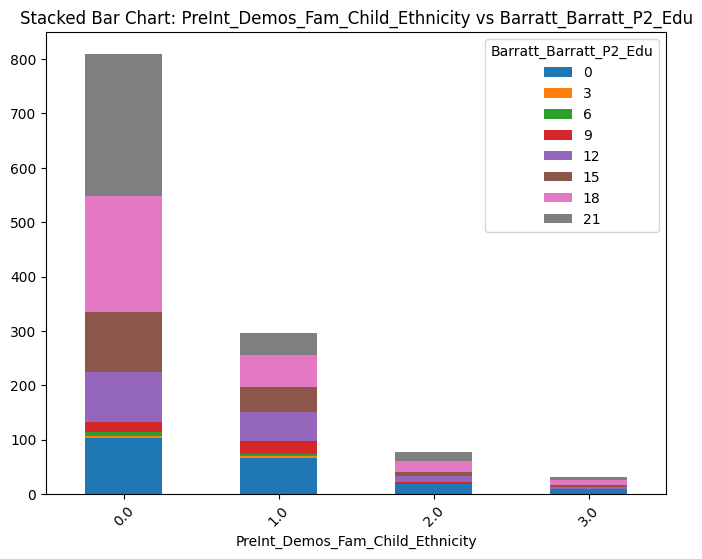


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Ethnicity vs Barratt_Barratt_P2_Occ
Barratt_Barratt_P2_Occ             0   5   10  15  20  25  30   35  40   45
PreInt_Demos_Fam_Child_Ethnicity                                           
0.0                               167  14  21  47  23  17  98  133  88  201
1.0                                87  18  14  29  13   7  39   45  19   25
2.0                                22   6   1   6   2   1   7   15   7   10
3.0                                11   0   1   4   3   0   5    2   2    3


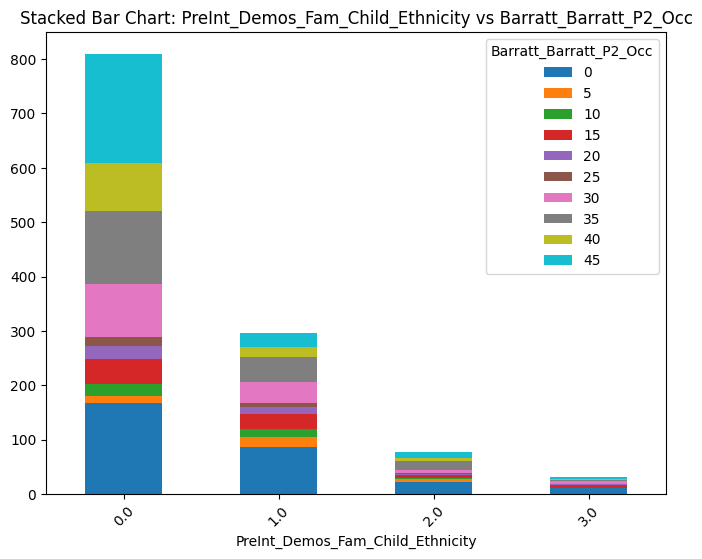


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Race vs MRI_Track_Scan_Location
MRI_Track_Scan_Location      0   1    2    3   4
PreInt_Demos_Fam_Child_Race                     
0                            3  92  310  208  14
1                            0  33   54   86   8
2                            0  13   64   47   4
3                            0   3   13   14   0
4                            0   4    2    4   0
7                            0   0    1    1   0
8                            0  25   73   90   7
9                            0   6    8    7   2
10                           0   3    6    2   0
11                           0   0    1    4   1


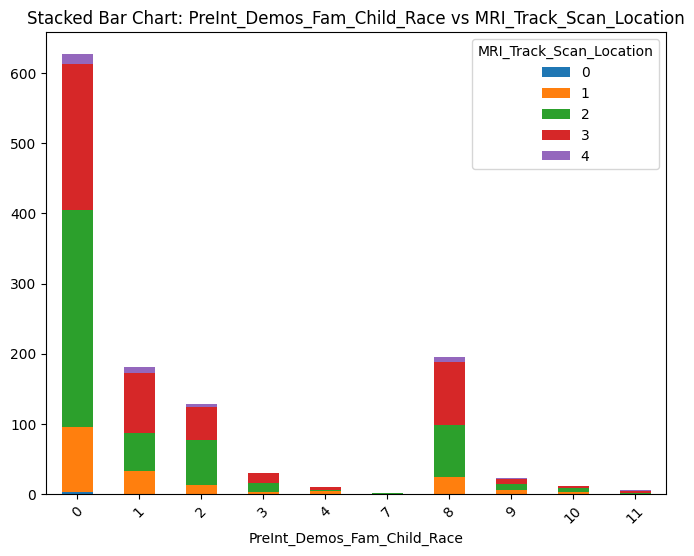


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Race vs Barratt_Barratt_P1_Edu
Barratt_Barratt_P1_Edu       0   3   6   9   12  15   18   21
PreInt_Demos_Fam_Child_Race                                  
0                             3   0   6   7  42  73  218  278
1                             4   1   3  11  19  28   63   52
2                             2   2   3   6  18  27   40   30
3                             0   0   1   0   1   2   13   13
4                             0   0   0   0   0   1    2    7
7                             0   0   0   0   0   0    0    2
8                             5   0   2   4   9  25   73   77
9                             1   1   0   0   5   5    4    7
10                            0   0   0   0   3   0    6    2
11                            0   1   0   0   0   1    2    2


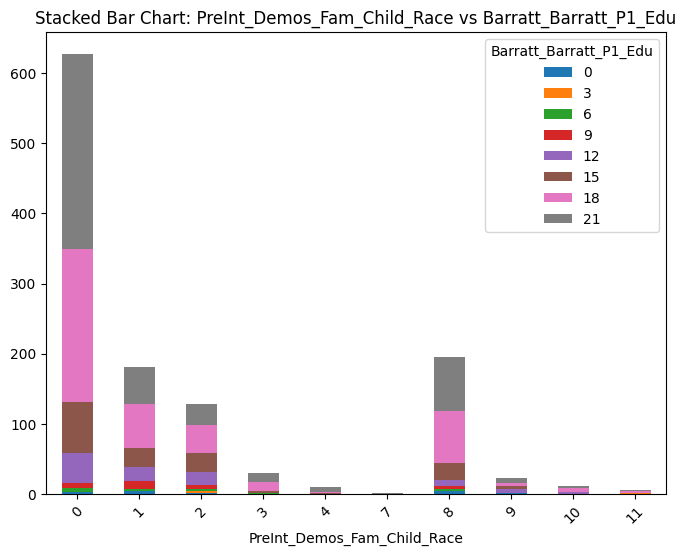


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Race vs Barratt_Barratt_P1_Occ
Barratt_Barratt_P1_Occ        0   5   10  15  20  25  30   35  40   45
PreInt_Demos_Fam_Child_Race                                           
0                            169  11   1  10   8  37  73  106  90  122
1                             45   7   2   6   5  11  23   40  23   19
2                             24   6   1  12  11   7  19   24  14   10
3                              6   0   1   0   2   4   2    8   2    5
4                              3   0   0   0   0   0   0    6   0    1
7                              0   0   0   0   0   0   1    0   1    0
8                             59   5   1   4   4  19  29   26  24   24
9                              7   2   0   1   0   0   5    3   0    5
10                             2   0   0   2   1   1   1    3   0    1
11                             2   0   0   0   0   0   1    3   0    0


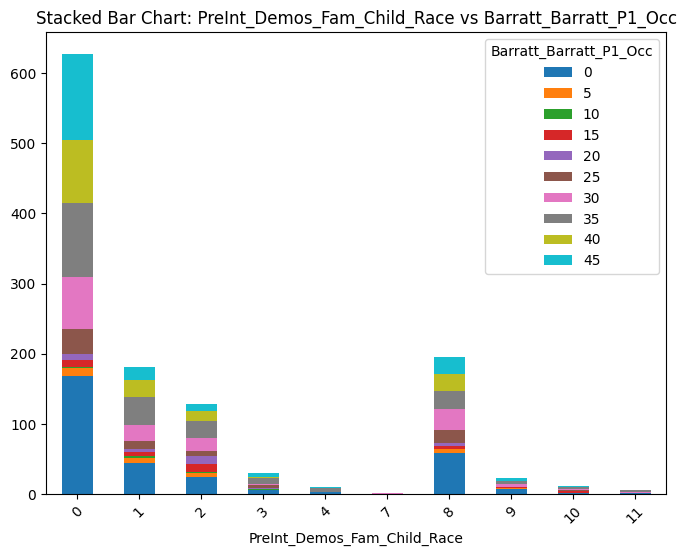


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Race vs Barratt_Barratt_P2_Edu
Barratt_Barratt_P2_Edu       0   3   6   9   12  15   18   21
PreInt_Demos_Fam_Child_Race                                  
0                            52   0   5  16  74  89  181  210
1                            64   1   3   5  34  21   30   23
2                            27   1   3  10  26  21   24   16
3                             1   0   1   0   1   3   11   13
4                             1   0   0   0   0   1    2    6
7                             0   0   0   0   1   0    1    0
8                            36   2   2  12  21  28   44   50
9                            11   0   0   0   2   3    3    4
10                            4   0   0   1   3   0    2    1
11                            2   1   0   0   0   0    3    0


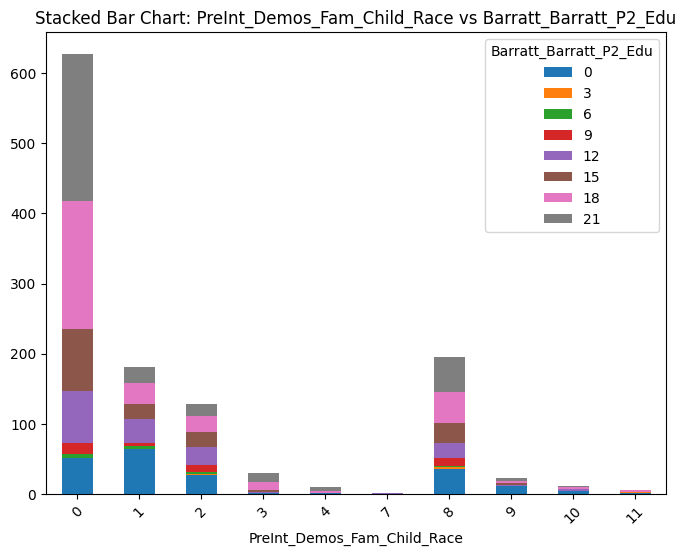


📌 Cross-tabulation: PreInt_Demos_Fam_Child_Race vs Barratt_Barratt_P2_Occ
Barratt_Barratt_P2_Occ        0   5   10  15  20  25  30   35  40   45
PreInt_Demos_Fam_Child_Race                                           
0                            102  11  19  32  16  14  81  113  76  163
1                             74   9   4  19  11   4  15   22  11   12
2                             36   9   8  15   6   3  16   16  10    9
3                              4   1   2   1   0   0   5    8   2    7
4                              1   1   0   5   0   0   0    0   0    3
7                              0   0   1   0   0   0   0    0   0    1
8                             52   4   2  11   7   3  26   32  17   41
9                             12   0   0   2   1   1   2    2   0    3
10                             3   3   1   1   0   0   2    1   0    0
11                             3   0   0   0   0   0   2    1   0    0


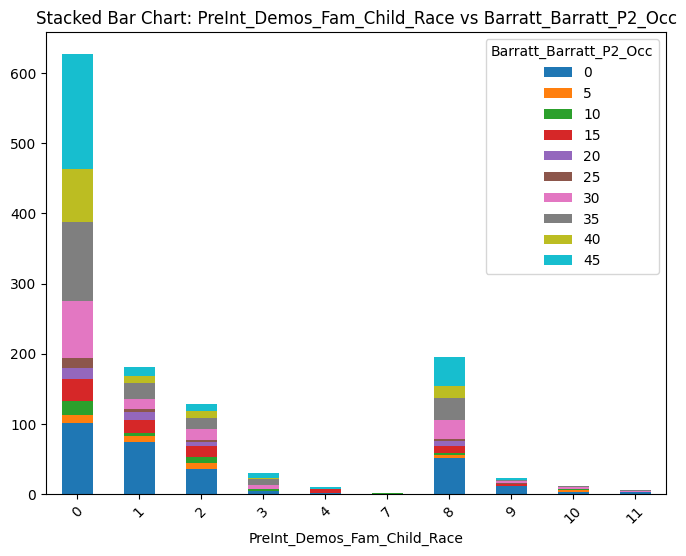


📌 Cross-tabulation: MRI_Track_Scan_Location vs Barratt_Barratt_P1_Edu
Barratt_Barratt_P1_Edu   0   3   6   9   12  15   18   21
MRI_Track_Scan_Location                                  
0                         0   0   0   0   0   1    1    1
1                         1   1   4   9  31  27   55   51
2                         6   1   8  14  44  78  177  204
3                         7   3   3   5  19  51  177  198
4                         1   0   0   0   3   5   11   16


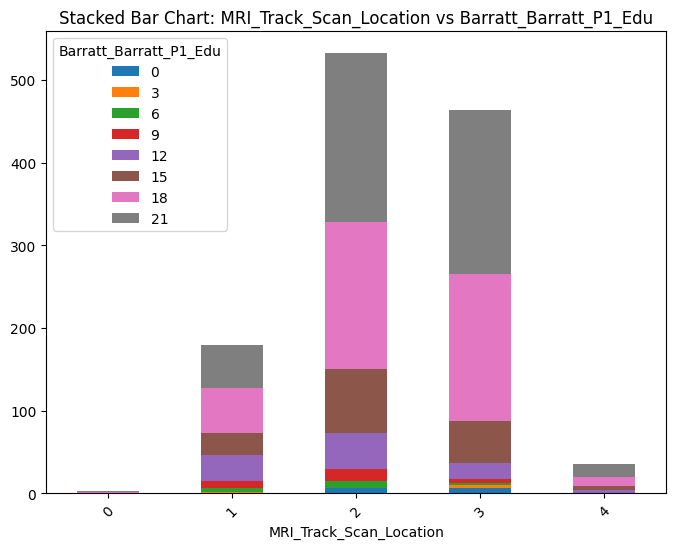


📌 Cross-tabulation: MRI_Track_Scan_Location vs Barratt_Barratt_P1_Occ
Barratt_Barratt_P1_Occ    0   5   10  15  20  25  30   35  40  45
MRI_Track_Scan_Location                                          
0                          1   0   0   0   0   1   0    0   1   0
1                         44  10   2   5   9  16  13   42  19  19
2                        150   9   2  16  14  28  59  103  74  77
3                        115  10   2  14   8  32  75   69  55  83
4                          7   2   0   0   0   2   7    5   5   8


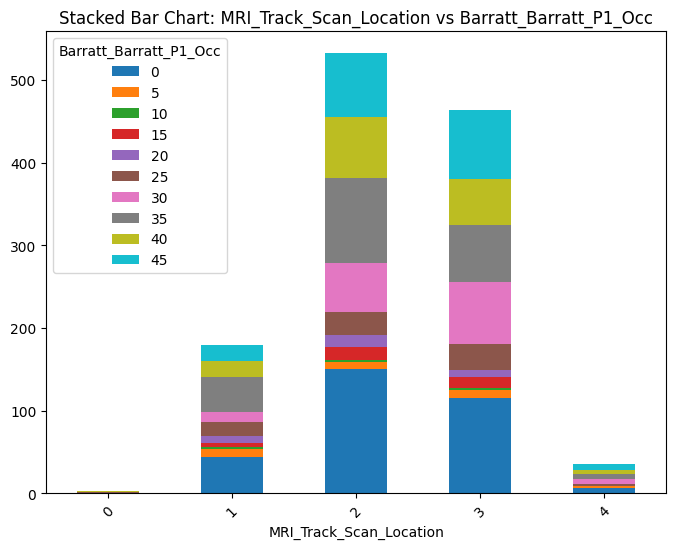


📌 Cross-tabulation: MRI_Track_Scan_Location vs Barratt_Barratt_P2_Edu
Barratt_Barratt_P2_Edu   0   3   6   9   12  15   18   21
MRI_Track_Scan_Location                                  
0                         0   0   0   0   0   0    2    1
1                        41   2   2   6  47  17   34   30
2                        68   0   7  29  73  89  125  141
3                        81   3   5   9  39  55  129  142
4                         8   0   0   0   3   5   11    9


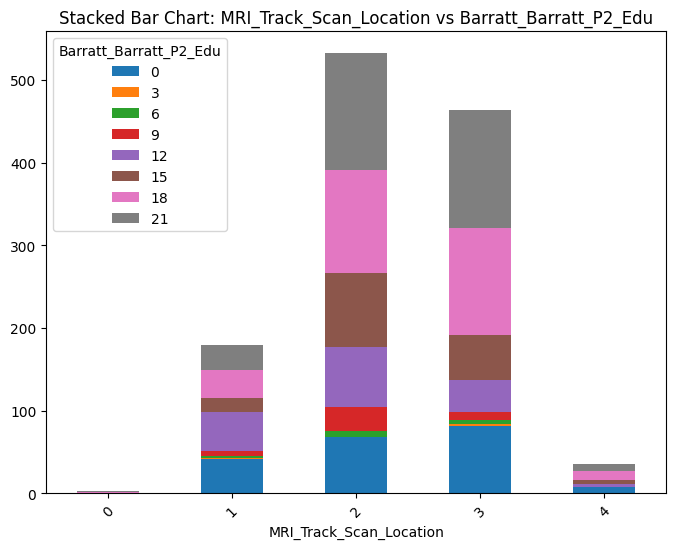


📌 Cross-tabulation: MRI_Track_Scan_Location vs Barratt_Barratt_P2_Occ
Barratt_Barratt_P2_Occ    0   5   10  15  20  25  30  35  40   45
MRI_Track_Scan_Location                                          
0                          0   0   0   0   0   0   0   1   0    2
1                         49  11  11  20  12   5  17  28   7   19
2                        118  12  17  40  17   7  68  97  61   95
3                        108  15   8  25  11  11  59  65  45  116
4                         12   0   1   1   1   2   5   4   3    7


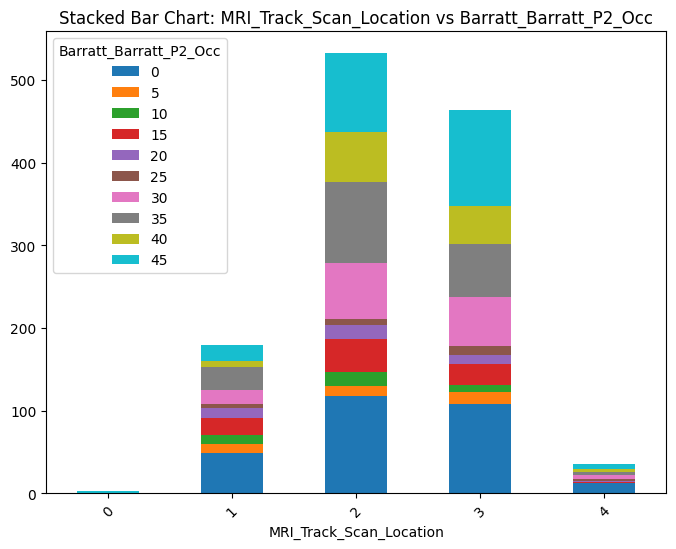


📌 Cross-tabulation: Barratt_Barratt_P1_Edu vs Barratt_Barratt_P1_Occ
Barratt_Barratt_P1_Occ   0   5   10  15  20  25  30  35   40   45
Barratt_Barratt_P1_Edu                                           
0                        14   0   0   0   0   1   0   0    0    0
3                         2   1   0   0   0   0   0   1    0    1
6                        11   1   0   1   1   0   0   1    0    0
9                        13   6   1   1   2   1   2   2    0    0
12                       31  11   1  10   6  12  11  13    1    1
15                       49   8   1   8  10  21  20  30    8    7
18                      127   3   3   9   8  29  78  94   36   34
21                       70   1   0   6   4  15  43  78  109  144


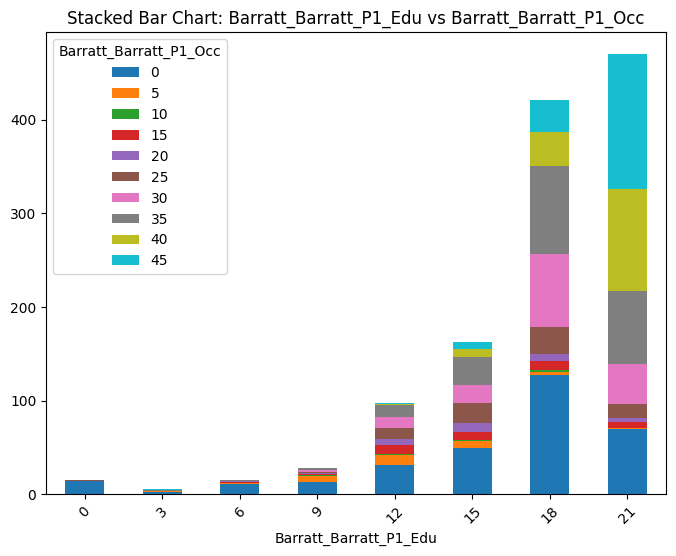


📌 Cross-tabulation: Barratt_Barratt_P1_Edu vs Barratt_Barratt_P2_Edu
Barratt_Barratt_P2_Edu  0   3   6   9   12  15   18   21
Barratt_Barratt_P1_Edu                                  
0                       13   0   0   0   0   0    1    1
3                        3   0   1   0   0   0    0    1
6                        6   1   4   3   0   0    1    0
9                       10   0   0   5   5   3    3    2
12                      23   0   1   5  30  16   17    5
15                      34   1   4   7  28  33   29   26
18                      61   1   3   7  65  59  139   86
21                      48   2   1  17  34  55  111  202


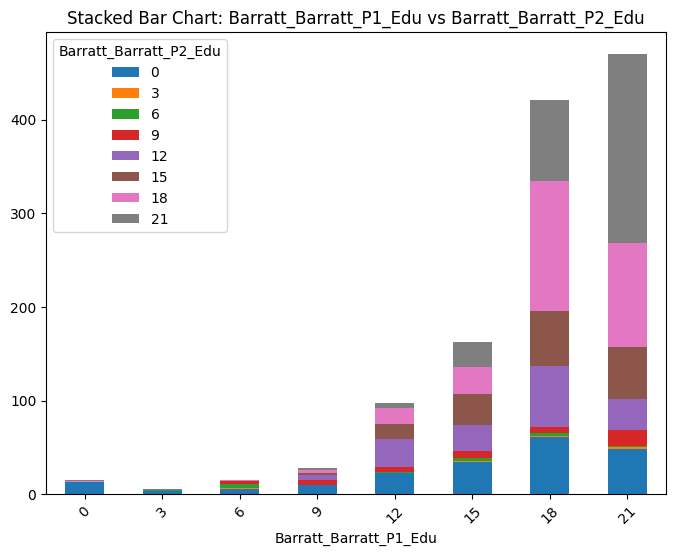


📌 Cross-tabulation: Barratt_Barratt_P1_Edu vs Barratt_Barratt_P2_Occ
Barratt_Barratt_P2_Occ  0   5   10  15  20  25  30  35  40   45
Barratt_Barratt_P1_Edu                                         
0                       15   0   0   0   0   0   0   0   0    0
3                        3   0   0   1   0   0   1   0   0    0
6                        9   1   2   1   1   0   1   0   0    0
9                       10   2   2   4   1   1   3   3   1    1
12                      29   9   4  15   3   5   4  18   4    6
15                      46   4  10  15   8   3  21  31  12   12
18                      97  14  12  30  12   6  61  67  39   83
21                      78   8   7  20  16  10  58  76  60  137


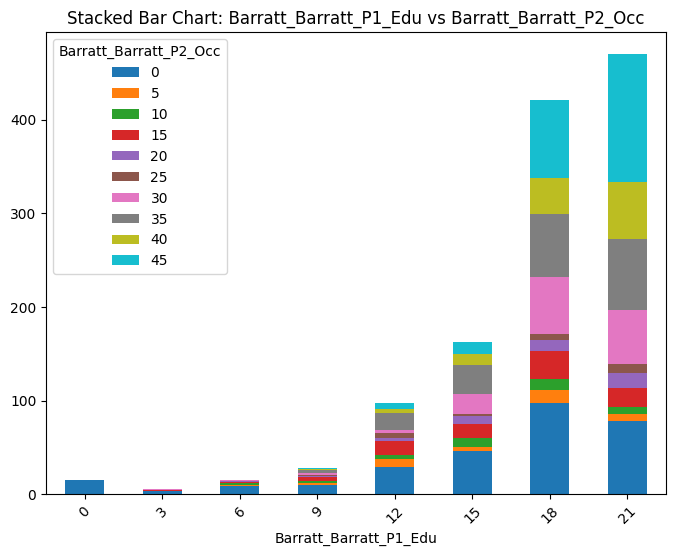


📌 Cross-tabulation: Barratt_Barratt_P1_Occ vs Barratt_Barratt_P2_Edu
Barratt_Barratt_P2_Edu  0   3   6   9   12  15  18  21
Barratt_Barratt_P1_Occ                                
0                       67   2   3   8  38  31  86  82
5                       10   0   3   3   5   2   4   4
10                       0   0   0   1   2   0   3   0
15                       9   1   1   3   4   7   5   5
20                       6   0   2   1  10   5   4   3
25                       9   0   1   4  22  12  17  14
30                      17   0   1   7  24  29  45  31
35                      43   2   2   5  26  34  56  51
40                      22   0   0  10  22  20  33  47
45                      15   0   1   2   9  26  48  86


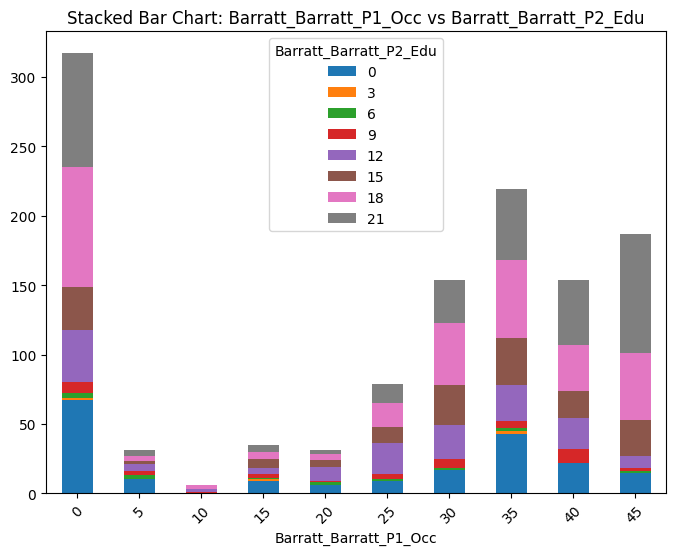


📌 Cross-tabulation: Barratt_Barratt_P1_Occ vs Barratt_Barratt_P2_Occ
Barratt_Barratt_P2_Occ  0   5   10  15  20  25  30  35  40  45
Barratt_Barratt_P1_Occ                                        
0                       97   8  13  10   6   5  28  43  21  86
5                       11   2   2   6   2   1   1   3   1   2
10                       2   1   0   1   1   0   1   0   0   0
15                      13   3   1   9   0   0   1   7   0   1
20                       8   0   5   3   1   1   2   8   1   2
25                      15   4   6  10   6   6  11  14   5   2
30                      30   5   2  11   4   2  45  27  12  16
35                      48   8   4  25   8   5  21  53  19  28
40                      35   4   3   5  10   4  18  14  40  21
45                      28   3   1   6   3   1  21  26  17  81


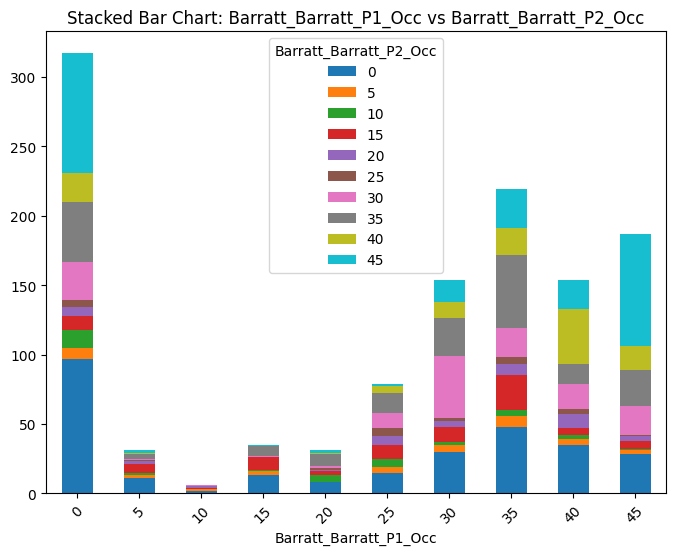


📌 Cross-tabulation: Barratt_Barratt_P2_Edu vs Barratt_Barratt_P2_Occ
Barratt_Barratt_P2_Occ   0   5   10  15  20  25  30  35  40   45
Barratt_Barratt_P2_Edu                                          
0                       187   1   0   4   3   0   0   0   0    3
3                         3   1   0   1   0   0   0   0   0    0
6                         5   2   2   2   1   0   1   1   0    0
9                         9   8   3   6   9   2   4   1   0    2
12                       17  15  18  41  16   6  21  21   6    1
15                       20   6   8  15   8   4  35  48   8   14
18                       27   4   5   9   4  12  63  67  33   77
21                       19   1   1   8   0   1  25  57  69  142


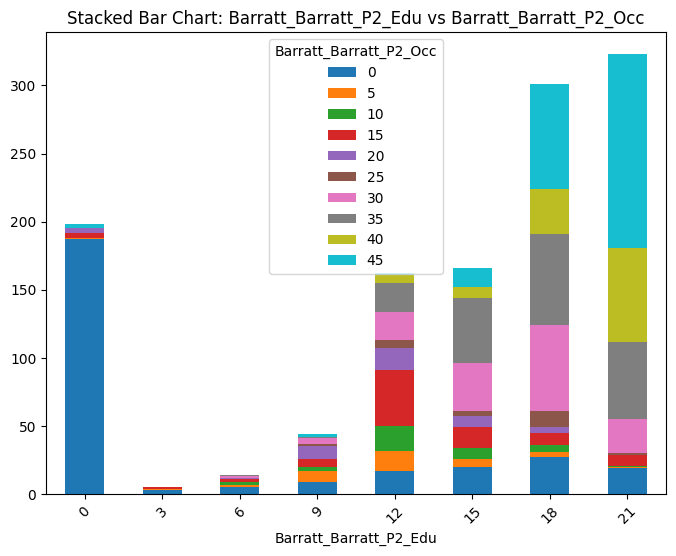

In [50]:
# Cross-tabulation and stacked bar charts for all categorical pairs
for i in range(len(categorical_cols)):
    for j in range(i+1, len(categorical_cols)):
        cross_tab = pd.crosstab(metadata_b[categorical_cols[i]], metadata_b[categorical_cols[j]])
        print(f"\n📌 Cross-tabulation: {categorical_cols[i]} vs {categorical_cols[j]}")
        print(cross_tab)

        cross_tab.plot(kind='bar', stacked=True, figsize=(8,6))
        plt.title(f"Stacked Bar Chart: {categorical_cols[i]} vs {categorical_cols[j]}")
        plt.xticks(rotation=45)
        plt.show()


### 4️⃣ Handling Outliers & Transformations

💡 Goal: Detect and manage extreme values for better model performance

✅ Steps:

- Detect outliers using box plots or Z-score (scipy.stats.zscore()).
- Remove or cap extreme values (df[df['column'] < threshold]).
- Apply transformations if needed:
-- Log transformation for skewed data.
-- Scaling (MinMaxScaler, StandardScaler).

### 5️⃣ Feature Engineering & Encoding

💡 Goal: Transform data into a format suitable for machine learning

✅ Steps:

📌 Encoding categorical variables

- One-hot encoding (pd.get_dummies(df, columns=['categorical_column'])).
- Label encoding (sklearn.preprocessing.LabelEncoder()).

📌 Feature Engineering

- Create new features (e.g., age groups from age).
- Extract date components (year, month, etc.).

📌 Dimensionality Reduction (if needed)

- PCA (Principal Component Analysis) for high-dimensional data.

### 6️⃣ Splitting Data for Training & Model Preparation

💡 Goal: Prepare dataset for modeling

✅ Steps:

- Separate features and target (X = df.drop(columns=['target']), y = df['target']).
- Train-test split (train_test_split(X, y, test_size=0.2, random_state=42)).
- Check class distribution (for imbalanced data).
- Balance data if necessary (SMOTE, oversampling).